In [664]:
# importing the needed packages

import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import ticker, cm
import seaborn as sns

from scipy.stats import zscore

from math import ceil
from collections import Counter

from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.model_selection import train_test_split, GroupShuffleSplit
from sklearn.linear_model import LogisticRegression, LassoCV, Ridge, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as imbPipeline
import lightgbm as lgb
import xgboost as xgb

from collections import defaultdict
from scipy.stats import hmean
from scipy.spatial.distance import cdist
from scipy import stats
import numbers

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
import umap.umap_ as UMAP
from sklearn.base import BaseEstimator, TransformerMixin

import tensorflow as tf
from tensorflow.keras import Sequential, layers, initializers, regularizers, losses, callbacks, optimizers
from tensorflow.keras.utils import plot_model

from sklearn.feature_selection import SelectKBest, chi2
import shap
from xgboost.core import Booster
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc
from itertools import cycle

<div class="alert alert-block alert-info">

# Credit Scores
    
</div>

- Miguel Teodoro, number: 53127

**What business problem are you solving?**

We are building a model to categorize and predict an individual’s credit score (which represents their credit risk, or the likelihood that they will pay their bills on time) based on several metrics and information. 


**Elaborate why is this a relevant problem, and what can you do with the model output to create business value, i.e., how is the model output actionable.**

A credit score is an important metric for both banks and individuals in today’s financial world. For the former, it allows the evaluation of an individual’s or a business’s reliability when deciding whether or not to accept a loan application, how much the bank will be willing to lend and other factors such as term and interest rate offered. For the latter, it is the metric that allows them to get better deals on mortgages, lower interest rates on loans and, most important of all, be able to take these loans.

Correctly estimating credit score is crucial for banks and institutions that lend money, as, for example, lending money to a business that is fated to not be able to pay the loan back may be a sizable loss in assets. As such, wrongfully predicting a credit score has drastic consequences to a lender. In this situation, Type 1 errors (False positive error, in this case, predicting that an individual or a business has a good credit score and low credit risk while their credit risk is high or very high.)  are significantly more costly and should be avoided. On the other hand, Type 2 errors (False negative error, in this case, predicting that an individual or a business has a low credit score and high credit risk while their credit risk is low or very low) do make the company lose out on potential additional gains, but do not actively make the organization lose money/assets.

In regards to the creation of business value, being able to correctly predict which debtors are worth investing in is key for the regular functioning of an organization that lends money/assets. If a company is able to improve such accuracy it will generate larger, less risky gains, while cutting down on assets lost on loans to companies or individuals that went under, and were unable to pay back with interest.  Apart from deciding whether or not to lend , an accurate prediction of credit scores helps companies decide the best interest rate and term to apply to different loans, depending on the risk indicated by the score.


**What is the machine learning problem that you are solving?**

It is a classification problem, where the goal is to build a model that classifies an individual’s credit score as poor, standard or good, based on a series of variables. The target is the individual’s credit score classification. 


<a id = "toc"></a>

1. [Data Understanding](#data-understanding)
2. [Data Preparation](#data-preparation)
3. [Data Visualization](#visualizations)
4. [Data Scaling](#data-scaling)
5. [Feature Selection](#feature-selection)
5. [Modelling](#modelling)
6. [Evaluation](#evaluation)
7. [Next Steps](#nxt-steps)

<a id = "data-understanding"></a>
    
## 1. Data Understanding

<a id = "understanding-index"></a>

- [1.1. Import the datasets](#import-datasets)
- [1.2. Split the datasets](#split-datasets)
- [1.3. Variable types](#variable-types)
- [1.4. Descriptive statistics](#descriptive-stats)

[Back to TOC](#toc)

<a id = "import-datasets"></a>

### 1.1. Import the datasets

[Back to Data Understanding](#understanding-index)

In [665]:
# importing the dataset, using Pandas function read_csv

df = pd.read_csv('train.csv')
df.head()

Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


The `ID` uniquely identifies each one of the observations, as the index of the Pandas dataframe does just that, we will remove it.

In [666]:
df.drop('ID', axis=1, inplace = True)
df.head()

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [667]:
# Count duplicated rows
df.duplicated().sum()

0

As we can observe, there are no duplicated rows.

<a id = "split-datasets"></a>

### 1.2. Split the datasets

[Back to Data Understanding](#understanding-index)

We will start by splitting our dataset between a train set (75%) and a test set (25%).
A copy of the original dataset should be created, because during the preprocessing stage we usually try different things, so we should have a copy before doing something wrong with the original data.

As we are dealing with a very specific dataset, where we have multiple observations per customer, we will try to keep all customer informations in the same split (so that we don't use data referring to one customer, to predict itself). Meaning we will separate randomly customers between test and train set, and not the entire data.

Example of costumer observation: (This is a constant in the dataset)

In [668]:
df[df.Customer_ID == 'CUS_0xd40'].T

,0,1,2,3,4,5,6,7
Customer_ID,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40
Month,January,February,March,April,May,June,July,August
Name,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,NaN
Age,23,23,-500,23,23,23,23,23
SSN,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,#F%$D@*&8
Occupation,Scientist,Scientist,Scientist,Scientist,Scientist,Scientist,Scientist,Scientist
Annual_Income,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12
Monthly_Inhand_Salary,1824.843333,NaN,NaN,NaN,1824.843333,NaN,1824.843333,1824.843333
Num_Bank_Accounts,3,3,3,3,3,3,3,3
Num_Credit_Card,4,4,4,4,4,4,4,4


In [669]:
df.Customer_ID.value_counts()

CUS_0xd40     8
CUS_0x9bf4    8
CUS_0x5ae3    8
CUS_0xbe9a    8
CUS_0x4874    8
             ..
CUS_0x2eb4    8
CUS_0x7863    8
CUS_0x9d89    8
CUS_0xc045    8
CUS_0x942c    8
Name: Customer_ID, Length: 12500, dtype: int64

As one can see, we have 8 observations per individual customer ID. This means that we have 8 different observations for each individual to be measured and analysed later on. We also noticed that 8 is the only value, so we do not have to correct anything pertaining to the number of individual observations.

Now, we will work to split the training and test set based on indexes, so an individual customer's observations do not get split between train and test sets.

In [670]:
# Set the customer ID as the grouping variable
groups = df['Customer_ID']

# Define the number of splits and the test set size
n_splits = 1
test_size = 0.25

# Create an instance of GroupShuffleSplit and use it to split the data
gss = GroupShuffleSplit(n_splits=n_splits, test_size=test_size, random_state=5)
train_idx, test_idx = next(gss.split(df, groups=groups))

# Split the data into training and test sets based on the indexes
train = df.loc[train_idx]
test = df.loc[test_idx]

In [671]:
# Running this code for both train an test we can observe we accomplished what we wanted

# test.Customer_ID.value_counts()
# train.Customer_ID.value_counts()

In [672]:
df_original = df.copy()

In [673]:
df = train.copy()

In [674]:
copy_train = train.copy()

Firstly, we start by checking the shape of our dataset.

In [675]:
df.shape

(75000, 27)

We can observe that there are 75.000 observations in the training set, and 27 features. Meaning we have 100.000 observations in the original dataset.

In [676]:
df, train_y = df.drop('Credit_Score', axis=1), df['Credit_Score']

<a id = "variable-types"></a>

### 1.3. Variable types

[Back to Data Understanding](#understanding-index)

In [677]:
# checking the data types of the variables of the dataset and if there are any missing values

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75000 entries, 16 to 99999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_ID               75000 non-null  object 
 1   Month                     75000 non-null  object 
 2   Name                      67457 non-null  object 
 3   Age                       75000 non-null  object 
 4   SSN                       75000 non-null  object 
 5   Occupation                75000 non-null  object 
 6   Annual_Income             75000 non-null  object 
 7   Monthly_Inhand_Salary     63719 non-null  float64
 8   Num_Bank_Accounts         75000 non-null  int64  
 9   Num_Credit_Card           75000 non-null  int64  
 10  Interest_Rate             75000 non-null  int64  
 11  Num_of_Loan               75000 non-null  object 
 12  Type_of_Loan              66560 non-null  object 
 13  Delay_from_due_date       75000 non-null  int64  
 14  Num_o

From this information, it can be seen that variables: `Name`; `Monthly_Inhand_Salary`; `Type_of_Loan`; `Num_of_Delayed_Payment`; `Num_Credit_Inquiries`; `Credit_History_Age`; `Amount_invested_monthly` and `Monthly_Balance` have missing values.

Regarding the type of the variables, plenty are assumed as object, but should actually be numeric, such as clear examples like `Age`, `Num_of_Delayed_Payment`, `Amount_invested_monthly`, etc.

#### **Underscores**

By quickly scanning trough the dataset we find multiple values with an underscore. Below is one example pertaining to the variable "Number of Delayed Payments". However, more can be found throught the entire dataset in other variables, so we will create a function that scans for such a character and cleans it up.

In [678]:
df.Num_of_Delayed_Payment[df.Num_of_Delayed_Payment.str.contains(r'_') == True]

124      14_
141      12_
298      22_
324      14_
404      11_
        ... 
99817    10_
99897    10_
99904     7_
99939    19_
99953     7_
Name: Num_of_Delayed_Payment, Length: 2073, dtype: object

The first step was to perform general transformations of the variables and then analyze them individually to better see if more specific transformations needed to be done. By general transformations, one is refering to underscores, mismatches in the formatting of some value, etc.

In [679]:
# Create a function that checks if column contains strings with underscores

def check_underscores(df, column):
    return df[column][df[column].str.contains(r'_') == True].any()

# Create a function that counts number of values that contain underscores

def count_underscore_strs(df, column):
    return df[column].str.contains(r'_').sum()

# List with variables that should contain underscores
should_underscore = ['Customer_ID', 'Payment_Behaviour']

# List with variables to check for underscores and remove if existing
change_list = df.drop(should_underscore, axis=1).select_dtypes(exclude=['float64','int64']).columns.to_list()

# Create a function that replaces underscores with nothing

def remove_underscores(df, list_columns, comments=False):
    for col in list_columns:
        if check_underscores(df, col) and comments:
            print("------------------")
            print("Current: ", col)
            print("Previous values w/ _ : ", count_underscore_strs(df, col))
            df[col] = df[col].str.replace('_','')
            print("Now values w/ _ : ", count_underscore_strs(df, col))
        elif check_underscores(df, col) and not comments:
            df[col] = df[col].str.replace('_','')

remove_underscores(df, change_list, comments=True)

------------------
Current:  Age
Previous values w/ _ :  3682
Now values w/ _ :  0
------------------
Current:  Occupation
Previous values w/ _ :  9923
Now values w/ _ :  0
------------------
Current:  Annual_Income
Previous values w/ _ :  5227
Now values w/ _ :  0
------------------
Current:  Num_of_Loan
Previous values w/ _ :  3588
Now values w/ _ :  0
------------------
Current:  Num_of_Delayed_Payment
Previous values w/ _ :  2073
Now values w/ _ :  0
------------------
Current:  Changed_Credit_Limit
Previous values w/ _ :  1538
Now values w/ _ :  0
------------------
Current:  Credit_Mix
Previous values w/ _ :  15204
Now values w/ _ :  0
------------------
Current:  Outstanding_Debt
Previous values w/ _ :  757
Now values w/ _ :  0
------------------
Current:  Amount_invested_monthly
Previous values w/ _ :  3233
Now values w/ _ :  0
------------------
Current:  Monthly_Balance
Previous values w/ _ :  8
Now values w/ _ :  0


Above we can see how many values had underscores before the cleaning and after, with cases such as occupation having almost 10.000 values with underscores being reduced to 0 and properly cleaned. Below we can also see the example we utilized above:

In [680]:
df.Num_of_Delayed_Payment[df.Num_of_Delayed_Payment.str.contains(r'_') == True]

Series([], Name: Num_of_Delayed_Payment, dtype: object)

### **Empty strings**

We can notice that we have some empty strings in the df, so we will replace them by NaN.

In [681]:
df[df == ''].head()

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
16,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [682]:
# Check empty strings

def check_empty(df, column):
    return '' in df[column].values


# Substitution of '' for NaN

def replace_space(df, list_columns):
    for col in list_columns:
        if check_empty(df, col):
            df[col] = df[col].replace('', np.NaN)

replace_space(df, df.columns)

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [683]:
df[df == ''].head()

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


As one can see, the empty spaces were properly replaced by NaN.

### **Transform column types**

As said above, we have many variables that have the object type when they should be integers or floats. The code below aims to correct this issue.

In [684]:
# Function that transforms the columns to integers or floats

def pass_integer(df, column):
    df[column] = df[column].astype("int64")

def pass_float(df, column):
    df[column] = df[column].astype("float64")

# Implementation of the previous functions in the data

# Columns to pass to integer
integer_list = ['Age', 'Num_of_Loan']

# Columns to pass to float
float_list = ['Annual_Income', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Outstanding_Debt', 'Amount_invested_monthly', 'Monthly_Balance']

# Function to transform columns
def transform_coltypes(df, ints, floats):
    for col in ints:
        pass_integer(df, col)
    for col in floats:
        pass_float(df, col)

transform_coltypes(df, integer_list, float_list)

In [685]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75000 entries, 16 to 99999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_ID               75000 non-null  object 
 1   Month                     75000 non-null  object 
 2   Name                      67457 non-null  object 
 3   Age                       75000 non-null  int64  
 4   SSN                       75000 non-null  object 
 5   Occupation                69682 non-null  object 
 6   Annual_Income             75000 non-null  float64
 7   Monthly_Inhand_Salary     63719 non-null  float64
 8   Num_Bank_Accounts         75000 non-null  int64  
 9   Num_Credit_Card           75000 non-null  int64  
 10  Interest_Rate             75000 non-null  int64  
 11  Num_of_Loan               75000 non-null  int64  
 12  Type_of_Loan              66560 non-null  object 
 13  Delay_from_due_date       75000 non-null  int64  
 14  Num_o

We were able to fix the data types mistakes.

<a id = "descriptive-stats"></a>

### 1.4. Descriptive Statistics

[Back to TOC](#toc)

In [686]:
# Description of the numerical variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,75000.0,1.090294e+02,6.790691e+02,-5.000000e+02,24.000000,33.000000,42.000000,8.698000e+03
Annual_Income,75000.0,1.805859e+05,1.457099e+06,7.005930e+03,19543.440000,37578.610000,72629.325000,2.417715e+07
Monthly_Inhand_Salary,63719.0,4.190480e+03,3.174239e+03,3.036454e+02,1632.487917,3091.260833,5955.193333,1.520463e+04
Num_Bank_Accounts,75000.0,1.708796e+01,1.170824e+02,-1.000000e+00,3.000000,6.000000,8.000000,1.798000e+03
Num_Credit_Card,75000.0,2.279125e+01,1.302572e+02,0.000000e+00,4.000000,6.000000,7.000000,1.499000e+03
Interest_Rate,75000.0,7.097560e+01,4.586678e+02,1.000000e+00,8.000000,14.000000,20.000000,5.789000e+03
Num_of_Loan,75000.0,3.017173e+00,6.266525e+01,-1.000000e+02,1.000000,3.000000,5.000000,1.496000e+03
Delay_from_due_date,75000.0,2.104571e+01,1.484053e+01,-5.000000e+00,10.000000,18.000000,28.000000,6.700000e+01
Num_of_Delayed_Payment,69752.0,3.154020e+01,2.299167e+02,-3.000000e+00,9.000000,14.000000,18.000000,4.397000e+03
Changed_Credit_Limit,73462.0,1.044681e+01,6.803189e+00,-6.480000e+00,5.390000,9.460000,15.020000,3.697000e+01


We can notice from the get-go that the max values will have to be severely adjusted, with numbers reaching the hundreds of millions when such scale does not make realistic sense. Another element of note is the negative numbers in columns such as 'Num_Bank_Accounts' or 'Num_of_Delayed_Payment', in which it makes no sense for a person to, for example, have a negative number of bank accounts. These and other inconsistencies will be properly treated below.

In [687]:
# Description of the categorical variables
df.describe(include = ['O']).T

,count,unique,top,freq
Customer_ID,75000,9375,CUS_0x2dbc,8
Month,75000,8,January,9375
Name,67457,7990,Langep,44
SSN,75000,9376,#F%$D@*&8,4157
Occupation,69682,15,Lawyer,5058
Type_of_Loan,66560,4932,Not Specified,1048
Credit_Mix,59796,3,Standard,27279
Credit_History_Age,68241,403,19 Years and 5 Months,340
Payment_of_Min_Amount,75000,3,Yes,39390
Payment_Behaviour,75000,7,Low_spent_Small_value_payments,19039


As we can see, plenty of variables need to be individually treated, as they present bogus values such as "#F%$D@*&8" or obvious typos in names, for example. This treatment is what we will do in the Data Preparation section below. 

<a id = "data-preparation"></a>
    
## 2. Data Preparation

1. [Initial Drops](#idrop)
2. [Data Preparation Functions](#preparation-functions)
3. [Initial Transformations](#initial-transf)
4. [Preparation Numerical Variables](#check-numvar)
5. [Preparation Categorical Variables](#check-catvar)

[Back to TOC](#toc)


Our Data Preparation has very specific conditions, since we are provided with a dataset for which we can match information between observations because of the Customer ID. Therefore, we will take advantage of the fact that we can use a customer's observation, to fix other observations for the same customer.

As an initial consideration regarding feature availability at the time of model roll-out, we assume that all our features will be available since banks not only collect information regarding clients upon loan contraction, but also throughout that period, and should have mechanisms to keep up with the customer's personal finances.

<a id = "idrop"></a>

### 2.1. Initial Drops

[Back to Data Preparation](#data-preparation)

Since variables such as: `Name` and `SSN` (Social Security Number) add no information in the context of what how work will focus on, they will be removed (As we already have each individual's ID and specific index, such identification valuables are simply superfluous and would only serve to overcrowd a possible model). 

Another variable of initial interest is 'Credit History Age'. This variable is formatted in numbers and letters, giving us an estimate of the total time that the individual has of credit history. Here are a few examples:

In [688]:
df['Credit_History_Age'].value_counts()

19 Years and 5 Months     340
19 Years and 4 Months     337
15 Years and 11 Months    327
19 Years and 3 Months     327
17 Years and 9 Months     322
                         ... 
0 Years and 4 Months       26
0 Years and 3 Months       15
33 Years and 7 Months      13
0 Years and 2 Months       10
33 Years and 8 Months      10
Name: Credit_History_Age, Length: 403, dtype: int64

In this case, we can notice that this variable may be difficult to use in a machine learning model because of its non-numeric format. As we know, many  algorithms require that the data be in numerical form, which means that we would need to transform this data into numerical format. For example, one could convert the years and months into a total number of months, but we thought that this would be a possibly very time-consuming and error-prone process for a variable where it is not clear that it would be a strong predictor of creditworthiness, even if it were in numerical form. While credit history may be a relevant factor in a few cases in the classification of credit score, the length of time since a credit account was opened may not be as predictive as many other factors like payment behavior or debt-to-income ratio. As such, there are several other variables in this dataset that could be more directly relevant to credit scoring. For example, the `Monthly_Inhand_Salary` variable is a measure of the individual's disposable income, which could be a strong predictor of creditworthiness. Similarly, the `Outstanding_Debt` and `Credit_Utilization_Ratio` variables are both measures of the individual's debt load, which could also be important predictors. Finally, the `Payment_Behaviour` variable is a measure of the individual's past payment behavior, which is a key factor in credit scoring.

In the end, we opted to drop this more workload-heavy variable in order to focus on more important features that can better explain and predict and individual's credit score and avoid possible transformation errors that may affect our model training when treating this variable. (Not only that, but the variable also has many missing values, proving to be a further challenge in working it into something useful for prediction.)

In [689]:
drop_cols = ["Name", "SSN", "Credit_History_Age"]
df.drop(drop_cols, axis=1, inplace=True)

<a id = "preparation-functions"></a>

### 2.2. Data Preparation Functions

In this section, we prepare some functions to be used when treating our data.

[Back to Data Preparation](#data-preparation)

In [690]:
# Function that replaces a specific value by None
def remove_aimed(df, column, value):
    df[column] = df[column].replace(value, np.nan)

In [691]:
# Function that replaces negative values with NaN values
def replaceNegative(df, col):
        df[col] = df[col].mask(df[col] < 0, np.nan)

In [692]:
# Replace all values of an individual in a given variable by the individual's mode

def replaceAll_mode(df, variable):

    # Find the mode for the variable per individual ID, to correct the impossible values.
    groups = df.groupby('Customer_ID')[variable].apply(lambda x: x.mode()[0])

    # Create a mask to locate individuals that have different values than in the groupby function previously created
    mask = (df[variable] != df['Customer_ID'].map(groups)) & (df['Customer_ID'].isin(groups.index))
    
    # Apply the changes, replacing these values by the most common value per Individual ID
    df.loc[mask, variable] = df.loc[mask, 'Customer_ID'].map(groups)

In [693]:
# Replace a specific value in a given variable by the corresponding individual's mode

def replaceSpec_mode(df, variable, value, comment=False):

    # Find the mode for the variable per individual ID, to correct the chosen values.
    groups = df.groupby('Customer_ID')[variable].apply(lambda x: x.mode()[0])

    # Define condition for change
    condition = (df[variable] == value)

    # Show how many values are we changing as a % of total df
    if comment:
        print(f"{(condition.sum() / len(df)):.5f} % of values changed.")

    # Create a mask to locate individuals that have different values than in the groupby function previously created
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    
    # Apply the changes, replacing these values by the most common value per Individual ID
    df.loc[mask, variable] = df.loc[mask, 'Customer_ID'].map(groups)

In [694]:
# Replace values of an individual in a given variable by the individual's median, if those values are further away from the median that the defined treshold

def replaceTreshold_median(df, variable, treshold, integer=False, comment=False):

    # Find the mode for the variable per individual ID, to correct the impossible values.
    if not integer:
        groups = df.groupby('Customer_ID')[variable].apply(lambda x: x.median())
    else:
        groups = df.groupby('Customer_ID')[variable].apply(lambda x: int(x.median()))

    # Define condition for outlier
    condition = (df[variable] > (1+treshold)*df['Customer_ID'].map(groups)) | (df[variable] < (1-treshold)*df['Customer_ID'].map(groups))

    # Show how many values are we changing as a % of total df
    if comment:
        print(f"{(condition.sum() / len(df)):.5f} % of values changed.")

    # Create a mask to locate individuals that have different values than in the groupby function previously created
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    
    # Apply the changes, replacing these values by the most common value per Individual ID
    df.loc[mask, variable] = df.loc[mask, 'Customer_ID'].map(groups)

In [695]:
# Replace values of an individual in a given variable by the individual's mode, if those values are over a defined treshold (difference from previous is this threshold is defined as a fixed number)

def replaceAbove_mode(df, variable, treshold, comment=False):

    # Find the mode for the variable per individual ID, to correct the impossible values.
    groups = df.groupby('Customer_ID')[variable].apply(lambda x: x.mode()[0])

    # Define condition for outlier
    condition = (df[variable] > treshold)

    # Show how many values are we changing as a % of total df
    if comment:
        print(f"{(condition.sum() / len(df)):.5f} % of values changed.")

    # Create a mask to locate individuals that have different values than in the groupby function previously created
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    
    # Apply the changes, replacing these values by the most common value per Individual ID
    df.loc[mask, variable] = df.loc[mask, 'Customer_ID'].map(groups)

In [696]:
# Replace values of an individual in a given variable by the individual's median, if those values are below a defined treshold

def replaceBelow_median(df, variable, treshold, comment=False):

    # Find the mode for the variable per individual ID, to correct the impossible values.
    groups = df.groupby('Customer_ID')[variable].apply(lambda x: x.median())

    # Define condition for outlier
    condition = (df[variable] < treshold)

    # Show how many values are we changing as a % of total df
    if comment:
        print(f"{(condition.sum() / len(df)):.5f} % of values changed.")

    # Create a mask to locate individuals that have different values than in the groupby function previously created
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    
    # Apply the changes, replacing these values by the most common value per Individual ID
    df.loc[mask, variable] = df.loc[mask, 'Customer_ID'].map(groups)

In [697]:
# Count number of instances where a costumer has no observations for a given variable 

def check_VariableClientNA(df, variable):
    
    na_clients = []
    grouped_df = df.groupby('Customer_ID')
    
    # Loop over each client
    for id, group in grouped_df:
        
        # Check if all observations of the variable are NA
        if group[variable].isna().all():
            na_clients.append(id)
            
    print(len(na_clients))

In [698]:
# Replace missing values by the customer's median

def replaceNA_median(df, variable, integer = False, comment=False):
    
    # Find the mode for the variable per individual ID, to correct the impossible values.
    if not integer:
        groups = df.groupby('Customer_ID')[variable].apply(lambda x: x.median())
    else:
        groups = df.groupby('Customer_ID')[variable].apply(lambda x: int(x.median()))

    # Define condition for outlier
    condition = (df[variable].isna())

    # Show how many values are we changing as a % of total df
    if comment:
        print(f"{(condition.sum() / len(df)):.5f} % of values changed.")

    # Create a mask to locate individuals that have different values than in the groupby function previously created
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    
    # Apply the changes, replacing these values by the most common value per Individual ID
    df.loc[mask, variable] = df.loc[mask, 'Customer_ID'].map(groups)

In [699]:
# Replace specific values  below threshold by predefined number

def replaceBelow_spec(df, variable, threshold, replace_by):
    
    df[variable].mask(df[variable] < threshold, replace_by, inplace=True)

<a id = "initial-transf"></a>

### 2.3. Initial Transformations

[Back to Data Preparation](#data-preparation)

We start by transforming all negative values to NA, from the variables where it does not make sense to have them. As one can see, negative ages or income, number of bank accounts or even loan interest rate cannot be negative as it makes no realistic sense.

In [700]:
negativeCols = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Interest_Rate', 'Num_of_Loan', 'Num_of_Delayed_Payment', 'Delay_from_due_date', 'Changed_Credit_Limit']

print('Negative values in columns \n')
for column in negativeCols:
    print(f"{column}: {((df[column][df[column] < 0].count() / len(df))*100):.3f} %")

Negative values in columns 

Age: 0.885 %
Annual_Income: 0.000 %
Monthly_Inhand_Salary: 0.000 %
Num_Bank_Accounts: 0.019 %
Interest_Rate: 0.000 %
Num_of_Loan: 3.848 %
Num_of_Delayed_Payment: 0.652 %
Delay_from_due_date: 0.595 %
Changed_Credit_Limit: 1.592 %


We can see that they do not have significant representation, nor does it make sense to have negative numbers in these variable, as such, by transforming them to NA, we won't be losing relevant information.

Again, here is the table where we can see negative values in these variables, for clearer visualization of the changes:

In [701]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,75000.0,1.090294e+02,6.790691e+02,-5.000000e+02,24.000000,33.000000,42.000000,8.698000e+03
Annual_Income,75000.0,1.805859e+05,1.457099e+06,7.005930e+03,19543.440000,37578.610000,72629.325000,2.417715e+07
Monthly_Inhand_Salary,63719.0,4.190480e+03,3.174239e+03,3.036454e+02,1632.487917,3091.260833,5955.193333,1.520463e+04
Num_Bank_Accounts,75000.0,1.708796e+01,1.170824e+02,-1.000000e+00,3.000000,6.000000,8.000000,1.798000e+03
Num_Credit_Card,75000.0,2.279125e+01,1.302572e+02,0.000000e+00,4.000000,6.000000,7.000000,1.499000e+03
Interest_Rate,75000.0,7.097560e+01,4.586678e+02,1.000000e+00,8.000000,14.000000,20.000000,5.789000e+03
Num_of_Loan,75000.0,3.017173e+00,6.266525e+01,-1.000000e+02,1.000000,3.000000,5.000000,1.496000e+03
Delay_from_due_date,75000.0,2.104571e+01,1.484053e+01,-5.000000e+00,10.000000,18.000000,28.000000,6.700000e+01
Num_of_Delayed_Payment,69752.0,3.154020e+01,2.299167e+02,-3.000000e+00,9.000000,14.000000,18.000000,4.397000e+03
Changed_Credit_Limit,73462.0,1.044681e+01,6.803189e+00,-6.480000e+00,5.390000,9.460000,15.020000,3.697000e+01


In [702]:
def replaceNegativeCols(df, list_replaced):
    for col in list_replaced:
        replaceNegative(df, col)

replaceNegativeCols(df, negativeCols)

In [703]:
# Description of the numerical variables to visualize all previous transformations. Notice only Monthly Balance keeps negatives.
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,74336.0,1.144695e+02,6.796405e+02,1.400000e+01,25.000000,33.000000,42.000000,8.698000e+03
Annual_Income,75000.0,1.805859e+05,1.457099e+06,7.005930e+03,19543.440000,37578.610000,72629.325000,2.417715e+07
Monthly_Inhand_Salary,63719.0,4.190480e+03,3.174239e+03,3.036454e+02,1632.487917,3091.260833,5955.193333,1.520463e+04
Num_Bank_Accounts,74986.0,1.709134e+01,1.170930e+02,0.000000e+00,3.000000,6.000000,8.000000,1.798000e+03
Num_Credit_Card,75000.0,2.279125e+01,1.302572e+02,0.000000e+00,4.000000,6.000000,7.000000,1.499000e+03
Interest_Rate,75000.0,7.097560e+01,4.586678e+02,1.000000e+00,8.000000,14.000000,20.000000,5.789000e+03
Num_of_Loan,72114.0,7.139917e+00,6.035210e+01,0.000000e+00,2.000000,3.000000,5.000000,1.496000e+03
Delay_from_due_date,74554.0,2.118491e+01,1.477469e+01,0.000000e+00,10.000000,18.000000,28.000000,6.700000e+01
Num_of_Delayed_Payment,69263.0,3.177460e+01,2.307099e+02,0.000000e+00,9.000000,14.000000,18.000000,4.397000e+03
Changed_Credit_Limit,72268.0,1.065828e+01,6.652324e+00,0.000000e+00,5.640000,9.580000,15.150000,3.697000e+01


It is observable that after cleaning only Monthly Balance keep possible negative values them, as it makes sense for this variable to have them.

In [704]:
# Create a function to contain all that has been done so far and input into the pipeline so that it can be used later on.

def initial_transformations(df):

    # remove underscores
    for col in change_list:
        if check_underscores(df, col):
            df[col] = df[col].str.replace('_','')

    # replace empty strings
    for col in list(df.columns):
        if check_empty(df, col):
            df[col] = df[col].replace('', np.NaN)

    # transform types to integers and floats
    for col in integer_list:
        df[col] = df[col].astype("float64").round().astype("int64")
    for col in float_list:
        df[col] = df[col].astype("float64")

    # initial drops
    drop_cols = ["Name", "SSN", "Credit_History_Age"]
    df = df.drop(drop_cols, axis=1)

    # replace negative values in columns
    for col in negativeCols:
        df[col] = df[col].mask(df[col] < 0, np.nan) 

    return df

initial_transformer = Pipeline(steps=[
    ('initialTransform', FunctionTransformer(initial_transformations))])


<a id = "check-numvar"></a>

### 2.4. Preparation Numerical Variables

1. [Age](#check-age)
2. [Annual Income](#check-annual-income)
3. [Monthly In-Hand Salary](#check-month-salary)
4. [Number of Bank Accounts](#check-bank-acc)
5. [Number of Credit Cards](#check-cred-card)
6. [Interest Rate](#check-interest)
7. [Number of Loans](#check-nloans)
8. [Delay from Due Date](#check-delay)
9. [Number of Delayed Payments](#check-ndelayed)
10. [Changed Credit Limit](#check-cred-lim)
11. [Number of Credit Inquiries](#check-ninquire)
12. [Outstanding Debt](#check-out-debt)
13. [Credit Utilization Ratio](#check-cred-use)
14. [Total EMI per Month](#check-emi)
15. [Amount Invested Monthly](#check-amnt-inv)
16. [Monthly Balance](#check-month-bal)

[Back to Data Preparation](#data-preparation)

[Advance to Categorical Variables](#check-catvar)

Visualization of numerical variables to understand what data preparation may be necessary.

In [705]:
def plot_dist_var(data, var, bins=20):
    """
    function that plots a histogram for specific numerical feature
    """

    plt.hist(data[var], bins = bins, color = '#8d99ae')
    plt.title(f'Histogram with {bins} bins for variable: {var}', fontsize = 12)

    # showing the plot
    plt.show()

In [706]:
def plot_histogram(data, mf, lines):
    """
    function that plots a histogram for each numerical feature
    input lines: is to determine the number of lines to configure the plot
    """
    # preparing the figure by creating individual axes where each histogram will be placed
    fig, axes = plt.subplots(lines, ceil(len(mf) / lines), figsize = (30, 20), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each histogram:
    for ax, feat in zip(axes.flatten(), mf):
        ax.hist(data[feat], bins = 20, color = '#8d99ae')
        ax.set_xlabel(feat, fontsize = 10)

    fig.suptitle('Histograms with 20 bins for all numeric variables', fontsize = 12)

    # showing the plot
    plt.show()

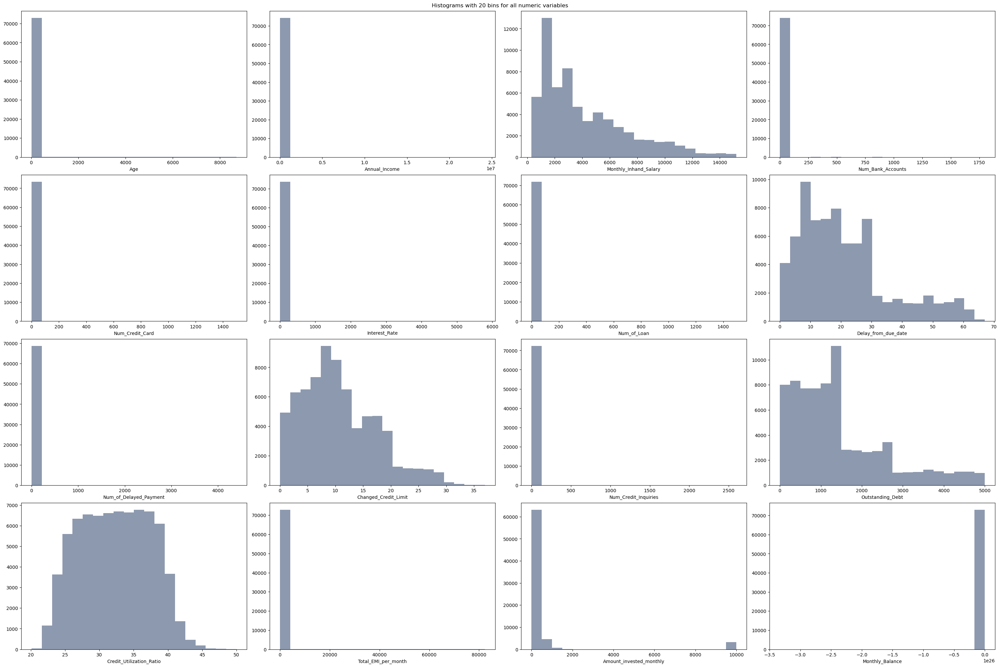

In [707]:
numerical=df.select_dtypes(include=['float64','int64']).columns
plot_histogram(df, numerical, 4)

<a id = "check-age"></a>

##### 2.4.1. Age

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [708]:
df['Age'].value_counts()

26.0      2272
38.0      2253
25.0      2253
31.0      2209
28.0      2207
          ... 
1176.0       1
111.0        1
7490.0       1
5551.0       1
4808.0       1
Name: Age, Length: 1332, dtype: int64

As we can see in the visualization (Graph) and value counts above, some ages are much higher than humanly possible. To fix this error we decided to replace all values by the respective customer's mode. It makes sense that all costumers hold the same Age throughout the dataset. Also, even if there were to be a change from one month to another, it would be an irrelevant change, in our opinion (only one year). Also, we want to avoid under 18 registers, so if we are left with any under 18 values, we replace them by 18. (This is motivated because banks generally do not loan money to under-18s, leading us to believe it was a possible mistake in data imputation on part of who gathered information for the dataset. We opted for the cleanest solution of simply considering these individuals were 18, as they were rare occurences and had the age of 17, for example.)

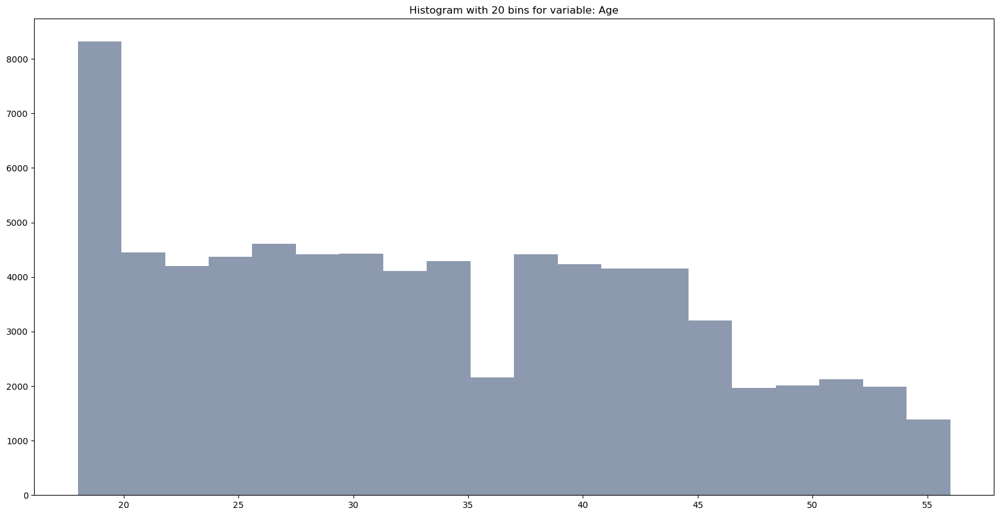

In [709]:
replaceAll_mode(df, 'Age')
replaceBelow_spec(df, 'Age', 18, 18)
plot_dist_var(df, 'Age')

In [710]:
df['Age'].value_counts()

18.0    6144
25.0    2360
26.0    2360
28.0    2320
31.0    2312
38.0    2248
21.0    2248
27.0    2248
20.0    2208
35.0    2176
19.0    2176
22.0    2168
37.0    2168
36.0    2160
32.0    2152
44.0    2136
39.0    2136
34.0    2120
41.0    2112
30.0    2112
40.0    2104
29.0    2096
42.0    2040
23.0    2032
43.0    2024
24.0    2008
45.0    1968
33.0    1960
46.0    1232
55.0    1136
49.0    1088
51.0    1072
48.0    1056
52.0    1056
53.0    1024
54.0     960
50.0     920
47.0     912
56.0     248
Name: Age, dtype: int64

As we can see, the problem has been solved and the problematic ages replaced. The minimum age is now 18 and the maximum age is now 56 (coming directly from the database, not arbitrarily set).

Possible explanation: The bank bank could be relatively new, and it's possible that it hasn't been operating long enough to have many long-term customers. This means that most of the customers in the database are likely to be relatively new customers, who have opened accounts with the bank within the past few years. It's also possible that the bank has a policy of targeting younger customers, perhaps because they are seen as more likely to take out loans or invest in financial products over the long term. This could lead to a bias towards younger customers in the database.

<a id = "check-annual-income"></a>

##### 2.4.2. Annual Income

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

We will assume that the a customer's annual income did not change massively from one month to the other (no more than 25%, as it seems a reasonably estimated number that allows for some flexibility in changes, but will capture the more extreme values), because while it is possible for a person's income to change significantly in a short period, it is less common, especially for those who have stable jobs or businesses. Therefore, it is safe to assume that any significant change in income is an error or anomaly, and it should be corrected. We will be applying the mode of the Annual Income for each individual that had their Annual Income changed too drastically, correcting outliers.

0.01027 % of values changed.


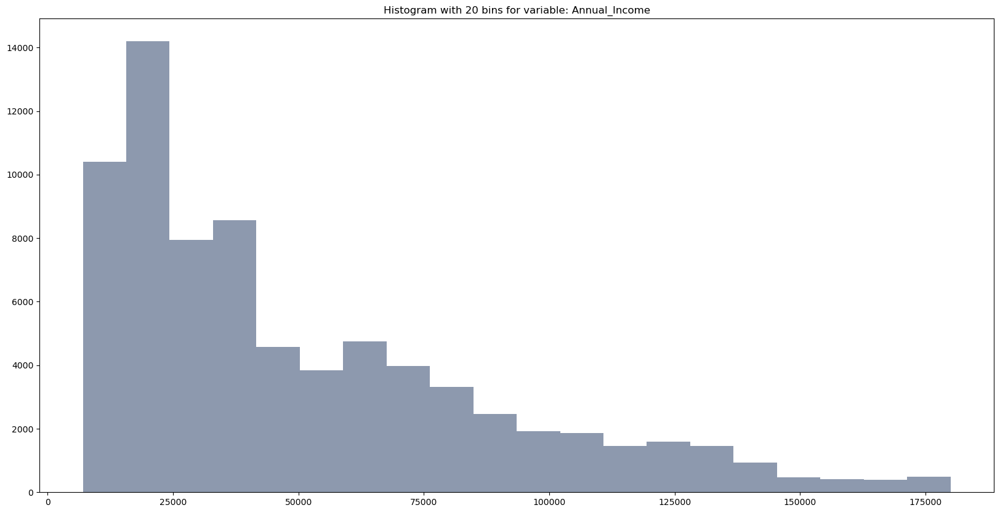

In [711]:
replaceTreshold_median(df, 'Annual_Income', 0.25, comment=True)
plot_dist_var(df, 'Annual_Income')

In [712]:
df['Annual_Income'].corr(df['Monthly_Inhand_Salary'])

0.9981688034402507

In the case where two variables are highly correlated, including both in a machine learning model may lead to multicollinearity, where one variable can be predicted accurately by another variable. This can lead to instability in the model, making it difficult to interpret and making the predictions less reliable.

As this variable is highly correlated to `Monthly_Inhand_Salary`, and we can get the same information from a variable that did not need any modification, we decided to drop it.

In [713]:
df.drop('Annual_Income', axis=1, inplace=True)

In this specific case, the variable that was dropped, Annual_Income, was found to be highly correlated with another variable in the dataset, Monthly_Inhand_Salary. This means that the two variables likely provided similar information and including both in a model may not have added much additional predictive power. By dropping Annual_Income, the model can be simplified and made more efficient while still capturing the relevant information from Monthly_Inhand_Salary.

<a id = "check-month-salary"></a>

##### 2.4.3. Monthly In-Hand Salary

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

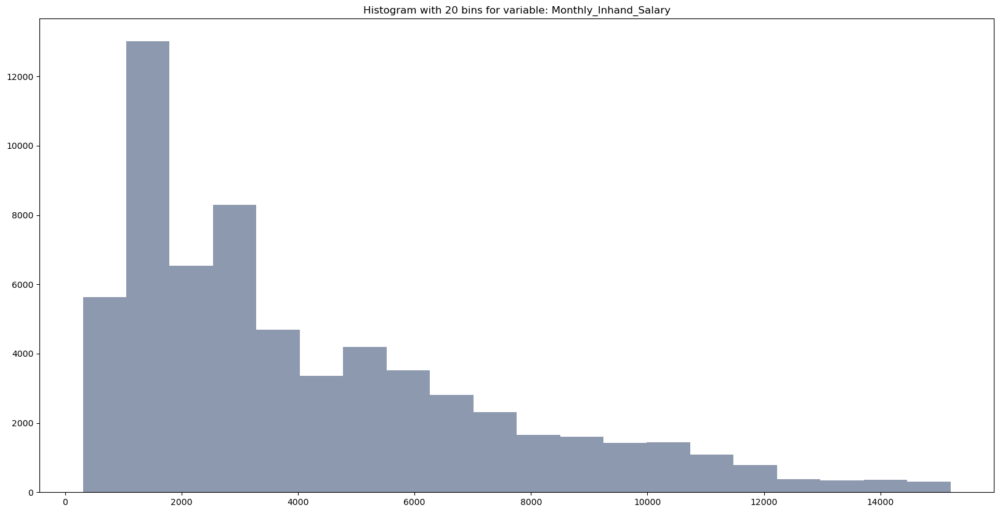

In [714]:
plot_dist_var(df, 'Monthly_Inhand_Salary')

Variable values look reasonable so no changes were made to the data at this point.

<a id = "check-bank-acc"></a>

##### 2.4.4. Number of Bank Accounts

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [715]:
df['Num_Bank_Accounts'].value_counts()

7.0       9705
8.0       9613
6.0       9529
5.0       9247
4.0       8923
          ... 
243.0        1
583.0        1
1695.0       1
430.0        1
697.0        1
Name: Num_Bank_Accounts, Length: 768, dtype: int64

By observing the distribution of this variable, we can see that there are impossible values, with very few individuals having 1000+ bank accounts. The following code will correct these outlier values and make sure every individual has an appropriate number of bank accounts registered. In this case, we considered the most Bank Accounts an individual should have at the same time would be 10. Nevertheless, if there really is an individual with more across the 8 months of data, those values will remain above 10, since we are substituting for the median. (As we are considering that there are no changes or swings in the number of bank account for individuals during these 8 months, in order to correct mistakes and simplify the variable so it can be more easily interpreted by models)

We also chose the 10 account number cutoff because there is a sudden drop in the number of individuals with such values, and from that point on the only values presented are mostly bogus values that need to be corrected. Below is the example:

In [716]:
filtered_data = df[df['Num_Bank_Accounts'] <= 10]
filtered_data['Num_Bank_Accounts'].value_counts()

7.0     9705
8.0     9613
6.0     9529
5.0     9247
4.0     8923
3.0     8802
9.0     4167
10.0    4046
1.0     3447
2.0     3319
0.0     3193
Name: Num_Bank_Accounts, dtype: int64

In [717]:
filtered_data = df[df['Num_Bank_Accounts'] > 10]
filtered_data['Num_Bank_Accounts'].value_counts()

791.0     5
11.0      5
1668.0    5
857.0     4
1096.0    4
         ..
186.0     1
616.0     1
99.0      1
288.0     1
697.0     1
Name: Num_Bank_Accounts, Length: 757, dtype: int64

Now we will proceed to the correction:

0.01327 % of values changed.


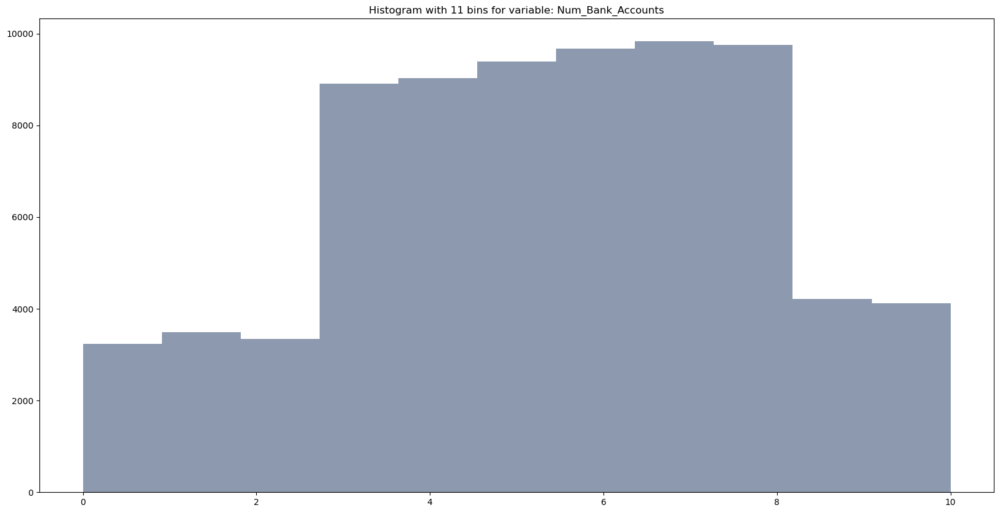

In [718]:
replaceAbove_mode(df, 'Num_Bank_Accounts', 10, comment=True)
plot_dist_var(df, 'Num_Bank_Accounts', 11)

As we can see, the numbers are now within a reasonable [0, 10] range.

<a id = "check-cred-card"></a>

##### 2.4.5. Number of Credit Cards

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [719]:
df['Num_Credit_Card'].value_counts()

5       13707
7       12580
6       12558
4       10251
3        9857
        ...  
1118        1
495         1
248         1
440         1
679         1
Name: Num_Credit_Card, Length: 1045, dtype: int64

We have the same problem with this variable as the one presented above. We will apply the same solution in order to correct these values. As a treshold for # of Credit Cards we used 11, meaning, customer can't have 12 or more. Reasoning is again, if it has more as its median, we will keep those values.

The cutoff point has the same justification as the one before, as we noticed a more or less natural cutoff point after 11 to mostly bogus values that need to be corrected.

In [720]:
filtered_data = df[df['Num_Credit_Card'] <= 12]
filtered_data['Num_Credit_Card'].value_counts()

5     13707
7     12580
6     12558
4     10251
3      9857
8      3789
10     3681
9      3552
2      1647
1      1614
11       20
0        11
Name: Num_Credit_Card, dtype: int64

In [721]:
filtered_data = df[df['Num_Credit_Card'] > 11]
filtered_data['Num_Credit_Card'].value_counts()

849    7
852    7
218    6
92     6
579    5
      ..
495    1
248    1
440    1
374    1
679    1
Name: Num_Credit_Card, Length: 1033, dtype: int64

0.02311 % of values changed.


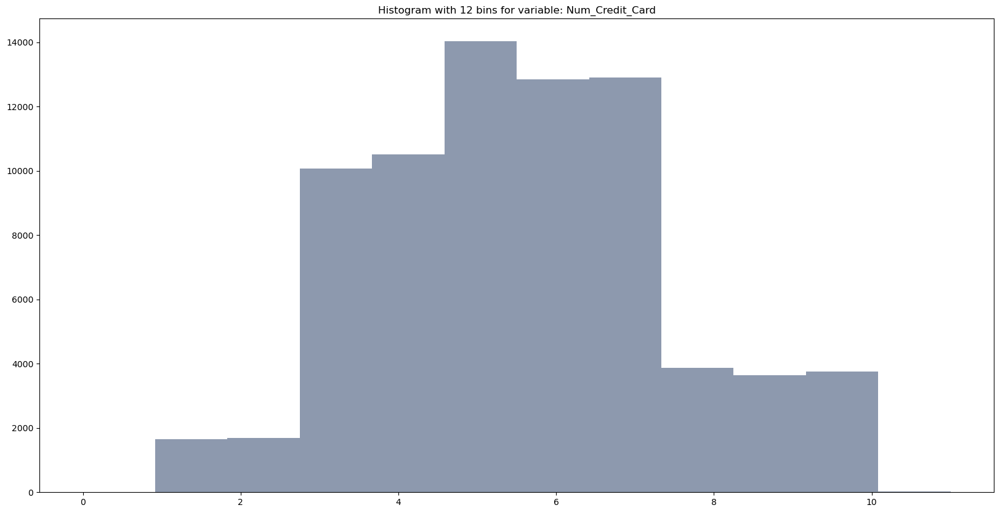

In [722]:
replaceAbove_mode(df, 'Num_Credit_Card', 11, comment=True)
plot_dist_var(df, 'Num_Credit_Card', 12)

As we can see, the problem is solved and we now have a much more acceptable range of [0, 11] credit cards.

<a id = "check-interest"></a>

##### 2.4.6. Interest Rate

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

Once again, we will assume that the interest rate on the loans did not change massively from one month to the other (no more than 25%, as it seems a reasonably estimated number that allows for some flexibility in changes, but will capture the more extreme values), as fluctuations in IRs are few and far betweeen, and are generally negotiated at the start of a loan. We will be applying the mode of the Interest Rate that every individual acquired, correcting outliers.

0.01991 % of values changed.


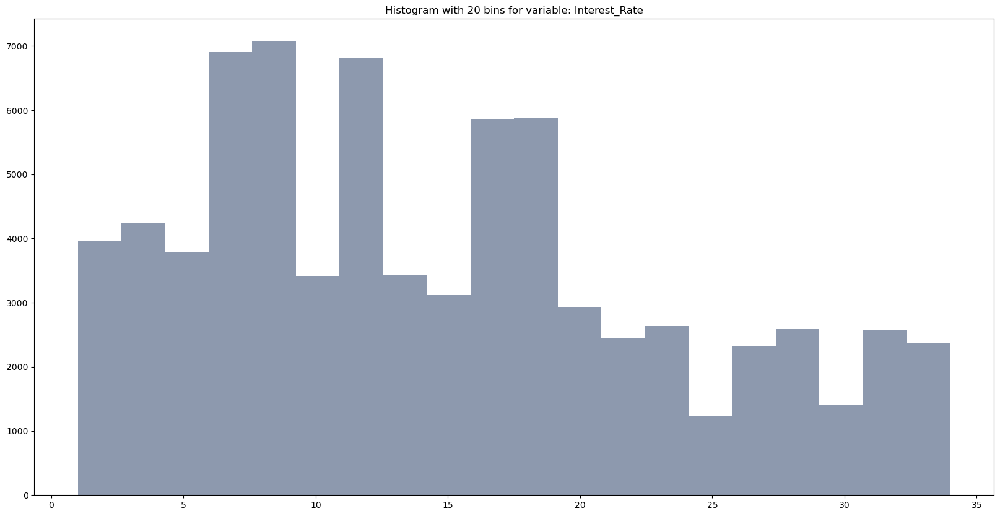

In [723]:
replaceTreshold_median(df, 'Interest_Rate', 0.25, comment=True)
plot_dist_var(df, 'Interest_Rate')

As we can see, the problem is solved and we now have a much more acceptable range of [1, 35] in the Interest Rate, with individuals presenting the same IR.

<a id = "check-nloans"></a>

##### 2.4.7. Number of Loans

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [724]:
df['Num_of_Loan'].value_counts()

3.0       11364
4.0       11116
2.0       11086
0.0        8107
1.0        7947
          ...  
405.0         1
1030.0        1
1257.0        1
172.0         1
349.0         1
Name: Num_of_Loan, Length: 317, dtype: int64

Once again we have a modicum of outlier values that make no sense in a realistic perspective, as up from a certain point and amount of loans no bank or institution would be willing to lend further money to an individual. We will use the same procedures used in the previous variables.

0.00467 % of values changed.


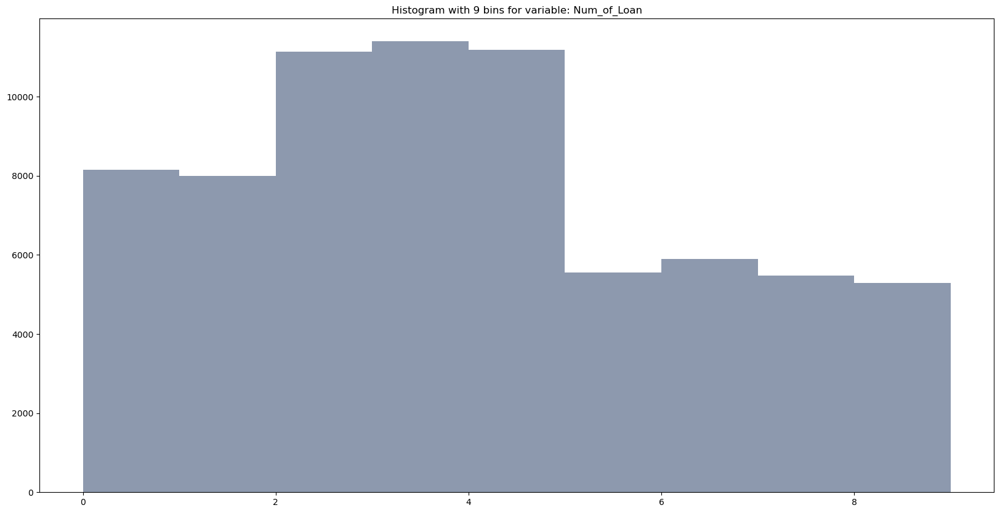

In [725]:
replaceTreshold_median(df, 'Num_of_Loan', 0.25, integer=True, comment=True)
plot_dist_var(df, 'Num_of_Loan', 9)

The issue is corrected. No more outliers.

<a id = "check-delay"></a>

##### 2.4.8. Delay from Due Date

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [726]:
df['Delay_from_due_date'].value_counts()

15.0    2805
13.0    2572
8.0     2482
10.0    2468
7.0     2460
        ... 
64.0      54
63.0      54
65.0      42
66.0      26
67.0      16
Name: Delay_from_due_date, Length: 68, dtype: int64

There appears to be no issue with this variable. While a delay of 60 + months is a lot, only a small percentage of the dataset appears to be in such a situation, which is realistic.

<a id = "check-ndelayed"></a>

##### 2.4.9. Number of Delayed Payments

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [727]:
df['Num_of_Delayed_Payment'].value_counts()

19.0      4152
17.0      4118
16.0      4008
15.0      3937
10.0      3925
          ... 
49.0         1
1673.0       1
4024.0       1
742.0        1
2047.0       1
Name: Num_of_Delayed_Payment, Length: 560, dtype: int64

As we can see, we are facing the same issue of the previous variables yet again. The following code will aim to correct it. In this case, we are replacing if values are 25% (as it seems a reasonably estimated number that allows for some flexibility in changes, but will capture the more extreme values) above customer median.

0.06861 % of values changed.


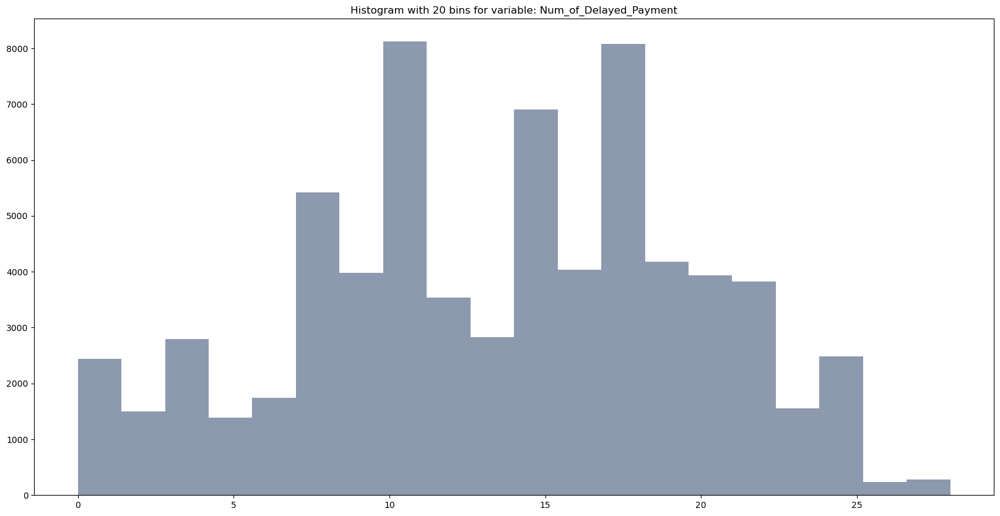

In [728]:
replaceTreshold_median(df, 'Num_of_Delayed_Payment', 0.25, integer=True, comment=True)
plot_dist_var(df, 'Num_of_Delayed_Payment')

Problem seems to be solved.

<a id = "check-cred-lim"></a>

##### 2.4.10. Changed Credit Limit

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [729]:
df['Changed_Credit_Limit'].describe()

count    72268.000000
mean        10.658283
std          6.652324
min          0.000000
25%          5.640000
50%          9.580000
75%         15.150000
max         36.970000
Name: Changed_Credit_Limit, dtype: float64

Variable shows some rather unprobable values, such as 30 to 37. These, however, are not impossible values (range of thousands or millions, even hundreds perhaps) to occur such as a few other cases we corrected. As such, we elected not to change this variable, as these numbers may be key to classifying a few individual's credit score.

<a id = "check-ninquire"></a>

##### 2.4.11. Number of Credit Inquiries

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [730]:
df['Num_Credit_Inquiries'].value_counts()

4.0       8340
3.0       6654
6.0       6075
2.0       6073
8.0       6040
          ... 
1562.0       1
562.0        1
364.0        1
1428.0       1
74.0         1
Name: Num_Credit_Inquiries, Length: 1001, dtype: int64

With clear problematic values, we will proceed to fix the issue, by replacing what we consider to be outliers with the customers median.

0.14327 % of values changed.


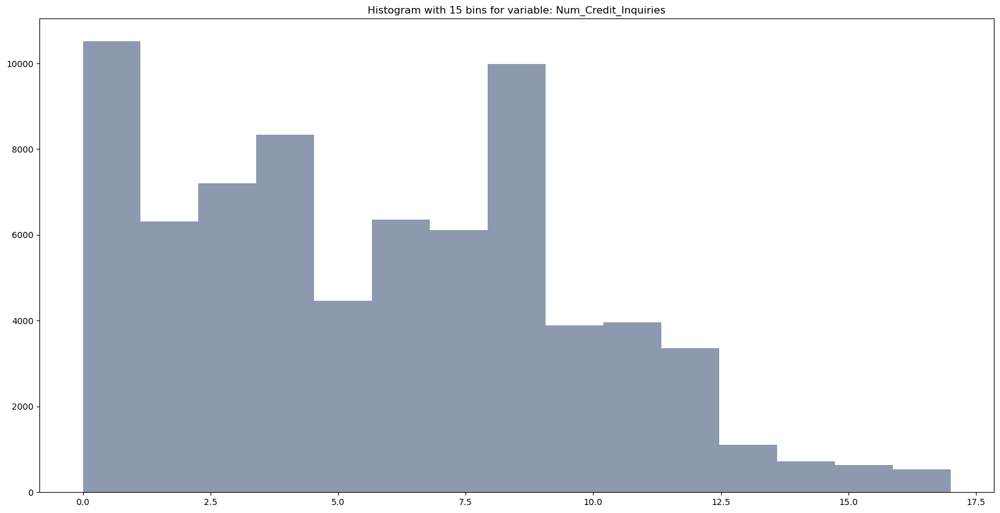

In [731]:
replaceTreshold_median(df, 'Num_Credit_Inquiries', 0.25, integer=True, comment=True)
plot_dist_var(df, 'Num_Credit_Inquiries', 15)

As one can see, the issue is fixed and we have a maximum close to 17.

<a id = "check-out-debt"></a>

##### 2.4.12. Outstanding Debt

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

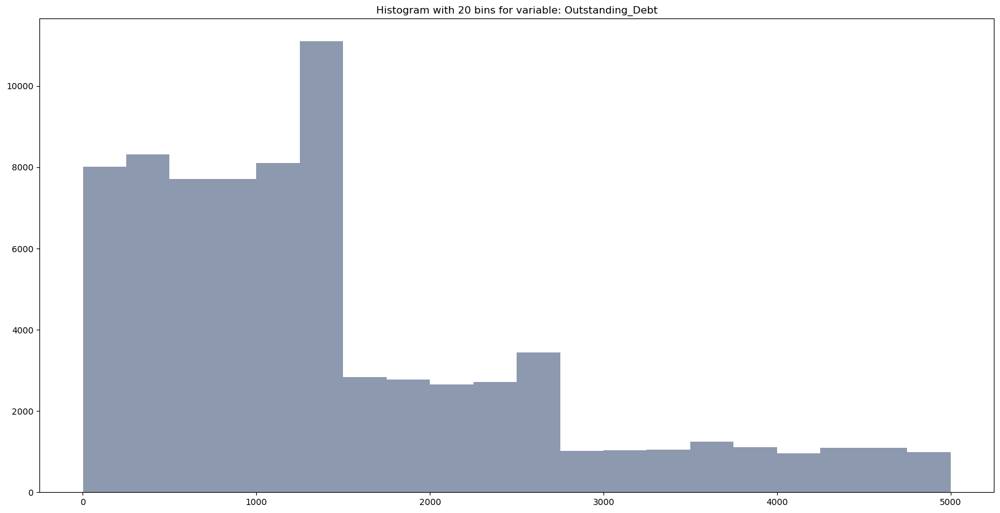

In [732]:
plot_dist_var(df, 'Outstanding_Debt')

In [733]:
df['Outstanding_Debt'].value_counts()

1109.03    24
1151.70    24
557.78     16
967.75     16
935.74     16
           ..
956.27      8
4060.01     8
583.40      8
166.49      8
502.38      8
Name: Outstanding_Debt, Length: 9202, dtype: int64

After looking at both the value counts and the min/max of the Outstanding Debts column, there does not seem to be any egregious or outlier values. Also, every value is grouped in groups of 8 or more, indicating that there are no sudden drastic changes between months per individual. (As we have 8 observations for each individual, we can assume that these values remain static per individual, needing no change)

<a id = "check-cred-use"></a>

##### 2.4.13. Credit Utilization Ratio

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [734]:
df['Credit_Utilization_Ratio'].value_counts()

28.616735    1
34.169639    1
33.251000    1
40.372063    1
35.049844    1
            ..
43.891529    1
33.756792    1
35.095749    1
35.868626    1
34.192463    1
Name: Credit_Utilization_Ratio, Length: 75000, dtype: int64

With what appears to be 100000 unique values and the definition of Credit Utilization Ratio ("Credit utilization ratio is the amount of credit you are currently using divided by the total amount of credit available to you. It is often expressed as a percentage."), there appears to be no changes necessary to this variable's values, as an individual may or may not use the same amount of their credit from month-to-month, with changes being natural due to different monthly costs etc. (Also, the values are within and acceptable range of [20, 50])

<a id = "check-emi"></a>

##### 2.4.14. Total EMI per Month

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [735]:
df['Total_EMI_per_month'].describe()

count    75000.000000
mean      1411.370336
std       8350.978580
min          0.000000
25%         30.759834
50%         69.612071
75%        160.901574
max      82331.000000
Name: Total_EMI_per_month, dtype: float64

We can notice in this variable the appearennce of rather strange outliers. We considered any value of above 1600 (10x above the third quartile) as a strange one, in order to allow for certain deviations but still catch extreme cases, as such loans for these values would be for egregious amounts, and way out of the curve from every other individuals we have seen.

In [736]:
filtered_data = df[df['Total_EMI_per_month'] <= 1600]

In [737]:
filtered_data['Total_EMI_per_month'].value_counts()

0.000000       7851
246.992319        8
100.298695        8
103.302665        8
17.288404         8
               ... 
426.880813        1
56.740739         1
1300.000000       1
62.280144         1
1439.000000       1
Name: Total_EMI_per_month, Length: 8899, dtype: int64

In [738]:
filtered_data = df[df['Total_EMI_per_month'] > 1600]

In [739]:
filtered_data['Total_EMI_per_month'].value_counts()

1645.529388     7
1701.955013     7
1642.825388     6
1634.213281     6
1614.855968     5
               ..
12039.000000    1
13214.000000    1
17118.000000    1
54057.000000    1
58638.000000    1
Name: Total_EMI_per_month, Length: 2306, dtype: int64

0.03175 % of values changed.


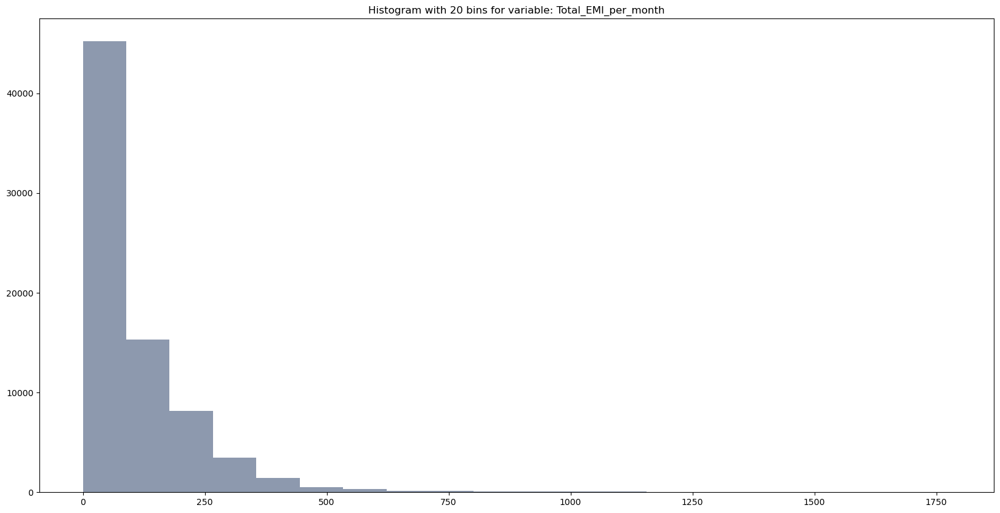

In [740]:
replaceAbove_mode(df, 'Total_EMI_per_month', 1600, comment=True)
plot_dist_var(df, 'Total_EMI_per_month')

While this measure has helped eliminate some outlier values we can still that the distribution is very skewed. Also, it has not solved the 0 value "issue". As the Total EMI per month is a payment made by a borrower to a lender at a specific date, we can assume by looking at the 'Number of Loans' variable that the individuals who have no loans will not have to pay and EMI monthly. 

In [741]:
df['Num_of_Loan'].value_counts()

3.0    11404
4.0    11185
2.0    11143
0.0     8151
1.0     7998
6.0     5902
5.0     5558
7.0     5477
9.0     2843
8.0     2453
Name: Num_of_Loan, dtype: int64

In [742]:
(df['Total_EMI_per_month'] == 0).sum()

8133

In [743]:
len(df[(df.Num_of_Loan == 0.0) & (df.Total_EMI_per_month == 0.0)])

7857

As we can observe, we have 8151 individuals that have no loans and 8133 individuals who pay no EMI after the iterations over the EMI variable. There are 7857 observations where these values match (and thereore about 300 where they don't). As we don't want to lose information, and these values are not outliers, we will keep them, as they represent a very small part of the data.

<a id = "check-amnt-inv"></a>

##### 2.4.15. Amount Invested Monthly

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

Amount Invested Monthly presents a strange quantity of 10000 values, which seem to be a mistake. As such, we have decided to replace by the mode values above 4000 (considered by the group a reasonable treshold for an outlier on amounts invested, as it is possible for individuals that have loans to be investing in the thousands, though unlikely). Keep in mind that in case the values are common in costumers, they will not be changed (will only be changed if they aren't the customers mode).

In [744]:
df['Amount_invested_monthly'].value_counts()

10000.000000    3233
0.000000         125
168.413703         1
159.944760         1
122.478695         1
                ... 
401.359009         1
416.773006         1
48.401380          1
188.050523         1
167.163865         1
Name: Amount_invested_monthly, Length: 68286, dtype: int64

0.04311 % of values changed.


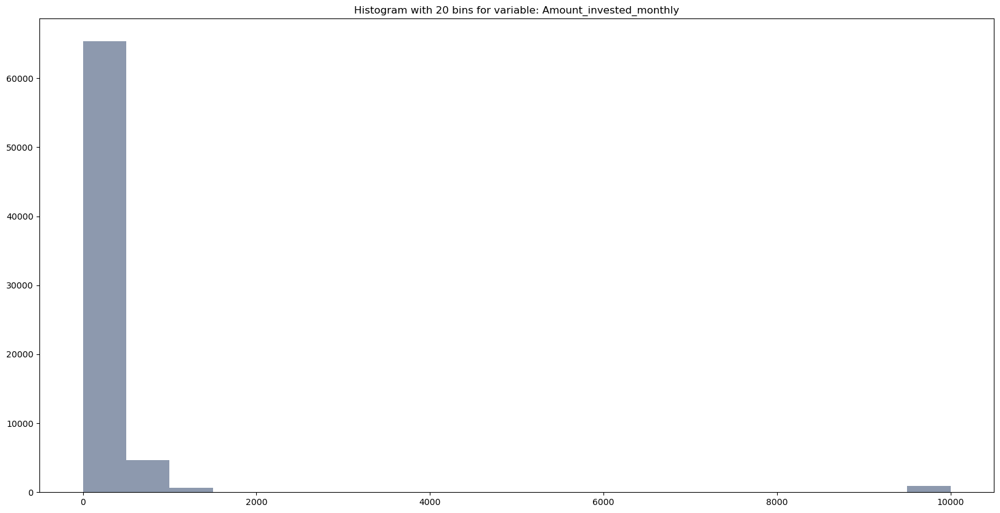

In [745]:
# Transformation of Amount Invested Monthly
replaceAbove_mode(df, 'Amount_invested_monthly', 4000, comment=True)
plot_dist_var(df, 'Amount_invested_monthly')

In regards to this variable, there is a strange amount of 10,000's represented (even after treatment), we will keep it for further observation, but it seems as if it can't be properly treated.

<a id = "check-month-bal"></a>

##### 2.4.16. Monthly Balance

[Back to Data Preparation](#data-preparation)

[Back to Preparation Numerical Variables](#check-numvar)

In [746]:
df['Monthly_Balance'].describe().apply(lambda x: '%.3f' % x)

count                           72906.000
mean         -36576779231704748392448.000
std         3491574014634780245622784.000
min      -333333333333333314856026112.000
25%                               270.026
50%                               336.458
75%                               469.026
max                              1602.041
Name: Monthly_Balance, dtype: object

As one can see, there are completely unrealistic deeply negative values, and we decided to replace those by customer's mode all below the -max of the variable.

0.00011 % of values changed.


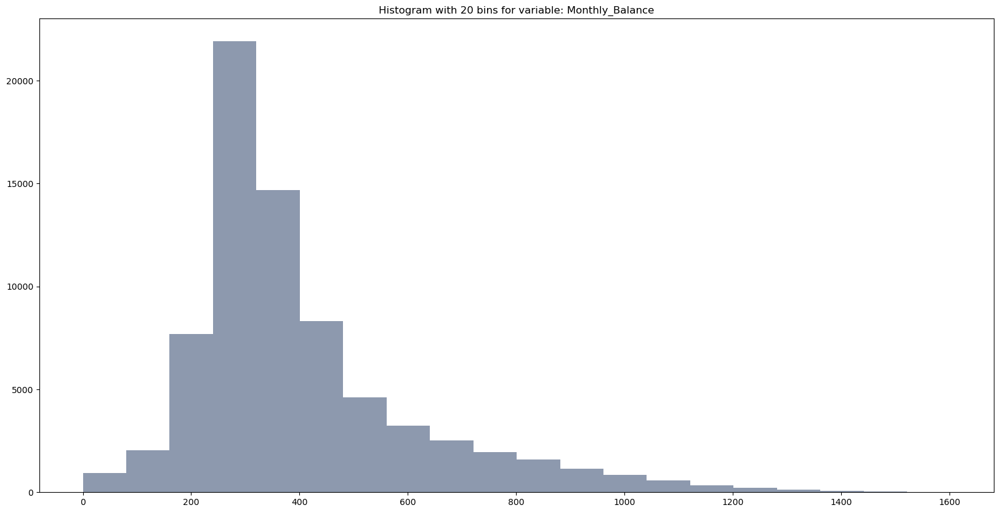

In [747]:
replaceBelow_median(df, 'Monthly_Balance', -1700, comment=True)
plot_dist_var(df, 'Monthly_Balance')

In [748]:
df['Monthly_Balance'].describe()

count    72906.000000
mean       401.983965
std        213.583447
min          0.007760
25%        270.041002
50%        336.471756
75%        469.031109
max       1602.040519
Name: Monthly_Balance, dtype: float64

In [749]:
# Number of customers with completely missing data on this variable
check_VariableClientNA(df, 'Monthly_Balance')

152


We find that by removing clear outliers, we have no costumers with negative monthly balances. Also, we find costumers for which we have no information at all, these missing values will be dealt with later on.

##### 2.4. Re-Observe Numerical Variables after treatment


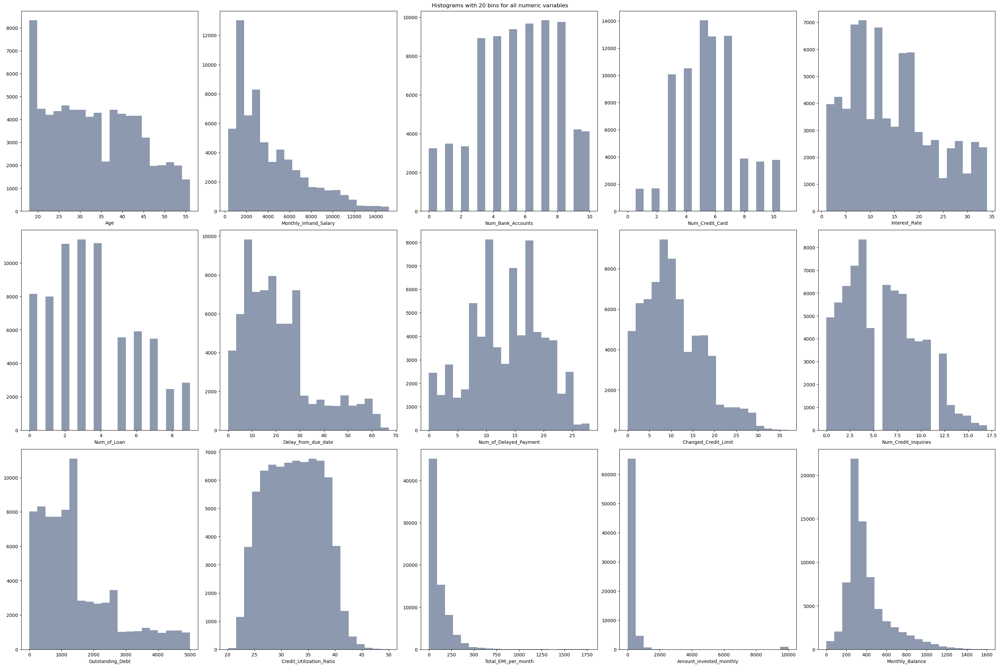

In [750]:
numerical=df.select_dtypes(include=['float64','int64']).columns
plot_histogram(df, numerical, 3)

Variables look better distributed and have much more realistic, concrete distribution of values.

In [751]:
# Constructs function that does all the changes done so far in numerical variables treatment
# Function will be necessary to parse on to the pipeline later on

def fix_customer_outlier_numeric(df):

    ## Age

    # replace All mode
    groups = df.groupby('Customer_ID')['Age'].apply(lambda x: x.mode()[0])
    mask = (df['Age'] != df['Customer_ID'].map(groups)) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Age'] = df.loc[mask, 'Customer_ID'].map(groups)
    
    # replace below spec
    df['Age'].mask(df['Age'] < 18, 18, inplace=True)

    ## Annual Income
    
    # drop
    df = df.drop('Annual_Income', axis=1)

    ## Num Bank Accounts

    # replace Above mode
    groups = df.groupby('Customer_ID')['Num_Bank_Accounts'].apply(lambda x: x.mode()[0])
    condition = (df['Num_Bank_Accounts'] > 10)
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Num_Bank_Accounts'] = df.loc[mask, 'Customer_ID'].map(groups)   

    ## Num Credit Card
    
    # replace Above mode
    groups = df.groupby('Customer_ID')['Num_Credit_Card'].apply(lambda x: x.mode()[0])
    condition = (df['Num_Credit_Card'] > 11)
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Num_Credit_Card'] = df.loc[mask, 'Customer_ID'].map(groups) 

    ## Interest Rate

    # replace Threshold median
    groups = df.groupby('Customer_ID')['Interest_Rate'].apply(lambda x: x.median())
    condition = (df['Interest_Rate'] > (1+0.25)*df['Customer_ID'].map(groups)) | (df['Interest_Rate'] < (1-0.25)*df['Customer_ID'].map(groups))
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Interest_Rate'] = df.loc[mask, 'Customer_ID'].map(groups)

    ## Num of Loan

    # replace Threshold median
    groups = df.groupby('Customer_ID')['Num_of_Loan'].apply(lambda x: int(x.median()))
    condition = (df['Num_of_Loan'] > (1+0.25)*df['Customer_ID'].map(groups)) | (df['Num_of_Loan'] < (1-0.25)*df['Customer_ID'].map(groups))
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Num_of_Loan'] = df.loc[mask, 'Customer_ID'].map(groups)

    ## Num of Delayed Payment

    # replace Threshold median
    groups = df.groupby('Customer_ID')['Num_of_Delayed_Payment'].apply(lambda x: int(x.median()))
    condition = (df['Num_of_Delayed_Payment'] > (1+0.25)*df['Customer_ID'].map(groups)) | (df['Num_of_Delayed_Payment'] < (1-0.25)*df['Customer_ID'].map(groups))
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Num_of_Delayed_Payment'] = df.loc[mask, 'Customer_ID'].map(groups)

    ## Num Credit Inquiries

    # replace Threshold median
    groups = df.groupby('Customer_ID')['Num_Credit_Inquiries'].apply(lambda x: int(x.median()))
    condition = (df['Num_Credit_Inquiries'] > (1+0.25)*df['Customer_ID'].map(groups)) | (df['Num_Credit_Inquiries'] < (1-0.25)*df['Customer_ID'].map(groups))
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Num_Credit_Inquiries'] = df.loc[mask, 'Customer_ID'].map(groups)

    ## Total EMI per month

    # replace Above mode
    groups = df.groupby('Customer_ID')['Total_EMI_per_month'].apply(lambda x: x.mode()[0])
    condition = (df['Total_EMI_per_month'] > 1600)
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Total_EMI_per_month'] = df.loc[mask, 'Customer_ID'].map(groups)

    ## Amount invested monthly

    # replace Above mode
    groups = df.groupby('Customer_ID')['Amount_invested_monthly'].apply(lambda x: x.mode()[0])
    condition = (df['Amount_invested_monthly'] > 4000)
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Amount_invested_monthly'] = df.loc[mask, 'Customer_ID'].map(groups)

    ## Monthly Balance

    # replace Below median
    groups = df.groupby('Customer_ID')['Monthly_Balance'].apply(lambda x: x.median())
    condition = (df['Monthly_Balance'] < -1700)
    mask = (condition) & (df['Customer_ID'].isin(groups.index))
    df.loc[mask, 'Monthly_Balance'] = df.loc[mask, 'Customer_ID'].map(groups)


    return df   


fix_CustOutlier_Num = Pipeline(steps=[
    ('fix_CustOutlier_numeric', FunctionTransformer(fix_customer_outlier_numeric))])

<a id = "check-catvar"></a>

### 2.5. Preparation Categorical Variables

1. [Customer ID](#check-cust-id)
2. [Month](#check-month)
3. [Occupation](#check-occup)
4. [Type of Loan](#check-loan-type)
5. [Credit Mix](#check-cred-mix)
6. [Payment of Minimum Amount](#check-pay-min)
7. [Payment Behaviour](#check-pay-behave)
8. [Number of Delayed Payments](#check-ndelayed)
9. [Changed Credit Limit](#check-cred-lim)
10. [Number of Credit Inquiries](#check-ninquire)
11. [Outstanding Debt](#check-out-debt)
12. [Credit Utilization Ratio](#check-cred-use)
13. [Total EMI per Month](#check-emi)
14. [Amount Invested Monthly](#check-amnt-inv)
15. [Monthly Balance](#check-month-bal)

[Back to Data Preparation](#data-preparation)

[Advance to Visualizations](#visualizations)

<a id = "check-cust-id"></a>

##### 2.5.1. Customer ID

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [752]:
df['Customer_ID'].value_counts(ascending=True)

CUS_0x2dbc    8
CUS_0xb122    8
CUS_0x26e0    8
CUS_0x3499    8
CUS_0x45b     8
             ..
CUS_0x5a2     8
CUS_0x35c8    8
CUS_0x87d0    8
CUS_0x1bef    8
CUS_0x942c    8
Name: Customer_ID, Length: 9375, dtype: int64

As we can see, every individual has a different ID and each of them appear 8 times throughout the dataset, as there is data present for every individual in an 8 month period. There are no discrepancies present in this variable.

<a id = "check-month"></a>

##### 2.5.2. Month

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [753]:
df['Month'].value_counts(ascending=True)

January     9375
February    9375
March       9375
April       9375
May         9375
June        9375
July        9375
August      9375
Name: Month, dtype: int64

Regarding the Month column, we can see that are no present discrepancies, as each of the 8 months appear the same ammount of times and in order.

<a id = "check-occup"></a>

##### 2.5.3. Occupation

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [754]:
df['Occupation'].value_counts()

Lawyer          5058
Architect       4813
Entrepreneur    4781
Accountant      4714
Mechanic        4708
Engineer        4672
Teacher         4649
Scientist       4616
MediaManager    4605
Journalist      4589
Developer       4582
Doctor          4553
Manager         4510
Writer          4473
Musician        4359
Name: Occupation, dtype: int64

No discrepancies in this variable as well.

<a id = "check-loan-type"></a>

##### 2.5.4. Type of Loan

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [755]:
df['Type_of_Loan'].value_counts()

Not Specified                                                                                                                    1048
Credit-Builder Loan                                                                                                               984
Personal Loan                                                                                                                     984
Payday Loan                                                                                                                       928
Student Loan                                                                                                                      912
                                                                                                                                 ... 
Credit-Builder Loan, Auto Loan, Mortgage Loan, Not Specified, Student Loan, and Student Loan                                        8
Not Specified, Auto Loan, Auto Loan, and Debt Consolidation Lo

After having understood that there were different types of loans that, a function was created to understand what were the unique values for this feature.

In [756]:
def diff_values(df_column):   
    diff_value_list = []
    column = df_column.dropna()
    for i in column:
        if ',' not in i and i not in diff_value_list:
            diff_value_list.append(i)
        else:
            for point in map(lambda x:x.strip(), i.replace('and','').split(',')):
                if not point in diff_value_list:
                    diff_value_list.append(point)
    return dict(enumerate(sorted(diff_value_list)))


In [757]:
loan_keys = diff_values(df['Type_of_Loan'])
loan_keys

{0: 'Auto Loan',
 1: 'Credit-Builder Loan',
 2: 'Debt Consolidation Loan',
 3: 'Home Equity Loan',
 4: 'Mortgage Loan',
 5: 'Not Specified',
 6: 'Payday Loan',
 7: 'Personal Loan',
 8: 'Student Loan'}

There were 8 unique types of loans. In this feature there were almost 10000 NaNs, therefore these NaNs were substituted by No Information Available, in order to not to have a bias estimation of the influence of this variable in the final result of the model

In [758]:
df['Type_of_Loan'] = df['Type_of_Loan'].replace([np.NaN], 'No Data Available')

As this column is quite unuseful and would not be able to be efficiently fitted in to a model, we will create new dummy columns that will be 1, if customer has that type of loan, and 0 if customer doesn't. This allows us to more easily discern the effect each type of loan has on an individual's credit score, and more easily interpret this rather messy variable.

In [759]:
for value in range(0,len(loan_keys)):
    new_col = loan_keys[value]
    df[new_col] = df['Type_of_Loan'].apply(lambda x: 1 if new_col in x else 0)
# df.head(10)

In [760]:
# drop type of loan, since dummies now represent it
df.drop(['Type_of_Loan'], axis=1, inplace=True)

In [761]:
df.head(5).T

,16,17,18,19,20
Customer_ID,CUS_0x2dbc,CUS_0x2dbc,CUS_0x2dbc,CUS_0x2dbc,CUS_0x2dbc
Month,January,February,March,April,May
Age,34.0,34.0,34.0,34.0,34.0
Occupation,NaN,Engineer,NaN,Engineer,NaN
Monthly_Inhand_Salary,12187.22,12187.22,NaN,12187.22,12187.22
Num_Bank_Accounts,1.0,1.0,1.0,1.0,1.0
Num_Credit_Card,5,5,5,5,5
Interest_Rate,8,8,8,8,8
Num_of_Loan,3.0,3.0,3.0,3.0,3.0
Delay_from_due_date,5.0,13.0,8.0,8.0,10.0


<a id = "check-cred-mix"></a>

##### 2.5.5. Credit Mix

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [762]:
df['Credit_Mix'].value_counts()

Standard    27279
Good        18108
Bad         14409
Name: Credit_Mix, dtype: int64

As one can see, there are a lot of customers without a Credit Mix associated. Missing values will be dealt with later on.

<a id = "check-pay-min"></a>

##### 2.5.6. Payment of Minimum Amount

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [763]:
df['Payment_of_Min_Amount'].value_counts()

Yes    39390
No     26576
NM      9034
Name: Payment_of_Min_Amount, dtype: int64

As one can see, there are a lot of customers without information on whether the minimum amount payment was the only payment they made. Missing values will, again, be dealt with later on.

<a id = "check-pay-behave"></a>

##### 2.5.8. Payment Behaviour

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [764]:
df['Payment_Behaviour'].value_counts()

Low_spent_Small_value_payments      19039
High_spent_Medium_value_payments    13165
Low_spent_Medium_value_payments     10376
High_spent_Large_value_payments     10318
High_spent_Small_value_payments      8557
Low_spent_Large_value_payments       7839
!@9#%8                               5706
Name: Payment_Behaviour, dtype: int64

There are a lot of customers without the payment behaviour requirement. Therefore, a substitution by NA was done to account for this issue. Later on NA values will be imputed.

In [765]:
remove_aimed(df, 'Payment_Behaviour', '!@9#%8')
df['Payment_Behaviour'].value_counts()

Low_spent_Small_value_payments      19039
High_spent_Medium_value_payments    13165
Low_spent_Medium_value_payments     10376
High_spent_Large_value_payments     10318
High_spent_Small_value_payments      8557
Low_spent_Large_value_payments       7839
Name: Payment_Behaviour, dtype: int64

##### Check Final Variables

[Back to Data Preparation](#data-preparation)

[Back to Preparation Categorical Variables](#check-catvar)

In [766]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,75000.0,33.384747,10.551325,18.000000,24.000000,33.000000,42.000000,56.000000
Monthly_Inhand_Salary,63719.0,4190.480017,3174.239125,303.645417,1632.487917,3091.260833,5955.193333,15204.633333
Num_Bank_Accounts,74986.0,5.386445,2.601648,0.000000,3.000000,6.000000,7.000000,10.000000
Num_Credit_Card,75000.0,5.551973,2.072299,0.000000,4.000000,5.000000,7.000000,11.000000
Interest_Rate,75000.0,14.632640,8.819231,1.000000,7.000000,13.000000,20.000000,34.000000
Num_of_Loan,72114.0,3.549768,2.449093,0.000000,2.000000,3.000000,5.000000,9.000000
Delay_from_due_date,74554.0,21.184913,14.774687,0.000000,10.000000,18.000000,28.000000,67.000000
Num_of_Delayed_Payment,69263.0,13.428974,6.215733,0.000000,9.000000,14.000000,18.000000,28.000000
Changed_Credit_Limit,72268.0,10.658283,6.652324,0.000000,5.640000,9.580000,15.150000,36.970000
Num_Credit_Inquiries,73507.0,5.794264,3.825951,0.000000,3.000000,5.000000,8.000000,17.000000


In [767]:
df.describe(include = ['O']).T

,count,unique,top,freq
Customer_ID,75000,9375,CUS_0x2dbc,8
Month,75000,8,January,9375
Occupation,69682,15,Lawyer,5058
Credit_Mix,59796,3,Standard,27279
Payment_of_Min_Amount,75000,3,Yes,39390
Payment_Behaviour,69294,6,Low_spent_Small_value_payments,19039


By checking the % of missing values in each column we can see that there is no reason to drop any. NA imputation will be done in later stages.

In [768]:
na_series = (df.isnull().sum() / df.isnull().count())*100 
print('% of missing values: \n\n', na_series.map('{:,.2f} %'.format).to_string(), '\n')

% of missing values: 

 Customer_ID                  0.00 %
Month                        0.00 %
Age                          0.00 %
Occupation                   7.09 %
Monthly_Inhand_Salary       15.04 %
Num_Bank_Accounts            0.02 %
Num_Credit_Card              0.00 %
Interest_Rate                0.00 %
Num_of_Loan                  3.85 %
Delay_from_due_date          0.59 %
Num_of_Delayed_Payment       7.65 %
Changed_Credit_Limit         3.64 %
Num_Credit_Inquiries         1.99 %
Credit_Mix                  20.27 %
Outstanding_Debt             0.00 %
Credit_Utilization_Ratio     0.00 %
Payment_of_Min_Amount        0.00 %
Total_EMI_per_month          0.00 %
Amount_invested_monthly      4.48 %
Payment_Behaviour            7.61 %
Monthly_Balance              2.79 %
Auto Loan                    0.00 %
Credit-Builder Loan          0.00 %
Debt Consolidation Loan      0.00 %
Home Equity Loan             0.00 %
Mortgage Loan                0.00 %
Not Specified                0.00 %
Payd

In [769]:
# Constructs function that does all the changes done so far in categorical variables treatment
# Function will be necessary to parse on to the pipeline later on

def fix_customer_categorical(df):

    ## Type of Loan

    # Create dummies on loan types
    for value in loan_keys.keys():
        new_col = str(loan_keys[value])
        df[new_col] = df['Type_of_Loan'].str.contains(new_col).astype(float)

    # Drop original
    df = df.drop(['Type_of_Loan'], axis=1)

    ## Payment Behaviour

    # Remove strange values
    df['Payment_Behaviour'] = df['Payment_Behaviour'].replace('!@9#%8', np.NaN)

    return df   


fix_CustCat = Pipeline(steps=[
    ('fix_CustCat', FunctionTransformer(fix_customer_categorical))])

<a id = "visualizations"></a>

### 3. Visualizations

- [3.1. Bar plots](#bar-plots)
- [3.2. Histograms](#histograms)
- [3.3. Box plots](#box-plots)
- [3.4. Numerical variables relationships](#numerical-relationships)

[Back to TOC](#toc)

In [770]:
# Parses target back on to the dataset so it can also be visualized
df['Credit_Score'] = train_y

numerics = ['int64', 'float64']

In [771]:
# defining metric and non-metric features (drop_metric are the variables that will not be included in the visualizations of categorical variables)

metric_features1 = list(df.select_dtypes(include=numerics).columns.values)
metric_features_nb = metric_features1[0:15]  # metric features without artificially created binary features
drop_metric = metric_features1 + ['Customer_ID']
non_metric_features1 = df.columns.drop(drop_metric).to_list()

<a id = "bar-plots"></a>

#### 3.1. Bar plots

In [772]:
# code adapted from https://stackoverflow.com/questions/31749448/how-to-add-percentages-on-top-of-grouped-bars

def plot_bar(data, nmf, lines, fig_size):
    """
    function that plots a count plot for each non-metric feature
    """
    
    # preparing the figure by create individual axes where each box plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(nmf) / lines), figsize = fig_size, constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associating each box plot:
    for ax, feat in zip(axes.flatten(), nmf):
        graph = sns.countplot(x = data[feat], color = '#8d99ae', ax = ax, order = data[feat].value_counts(ascending = True).index)
        ax.tick_params(axis = 'x', rotation = 80, size = 5)
        ax.set_ylabel('')
        '''
        for p in graph.patches:
            percentage = '{:.1f}%'.format(100 * p.get_height() / float(len(data)))
            x = p.get_x() + p.get_width() / 2 - 0.20
            y = p.get_y() + p.get_height()
            graph.annotate(percentage, (x, y), size = 10)
        '''
            
    fig.suptitle('Bar plots for all categorical variables', fontsize = 12)

    # showing the plot
    plt.show()

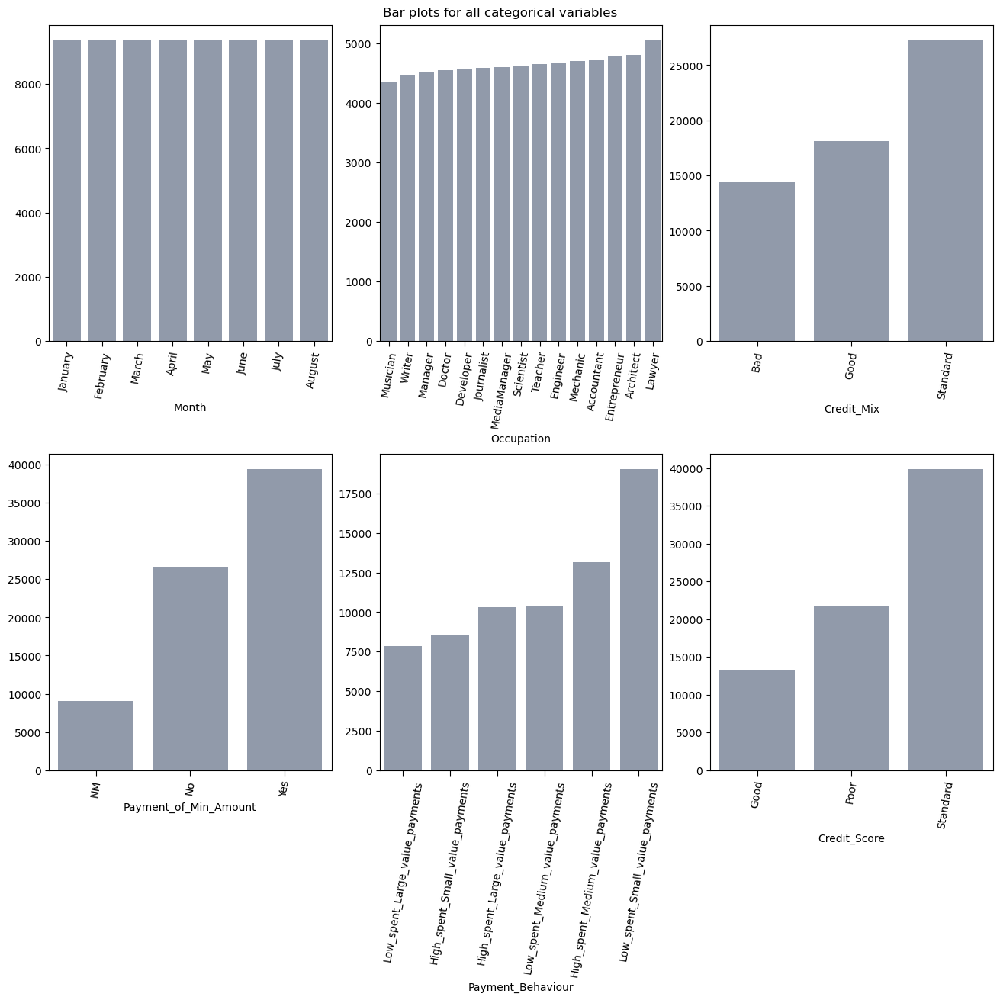

In [773]:
plot_bar(df, non_metric_features1, 2, (13, 13))

Main take aways from the categorical distributions:
- Months distributed evenly as seen before
- Occupation is balanced, with 'lawyer' being the most present in the dataset
- Credit Mix is unbalanced, with about half the observations being 'Standard'
- Payment of Min Amount is mostly Yes, as we would expect most costumers pay at least the entrance fee in order to successfuly acquire loans
- Most common Payment Behaviour is "Low spent small value payments', as it makes sense that individuals would rather pay small fees from time to time as to not disrupt their daily lives as much
- Credit Score presents mostly 'Standard' values, might be something to look out for, during Modelling

<a id = "histograms"></a>

#### 3.2. Histograms

Ploting all numeric variables' histograms in one figure, to see some insights.

In [774]:
def plot_histogram(data, mf, lines):
    """
    function that plots a histogram for each numerical feature
    input lines: is to determine the number of lines to configure the plot
    """
    # preparing the figure by creating individual axes where each histogram will be placed
    fig, axes = plt.subplots(lines, ceil(len(mf) / lines), figsize = (30, 20), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each histogram:
    for ax, feat in zip(axes.flatten(), mf):
        ax.hist(data[feat], bins = 20, color = '#8d99ae')
        ax.set_xlabel(feat, fontsize = 10)

    fig.suptitle('Histograms with 20 bins for all numeric variables', fontsize = 12)

    # showing the plot
    plt.show()

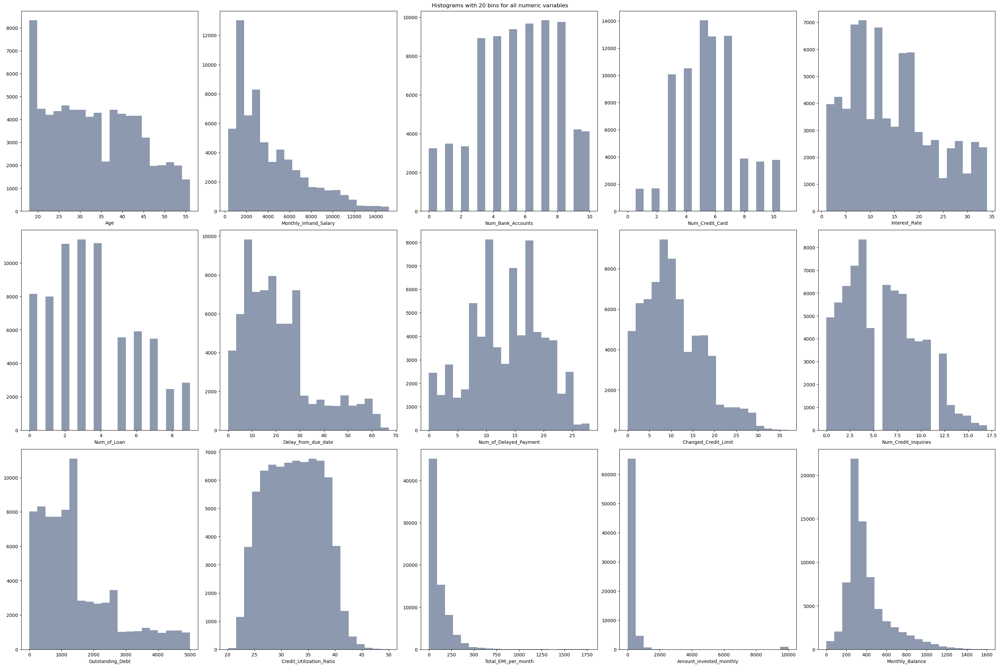

In [775]:
plot_histogram(df, metric_features_nb, 3)

Nothing stands out in the numerical variables, except for the rather weird concentration of 10.000 values in Amount Invested Monthly. All the rest looks as it was expected by the group.

<a id = "box-plots"></a>

#### 3.3. Box plots

Doing the same with box-plots for metric features.

In [776]:
def plot_box(data, mf, lines):
    """
    function that plots a box plot for each numerical feature
    input lines: is to determine the number of lines to configure the plot
    """
    
    # preparing the figure by creating individual axes where each box-plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(mf) / lines), figsize = (15, 8), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each box-plot:
    for ax, feat in zip(axes.flatten(), mf):
        sns.boxplot(x = data[feat], ax = ax, color = '#8d99ae', orient = 'h')
        
    fig.suptitle('Boxplots of all numeric variables', fontsize = 12)

    # showing the plot
    plt.show()

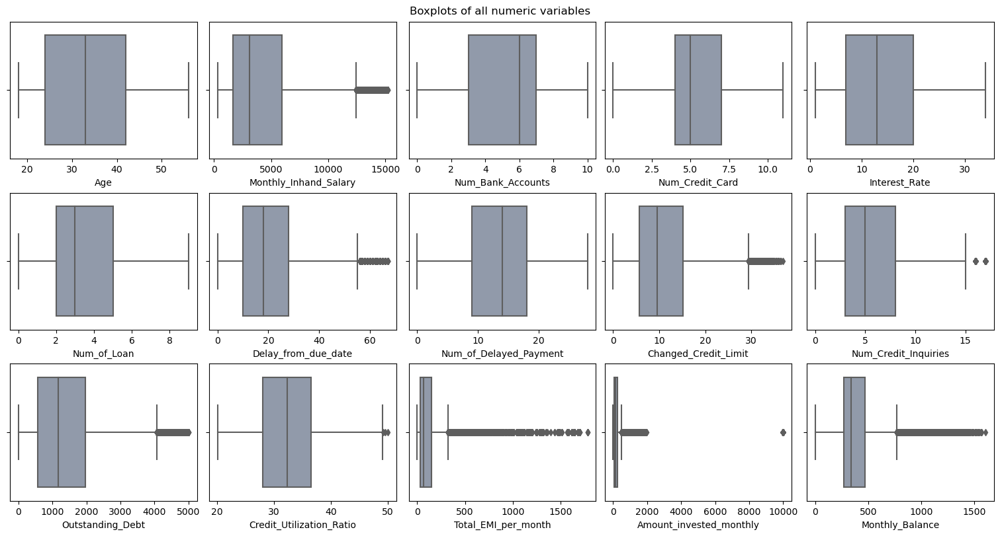

In [777]:
plot_box(df, metric_features_nb, 3)

To complement the information given by the histograms, these box-plots show few outliers, being mostly present in the last three variables, that are mostly related to investments or salary, variables that can have significant outliers with individuals having bigger salaries and such. We also can notice a big number of outliers in Total EMI per Month, but all within realistic values. Notice again the concentration of 10.000 values in Amount Invested Monthly.

<a id = "numerical-relationships"></a>

#### 3.4. Numerical variables relationships

For numerical variables, analysing the the relationship between all variables (to see some correlations, etc.).

In [778]:
def corr_matrix(data, correlation):
    """ 
    function to plot the correlation matrix in a heat map
    """
    
    # preparing the figure
    fig = plt.figure(figsize = (20, 16))

    # obtaining the correlation matrix, each correlation is rounded to 2 decimal cases
    corr = data.corr(correlation, numeric_only = True).round(2)

    # building annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape, ''))
    
    # generate a mask for the upper triangle
    mask_upper = np.triu(np.ones_like(corr, dtype = bool))

    # plotting heatmap of the correlation matrix
    sns.heatmap(data = corr, annot = annot, cmap = sns.diverging_palette(220, 10, as_cmap = True), fmt = 's', vmin = -1, 
                vmax = 1, center = 0, square = True, linewidths = .5, annot_kws = {'size': 10, 'color': 'black'}, mask = mask_upper)

    # layout
    fig.subplots_adjust(top = 0.95)
    fig.suptitle(correlation + ' correlation matrix')

    # showing the plot
    plt.show()

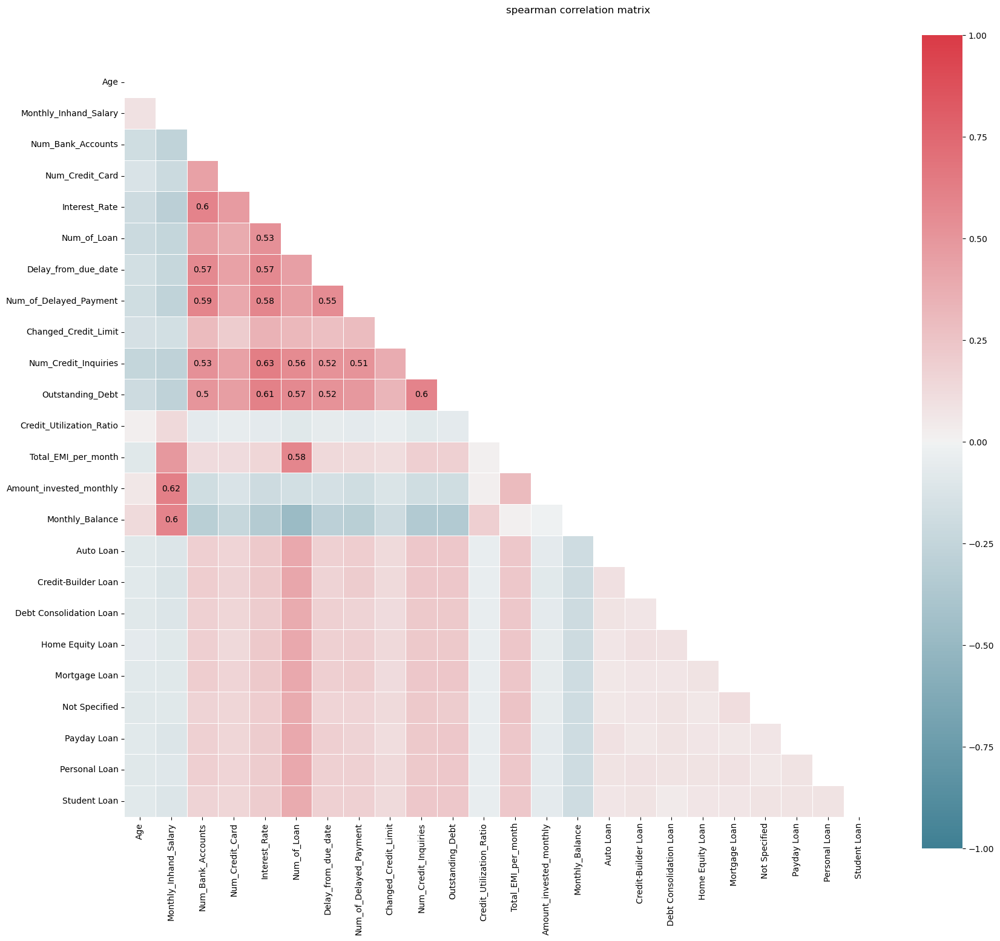

In [779]:
# plotting the correlation matrix

corr_matrix(df, 'spearman')

No meaningful relations can be seen between variables. Highest (0.63) is between Num of Credit Inquiries and Interest Rate, which doesn't make that much sense.

In [780]:
def plot_violin(data, mf, categorical_feature, lines, fig_size, palette):
    """ 
    function that plots the metric features against one non-metric feature to see the discriminatory power
    input:
    - lines: to determine the number of lines to configure the figure
    """
    
    # preparing the figure
    fig, axes = plt.subplots(lines, ceil(len(mf) / lines), figsize = fig_size, constrained_layout = True)

    # ploting the data
    for ax, f in zip(axes.flatten(), mf):
        sns.violinplot(y = categorical_feature, data = data, ax = ax, x = f, palette = palette, orient = 'h')  #['#8d99ae']
        ax.set_ylabel('') 

    # layout
    plt.suptitle('Numeric Variables - Violin Plots by ' + categorical_feature)
    plt.show()

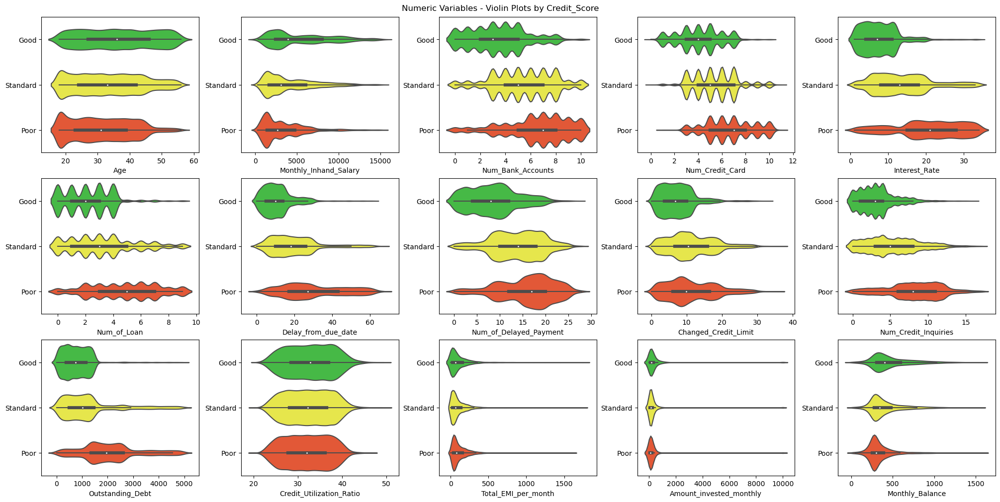

In [781]:
plot_violin(df, metric_features_nb, 'Credit_Score', 3, (20, 10), ['#33cc33', '#ffff33','#ff471a'])

It can be seen that the distributions of the numerical variables by `Credit Score` show some promise, as it is possible to make clear distinctions among more than one variable. Take for example `Num of Delayed Payment`, with a clear difference in distribution between classifications. Outstanding Debt can also be easily analysed, with clear difference as well. Other examples include Monthly Balance and Number of Credit Inquiries of example.

In [782]:
# drop target again for further variable treatment
df = df.drop('Credit_Score', axis=1)

<a id = "data-scaling"></a>
    
## 4. Data Scaling

<a id = "scaling-index"></a>

- [4.1. Missing Values](#missing-val)
- [4.2. Normalization](#normalization)
- [4.3. Encoding](#encoding)
- [4.4. Outliers](#outliers)
- [4.5. New Features](#new-feat)
- [4.6. Variable Selection](#var-sel)
- [4.7. Summary](#summary)



[Back to TOC](#toc)

<a id = "missing-values"></a>

### 4.1. Missing values

- [4.1.1. Fill in with values from similar individuals](#similar-individuals)
- [4.1.2. Fill in with mode](#mode-imputation)


<a id = "similar-individuals"></a>

#### 4.1.1. Fill in with values from similar individuals

A way to deal with missing values is to fill in with values from **similar individuals (nearest neighbours)**. To use this method, the data should be normalized (otherwise, the different scales of our data will lead the KNNImputer to generate biased replacements for the missing values). KNNImputer only works for metric features, as it computes distances, that do not make sense to compute for non metric features.

In [783]:
missing_values = df.isnull().sum()
print(missing_values)

Customer_ID                     0
Month                           0
Age                             0
Occupation                   5318
Monthly_Inhand_Salary       11281
Num_Bank_Accounts              14
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                  2886
Delay_from_due_date           446
Num_of_Delayed_Payment       5737
Changed_Credit_Limit         2732
Num_Credit_Inquiries         1493
Credit_Mix                  15204
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      3358
Payment_Behaviour            5706
Monthly_Balance              2094
Auto Loan                       0
Credit-Builder Loan             0
Debt Consolidation Loan         0
Home Equity Loan                0
Mortgage Loan                   0
Not Specified                   0
Payday Loan                     0
Personal Loan                   0
Student Loan  

In [784]:
# creating a new copy to explore the neighbordhood imputation

df_neighbors = df.copy()
nans_index = df_neighbors.isna().any(axis = 1)

In [785]:
def input_nan_knn(data, mf):
    """
    function to inpute the metric features' missing values with knn
    inputs:
    - data
    - mf: metric features
    """
    
    # defining an imputer of KNN and then use it to fill the missing values in our variables
    knn_imputer = KNNImputer(n_neighbors = 5, weights = 'uniform')
    data[mf] = knn_imputer.fit_transform(data[mf])
    
    return data

In [786]:
# filling the missing values with the defined function
df_neighbors = input_nan_knn(df_neighbors, metric_features1)

# seeing rows with NaNs imputed
#df_neighbors.loc[nans_index, metric_features]

In [787]:
# choosing the median inputation
df = df_neighbors.copy()

In [788]:
new_missing_values = df.isnull().sum()
print(new_missing_values)

Customer_ID                     0
Month                           0
Age                             0
Occupation                   5318
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Delay_from_due_date             0
Num_of_Delayed_Payment          0
Changed_Credit_Limit            0
Num_Credit_Inquiries            0
Credit_Mix                  15204
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour            5706
Monthly_Balance                 0
Auto Loan                       0
Credit-Builder Loan             0
Debt Consolidation Loan         0
Home Equity Loan                0
Mortgage Loan                   0
Not Specified                   0
Payday Loan                     0
Personal Loan                   0
Student Loan  

As one can see, the metric values have been properly imputed, with only categorical variables still presenting missing values. We will correct these in the next section.

<a id = "mode-imputation"></a>

#### 4.1.2. Fill in with mode

Fill in categorical variables according to the variable's mode, as we believe that these variables (Occupation, Credit Mix and Payment Behavior) will not suffer extreme changes in the period of 8 months. And, even if they did, the missing values will be imputed with a value that has appeared many times in the information set, providing then no significant drawbacks to the imputation process.

In [789]:
def input_mode(data, cf):
    """
    function to inpute the categorical features' missing values with mode
    inputs:
    - data
    - cf: categorical features
    """
    
    # defining a Simple Imputer and then use it to fill the missing values in our variables
    mode_imputer = SimpleImputer(strategy='most_frequent')
    data[cf] = mode_imputer.fit_transform(data[cf])
    
    return data

In [790]:
categorical_features1 = ['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour']

df = input_mode(df, categorical_features1)

In [791]:
new_missing_values = df.isnull().sum()
print(new_missing_values)

Customer_ID                 0
Month                       0
Age                         0
Occupation                  0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Auto Loan                   0
Credit-Builder Loan         0
Debt Consolidation Loan     0
Home Equity Loan            0
Mortgage Loan               0
Not Specified               0
Payday Loan                 0
Personal Loan               0
Student Loan                0
dtype: int64


With no more missing values, we are ready to proceed to the next step, normalizing the variables.

<a id = "normalization"></a>

### 4.2. Normalization

- [4.2.1. MinMax scaling](#min-max-scaling)
- [4.2.2. Standard scaling](#standard-scaling)


<a id = "min-max-scaling"></a>

#### 4.2.1. MinMax scaling

MinMax scaling is a type of data normalization technique used to transform the features (variables) of a dataset so that they have a common scale or range. The goal of this technique is to ensure that all the features have the same weight or importance during the analysis process.

In MinMax scaling, the data is scaled to a fixed range between 0 and 1 by subtracting the minimum value of the feature from each value and then dividing it by the range (maximum value - minimum value). This scaling method preserves the shape of the original dataset and does not distort the data distribution, as all values are scaled proportionally, and as such, is appropriate for us to use while scaling our data.

We are also testing out MinMax scaling because it is simple and easy to implement, and it works well for datasets that have a defined range of values such as this one. Additionally, this method does not reduce the importance of outliers (and we had a few interesting ones in variables such as total EMI per Month, amount invested monthly and monthly balance), and we wish to keep these values as-is in order to build the most accurate models we can.

In [792]:
# creating a copy to apply MinMaxScaler

df_minmax = df.copy()

In [793]:
# creating a function to apply MinMaxScaler

def minmax_scaler(data, mf):
    """
    function to perform min-max scaling on the metric features
    """
    data_scaled = data.copy()
    
    # defining an instance of MinMaxScaler
    scaler = MinMaxScaler()
    
    # scaling the data, making sure that all data will be in the range 0-1
    scaled_feat = scaler.fit_transform(data_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    data_scaled.loc[:, mf] = scaled_feat
    
    return data_scaled

In [794]:
metric_features2 = [i for i in metric_features1 if i not in ['Auto Loan', 'Credit-Builder Loan',
                                                            'Debt Consolidation Loan', 'Home Equity Loan',
                                                            'Mortgage Loan', 'Not Specified',
                                                            'Payday Loan', 'Personal Loan',
                                                            'Student Loan']]

In [795]:
# calling the function to scale the data and seeing the descriptive statistics

df_minmax = minmax_scaler(df_minmax, metric_features2)
df_minmax[metric_features2].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Age,75000.0,0.40,0.28,0.0,0.16,0.39,0.63,1.0
Monthly_Inhand_Salary,75000.0,0.26,0.21,0.0,0.09,0.19,0.37,1.0
Num_Bank_Accounts,75000.0,0.54,0.26,0.0,0.30,0.60,0.70,1.0
Num_Credit_Card,75000.0,0.50,0.19,0.0,0.36,0.45,0.64,1.0
Interest_Rate,75000.0,0.41,0.27,0.0,0.18,0.36,0.58,1.0
Num_of_Loan,75000.0,0.39,0.27,0.0,0.22,0.33,0.56,1.0
Delay_from_due_date,75000.0,0.32,0.22,0.0,0.15,0.27,0.42,1.0
Num_of_Delayed_Payment,75000.0,0.48,0.22,0.0,0.32,0.50,0.64,1.0
Changed_Credit_Limit,75000.0,0.29,0.18,0.0,0.15,0.26,0.41,1.0
Num_Credit_Inquiries,75000.0,0.34,0.22,0.0,0.18,0.29,0.47,1.0


All features have a minimum value of 0 and a maximum value of 1, as previously explained

<a id = "standard-scaling"></a>

#### 4.2.2. Standard scaling

Standard scaling, also known as z-score normalization, is technique used to transform the features (variables) of a dataset so that they have a mean of zero and a standard deviation of one. This technique scales the data such that the values are in terms of standard deviations from the mean.

Standard scaling is a powerful technique that can be applied to any distribution of data, but it is particularly useful when the data distribution is normal or almost normal. Normal distributions, also known as Gaussian distributions, are characterized by a symmetrical bell-shaped curve with most of the data points concentrated around the mean. (As we can see in most of our numerical variables, in which most of the values converge around the mean) When the data distribution is normal, standard scaling can help to center the data around zero and make it more amenable to statistical analysis.

In [796]:
df_standard = df.copy()

In [797]:
def standard_scaler(data, mf):
    """
    function to perform standard scaler on the metric features
    """
    data_scaled = data.copy()
    
    # defining an instance of StandardScaler
    scaler = StandardScaler()
    
    # scaling the data, making sure that all data will have zero mean and unit standard deviation
    scaled_feat = scaler.fit_transform(data_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    data_scaled.loc[:, mf] = scaled_feat
    
    return data_scaled

In [798]:
# calling the function to scale the data and seeing the descriptive statistics

df_standard = standard_scaler(df_standard, metric_features2)
df_standard[metric_features2].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Age,75000.0,0.0,1.0,-1.46,-0.89,-0.04,0.82,2.14
Monthly_Inhand_Salary,75000.0,0.0,1.0,-1.24,-0.81,-0.34,0.56,3.56
Num_Bank_Accounts,75000.0,-0.0,1.0,-2.07,-0.92,0.24,0.62,1.77
Num_Credit_Card,75000.0,-0.0,1.0,-2.68,-0.75,-0.27,0.70,2.63
Interest_Rate,75000.0,-0.0,1.0,-1.55,-0.87,-0.19,0.61,2.20
Num_of_Loan,75000.0,-0.0,1.0,-1.46,-0.64,-0.23,0.59,2.23
Delay_from_due_date,75000.0,-0.0,1.0,-1.43,-0.75,-0.21,0.47,3.11
Num_of_Delayed_Payment,75000.0,0.0,1.0,-2.19,-0.72,0.10,0.75,2.39
Changed_Credit_Limit,75000.0,0.0,1.0,-1.61,-0.75,-0.17,0.67,4.00
Num_Credit_Inquiries,75000.0,0.0,1.0,-1.52,-0.73,-0.21,0.58,2.94


All variables have now mean 0 and standard deviation 1, as a consequence of the standardization.

We predict that Standard Scaling will most likely be the alternative used in the final model since most variables presented are close to Normal distributions naturally, as one can see by analysing the graphs above. We will also be able to take further advantage of standard scaling's advantages for dealing with some of the outliers present in the data. (As it scales the data based on its variance rather than its range, meaning that while outliers will be considered and properly analysed, extreme cases will not skew or hurt the model performance to predict correctly as much.)

In [799]:
# for all mentioned reasons, the Standard scaler will be kept for the metric features (for now, until we run a grid search)

df_scaled = df_standard.copy()

<a id = "encoding"></a>

### 4.3. Encoding

Encoding refers to the process of converting categorical data, which consists of non-numeric values such as categories into numerical values that can be used as inputs for algorithms and models.

Categorical data can be of two types: nominal and ordinal, and we will be using two different methods to deal with these different types.

In [800]:
# creating a copy to apply enconding

df_enc = df_scaled.copy()

### One-Hot Encoding

One-hot encoding represents each category in a categorical variable as a binary vector, with each vector having the same length as the number of categories in the variable. The vector contains all zeros except for a single element, which is set to 1 to indicate the category that the vector represents. So, for example, if we took the variable "Credit Mix", the different types of credit mix would become new boolean variables withing the dataset, taking the form of 1 if they are present in that individual's credit mix, and 0 if not. This is the process we will utilize to make this categorical data readable and interpretable by future models created.

In [801]:
def ohc(data, nmf):
    """
    function to perform one-hot encoding to the non metric features specified as input
    """
    
    # defining an instance of OneHotEncoder
    encoder = OneHotEncoder(sparse_output = False, drop = 'first')
    
    # use it to encode our variables
    ohc_feat = encoder.fit_transform(data.loc[:, nmf])
    
    # after this we get the new names of the features, and transform this new information into a pandas dataframe
    ohc_feat_names = encoder.get_feature_names_out()
    ohc_data = pd.DataFrame(columns = ohc_feat_names, data = ohc_feat, index = data.index)
    
    # reassigning df to contain the ohc variables and non_metric_features to contain the new names of the encoded variables
    data_ohc = pd.concat([data, ohc_data], axis = 1)
    encoded_nmf = ohc_feat_names.tolist()
    
    # renaming the columns with one-hot encoder, to make it easier to later identify
    rename_ohc_cols = {}
    for i in encoded_nmf:
        rename_ohc_cols[i] = 'ohc_' + i
    data_ohc.rename(columns = rename_ohc_cols, inplace = True)
    
    # changing the names in the list of the variables
    encoded_nmf = list(rename_ohc_cols.values())
    
    return data_ohc, encoded_nmf

### Ordinal Encoding

The idea behind ordinal encoding is to assign a unique integer value to each category in a categorical variable, based on their order or rank. It also preserves the order information in the data, which can be important in certain contexts.

We will be using this method to prepare the variables Month and Credit Score to be interpretable, as they can easily be presentade in an order/rank.

In [802]:
# defining a function to perform ordinal encoding to the non metric features specified as input

def oe(df, nmf):
    
    # defining the categories for the variables (it does not make sense to encode Name)
    # ordinal features have a specific order
    # categorical features were just included here to make the function work (they don't have order)
    categories = {
        'Month': list(df['Month'].value_counts().index),
    }
    
    # defining the categories we want to use (in case we want to use this function to encode only some of the non metric features)
    ordinal_categories = [categories[feature] for feature in nmf]
            
    # defining an instance of OrdinalEncoder
    encoder = OrdinalEncoder(categories = ordinal_categories)
    
    # encoding our variables
    oe_df = pd.DataFrame(encoder.fit_transform(df.loc[:, nmf]), columns = nmf, index = df.index)
    
    # reassigning df to contain the oe variables
    df_oe = pd.concat([df.drop(columns = nmf), oe_df], axis = 1)
    
    return df_oe, ordinal_categories

In [803]:
# performing one-hot encoding for selected categorical features

df_enc, enc_non_metric_features = ohc(df_enc, ['Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour'])

In [804]:
# performing ordinal encoding for the categorical features (also extracting ordinal categories since we will need them later on in the pipeline)

df_enc, ordinal_categories = oe(df_enc, ['Month'])

In [805]:
# keeping the encoding for the categorical variables in the scaled version of the dataset

df = df_enc.copy()

In [806]:
df.head(5).T

,16,17,18,19,20
Customer_ID,CUS_0x2dbc,CUS_0x2dbc,CUS_0x2dbc,CUS_0x2dbc,CUS_0x2dbc
Age,0.058311,0.058311,0.058311,0.058311,0.058311
Occupation,Lawyer,Engineer,Lawyer,Engineer,Lawyer
Monthly_Inhand_Salary,2.587367,2.587367,1.811664,2.587367,2.587367
Num_Bank_Accounts,-1.686043,-1.686043,-1.686043,-1.686043,-1.686043
Num_Credit_Card,-0.26636,-0.26636,-0.26636,-0.26636,-0.26636
Interest_Rate,-0.752071,-0.752071,-0.752071,-0.752071,-0.752071
Num_of_Loan,-0.226583,-0.226583,-0.226583,-0.226583,-0.226583
Delay_from_due_date,-1.092688,-0.550546,-0.889385,-0.889385,-0.753849
Num_of_Delayed_Payment,-1.210945,-1.210945,-1.047467,-1.374422,-1.374422


As one can see, all categorical variables are properly encoded.

<a id = "outliers"></a>

### 4.4. Outliers



Since outliers were dealt with initially, when correcting incoherences in the dataset, we will assume they need no further treatment.


<a id = "new-feat"></a>

### 4.5. New features

We have decided not to include any additional features in our dataset for two main reasons:

Firstly, we could not identify any meaningful and relevant new feature that could be included and despite exploring various options, we did not find any variable that could significantly improve the performance of our models. Therefore, we believe that adding any new feature would not have added much value to the existing dataset.

Secondly and most importantly, our dataset is already very sizeable and provides a detailed representation of the credit score situation of individuals . It contains a wide range of variables that capture various aspects of an individual's debt and lending historial. We also believe that adding more variables could potentially lead to overfitting and make our models less generalizable to new data. Thus, we concluded that our dataset is complete enough as it is and additional features would not significantly enhance its quality or predictive power.

<a id = "var-sel"></a>

### 4.6. Variable selection


In [807]:
# creating a new copy to perform variable selection

df_corr = df.copy()

We will repeat the correlation matrix again.

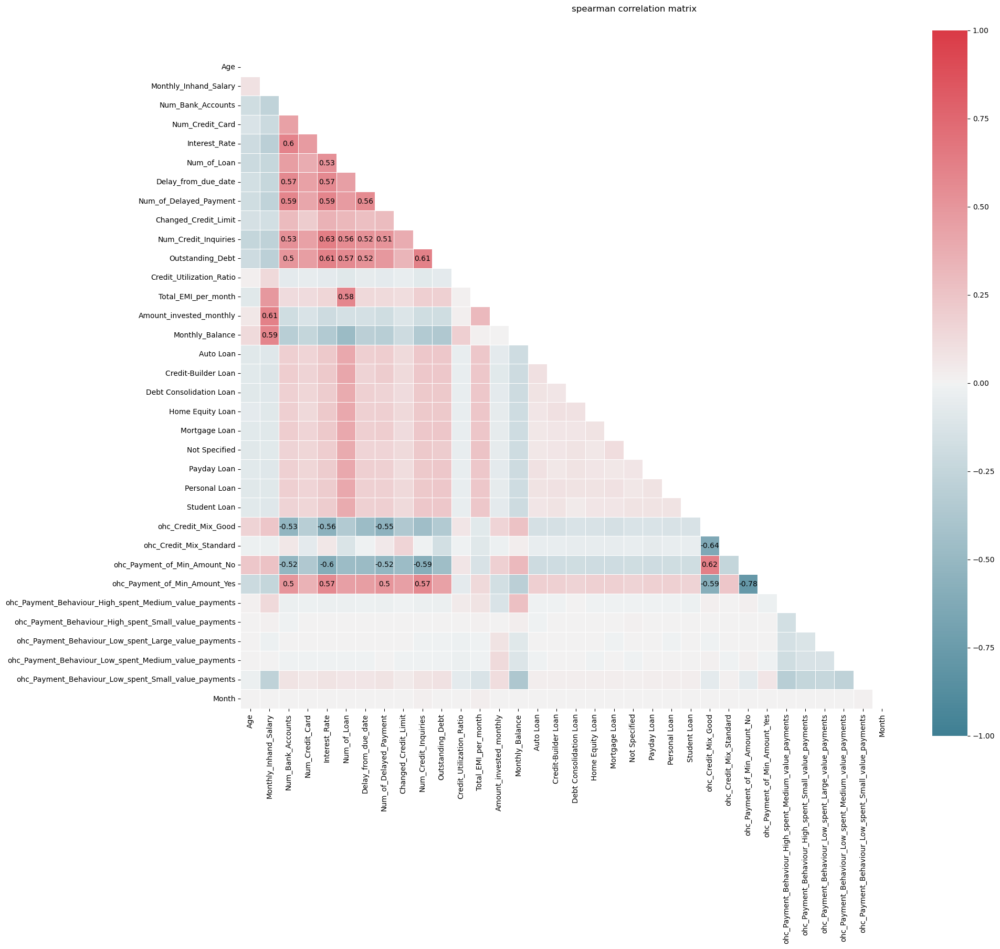

In [808]:
# plotting the correlation matrix

corr_matrix(df_corr, 'spearman')

As we don't find any problematically high correlations between variables, we won't remove any.

It is worth noting that we will have a specific section below for further in-depth feature selection/engineering, using processes such as lasso and ridge regression to select the best/most relevant variables that lead to the best results for our model(s).

<a id = "resampling"></a>

### 4.7. Re-Sampling

Resampling is a technique used to improve the performance of a model by manipulating the training data. The goal of resampling is to increase the robustness and accuracy of the model, especially when working with imbalanced datasets or when there is limited data available for training. We will perform three types of resampling and evaluate which would be the best for our dataset and models.

In [809]:
df = df.drop(['Customer_ID', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour'], 1)

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.


In [810]:
train_X = df

<a id = "smote"></a>

#### 4.7.1. Oversampling (SMOTE)


The SMOTE algorithm generates synthetic samples for the minority class by interpolating between existing minority class samples.

In SMOTE, the algorithm creates synthetic samples by taking each minority class sample and introducing synthetic samples along the line segments joining its k-nearest neighbors. The number of synthetic samples generated is controlled by a user-defined parameter, which determines the degree of oversampling. The SMOTE algorithm ensures that the synthetic samples generated fall within the range of the minority class.

The SMOTE algorithm addresses the problem of overfitting that can arise from simply duplicating the minority class samples, as the synthetic samples are not exact replicas of existing samples. Instead, they introduce new variation and help to balance the distribution of the minority class in the dataset. Additionally, SMOTE can be combined with other techniques such as undersampling or cost-sensitive learning to further improve the performance of the model.

Below if our function and graph of our SMOTE process:

In [811]:
train_y = OrdinalEncoder(categories = [['Poor', 'Standard', 'Good']]).fit_transform(train_y.to_frame())
train_y = train_y.flatten()

In [812]:
def apply_smote_umap(X_train, y_train):
    """
    Applies SMOTE to train data, reduces dimensionality with UMAP, and plots results.
    
    Parameters:
    - X_train and y_train"""
    
    # Apply SMOTE to train data only
    X_smote_resampled, y_smote_resampled = SMOTE().fit_resample(X_train, y_train)
    
    # Reduce dimensionality with UMAP
    reducer = UMAP.UMAP(n_neighbors=5, random_state=42)
    embeded= reducer.fit_transform(X_train)
    embeded1= reducer.fit_transform(X_smote_resampled)
    
    #Plot of results
    sns.scatterplot(x=embeded[:,0], y=embeded[:,1], hue=y_train)
    plt.title('Original Training Dataset - UMAP Visualization')
    plt.show()

    sns.scatterplot(x=embeded1[:,0], y=embeded1[:,1], hue=y_smote_resampled)
    plt.title('Resampled Training Dataset - UMAP Visualization')
    plt.show()


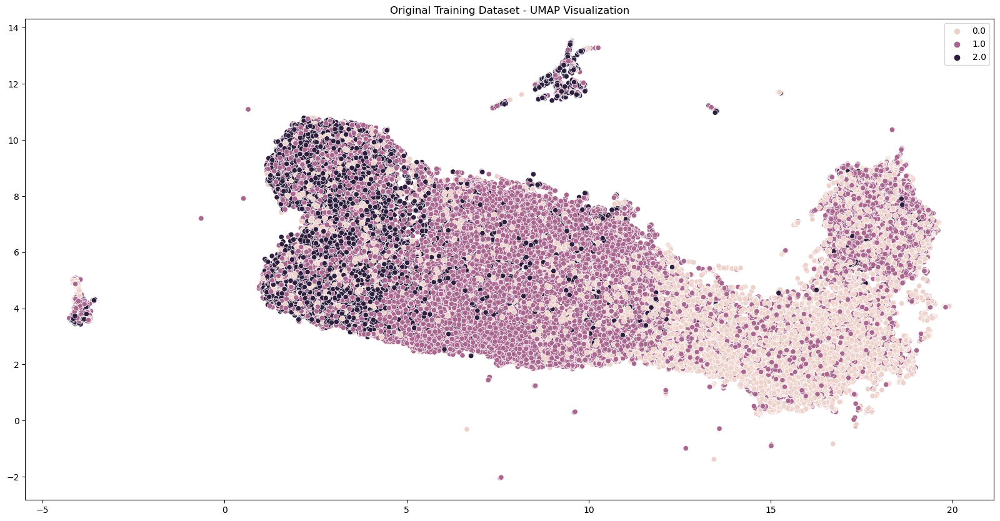

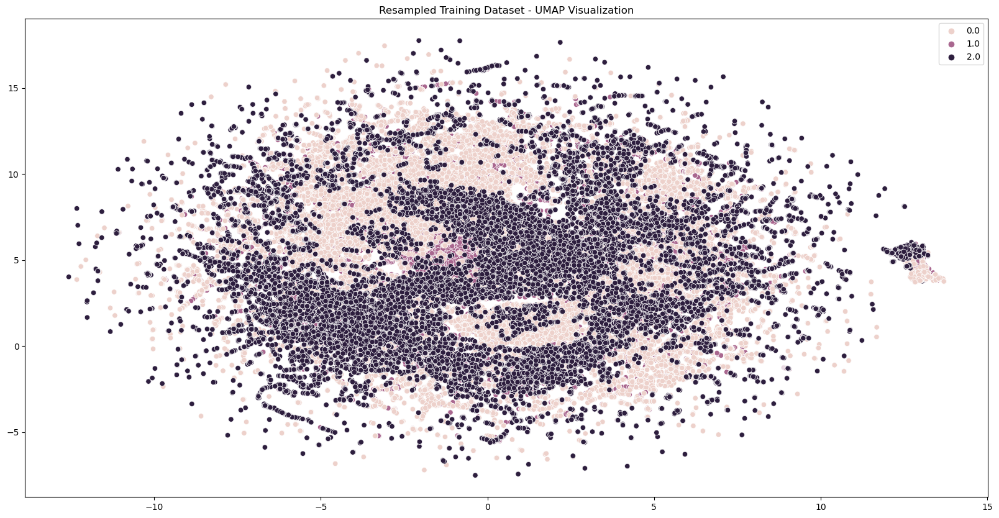

In [813]:
apply_smote_umap(train_X, train_y)

<a id = "oversampling"></a>

#### 4.7.2. Oversampling (Random OverSampler)


Oversampling is a technique used to address the issue of imbalanced datasets, where one class is underrepresented compared to the other class(es). In such scenarios, a model trained on the imbalanced dataset may have poor performance, as it tends to predict the majority class more frequently due to the bias towards that class in the training data. Oversampling involves creating additional samples of the minority class to balance the distribution of the classes in the dataset.

To adress the issue of possible overfitting of the model, we will use cross-validation and tune hyperparameters later on in the process.

In [814]:
def apply_oversample_umap(X_train, y_train):
    """
    Applies Oversample to train data, reduces dimensionality with UMAP, and plots results.
    
    Parameters:
    - X_train and y_train"""
    
    # Apply Oversample to train data only
    
    ros = RandomOverSampler(random_state=42)
    X_over_resampled, y_over_resampled = ros.fit_resample(X_train, y_train)    
    
    # Reduce dimensionality with UMAP
    reducer = UMAP.UMAP(n_neighbors=5, random_state=42)
    embeded2= reducer.fit_transform(X_train)
    embeded3= reducer.fit_transform(X_over_resampled)
    
    #Plot results
    sns.scatterplot(x=embeded2[:,0], y=embeded2[:,1], hue=y_train)
    plt.title('Original Training Dataset - UMAP Visualization')
    plt.show()

    embeded3= reducer.fit_transform(X_over_resampled)
    sns.scatterplot(x=embeded3[:,0], y=embeded3[:,1], hue=y_over_resampled)
    plt.title('Resampled Training Dataset - UMAP Visualization')
    plt.show()

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!


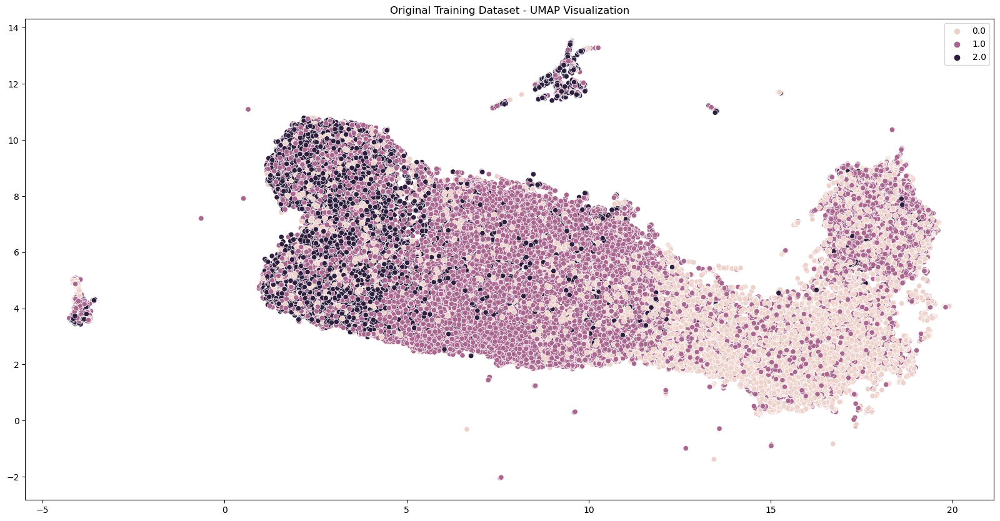

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!


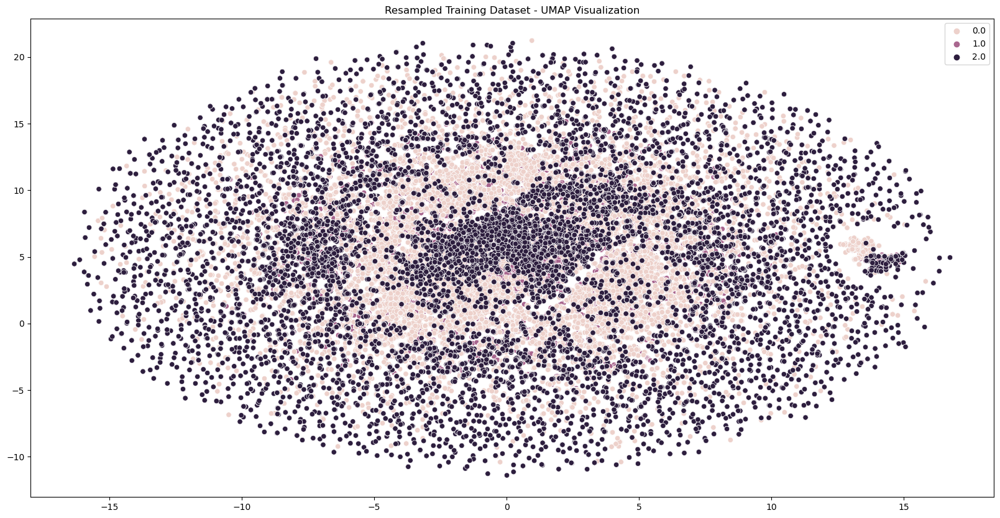

In [815]:
apply_oversample_umap(train_X, train_y)

<a id = "undersampling"></a>

#### 4.7.3. Undersampling

Undersampling is a technique used to address the issue of imbalanced datasets, where one class is underrepresented compared to the other classes. In such scenarios, a model trained on the imbalanced dataset may have poor performance, as it tends to predict the majority class more frequently due to the bias towards that class in the training data. Undersampling involves reducing the number of samples of the majority class to balance the distribution of the classes in the dataset.

After analysing the results, in order to combat the possible issue of underfitting if we decide to use undersampling, we will study the possibility of combining this technique with Oversampling, either by RandomOversampler or SMOTE.

In [816]:
def apply_undersample_umap(X_train, y_train):
    """
    Applies Oversample to train data, reduces dimensionality with UMAP, and plots results.
    
    Parameters:
    - X_train and y_train"""
    
    # Apply Oversample to train data only
    
    ros = RandomUnderSampler(random_state=42)
    X_over_resampled, y_over_resampled = ros.fit_resample(X_train, y_train)    
    
    # Reduce dimensionality with UMAP
    reducer = UMAP.UMAP(n_neighbors=5, random_state=42)
    embeded2= reducer.fit_transform(X_train)
    embeded3= reducer.fit_transform(X_over_resampled)
    
    #Plot results
    sns.scatterplot(x=embeded2[:,0], y=embeded2[:,1], hue=y_train)
    plt.title('Original Training Dataset - UMAP Visualization')
    plt.show()

    embeded3= reducer.fit_transform(X_over_resampled)
    sns.scatterplot(x=embeded3[:,0], y=embeded3[:,1], hue=y_over_resampled)
    plt.title('Resampled Training Dataset - UMAP Visualization')
    plt.show()

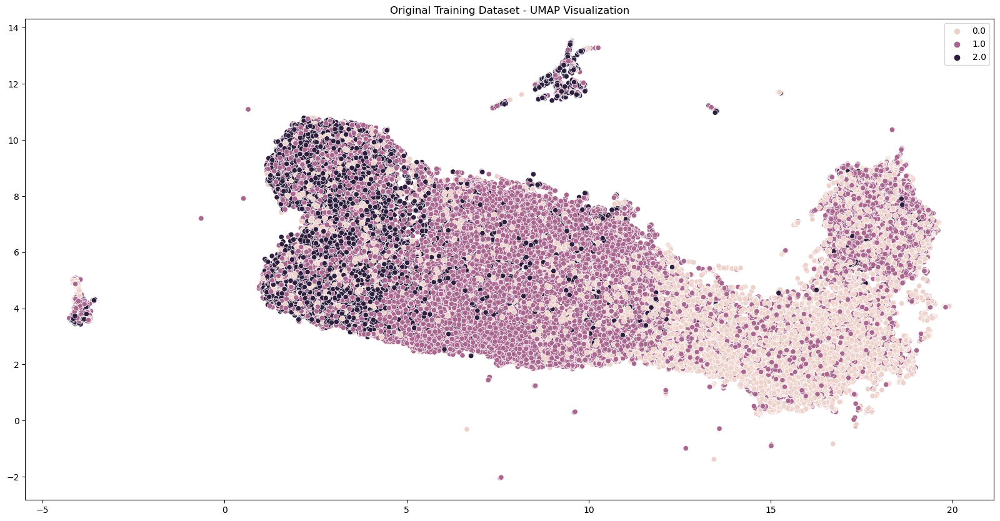

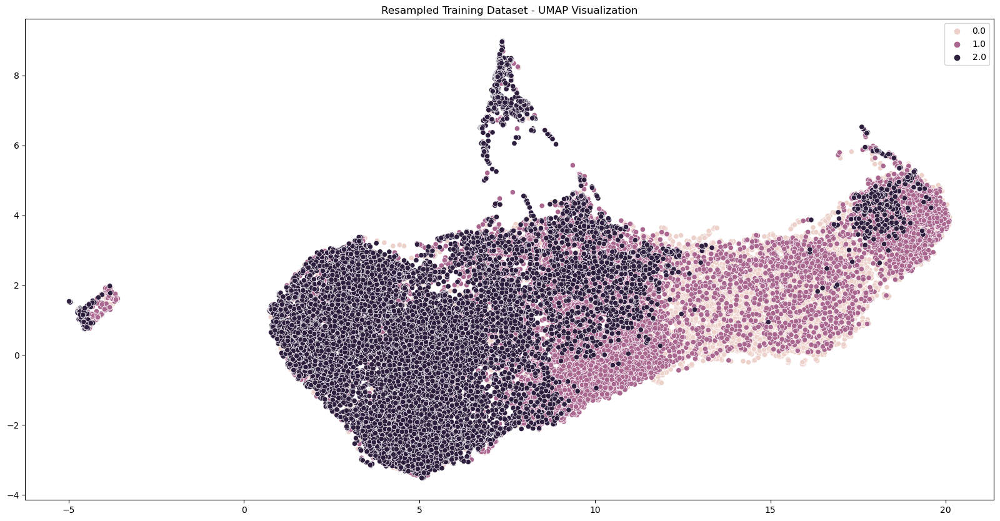

In [817]:
apply_undersample_umap(train_X, train_y)

#### 4.7.4. Overview

After having done the 3 resampling methods, one can see that with Undersampling, the dataset indeed becomes smaller. However, it also has the potential to introduce bias in our target estimation,which can occur because the undersampling process discards valuable information about the majority class, which can affect the ability of the model to generalize to new data. We believe that in the case of developing a Credit Score for a set of individuals, it is essential to have a representative sample that reflects the underlying population's characteristics, so using undersampling might not be a good option since it can lead to an inaccurate Credit Score estimation due to the reduced sample size and loss of information.

Looking at the Oversampling and more specifically RandomOverSampler, one can see that, with this resampling method, the classes that benefit the most are class 0 and class 2 (Bad and Good Credit Score, respectively), with the class 1 (Average Score) not benefiting as much as the 2 previous classes which can also have an impact in the final results. Indeed having more data can lead to a better estimation for the Credit Score, but in this case having a large sample where the majority of the data belongs to either class 0 or class 2 can and will lead to extreme final results. If this resampling method were to be used it could lead to results where a client would have either a good or bad Credit Score, with very rare and sparse cases of the average score classification, which skews and affects our model(s). 

On the other hand, SMOTE resampling method showed some advantages compared to RandomOverSampler, resulting in a more balanced and uniform distribution across all classes, reducing the chances of extreme Credit Score estimations. Moreover, in general terms, SMOTE can also help alleviate overfitting by creating synthetic samples that are less similar to existing samples.

For the reasons stated, and upon further confirmation by running a grid-search that includes the sampling methods, our model(s) will probably benefit the most from utilizing SMOTE.

<a id = "summary"></a>

### 4.8. Summary

In [818]:
# getting the main descriptive statistics

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,75000.0,1.739409e-16,1.000007,-1.458096,-0.889444,-0.036465,0.816515,2.143371
Monthly_Inhand_Salary,75000.0,3.577346e-16,1.000007,-1.237478,-0.808136,-0.336414,0.559768,3.558550
Num_Bank_Accounts,75000.0,-8.706517e-17,1.000007,-2.070439,-0.917250,0.235938,0.620335,1.773523
Num_Credit_Card,75000.0,-1.532878e-16,1.000007,-2.679155,-0.748919,-0.266360,0.698758,2.628995
Interest_Rate,75000.0,-3.353762e-17,1.000007,-1.545796,-0.865460,-0.185124,0.608601,2.196052
Num_of_Loan,75000.0,-2.338159e-16,1.000007,-1.456239,-0.636469,-0.226583,0.593187,2.232728
Delay_from_due_date,75000.0,-5.551707e-17,1.000007,-1.431527,-0.753849,-0.211707,0.465970,3.108912
Num_of_Delayed_Payment,75000.0,1.271398e-16,1.000007,-2.191809,-0.720512,0.096875,0.750784,2.385558
Changed_Credit_Limit,75000.0,4.028304e-16,1.000007,-1.609880,-0.746360,-0.166634,0.665016,4.000719
Num_Credit_Inquiries,75000.0,2.122154e-17,1.000007,-1.518763,-0.732115,-0.207682,0.578966,2.938913


<a id = "feature-selection"></a>

## 5. Feature Selection

- 5.1. [Lasso Regression](#lasso)
- 5.2. [Ridge Regression](#ridge)

[Back to TOC](#toc)

At this stage we will split the target from the rest of the dataset.

In [819]:
# creating a function to plot the importance of the features

def plot_importance(coef, name):
    
    # sorting the values of the coefficients given by the lasso regression
    imp_coef = coef.sort_values()
    
    # ploting the figures
    plt.figure(figsize = (12, 12))
    imp_coef.plot(kind = 'barh', color = '#8d99ae')
    plt.title('Feature importance using ' + name + ' model')
    plt.show()

<a id = "lasso"></a>

### 5.1. Lasso regression

The idea of using Lasso regression for feature selection purposes is: we fit a Lasso regression on a scaled version of our dataset and we consider only those features that have a coefficient different from 0. By trying to minimize the cost function, which is the sum of the squared error between the actual and predicted values, and the Lasso penalty term, the magnitude of the coefficients is shrinked towards 0, and those coefficients that are less important or redundant are reduced to 0, indicating that their corresponding features are not contributing significantly to the prediction performance. In this way, Lasso regression automatically performs feature selection by identifying the relevant features that are important for prediction and discarding the irrelevant ones.

We will be testing out Lasso Regression for our dataset and the results will be shown below:

In [820]:
# creating a lasso regression instance
lasso_reg = LassoCV(random_state = 5)

# fitting the data to reg
lasso_reg.fit(train_X, train_y)

# assigning the coefficients to the features in a pandas series
lasso_coef = pd.Series(lasso_reg.coef_, index = train_X.columns)
lasso_coef

Age                                                       0.011977
Monthly_Inhand_Salary                                    -0.002343
Num_Bank_Accounts                                        -0.004566
Num_Credit_Card                                          -0.097810
Interest_Rate                                            -0.116918
Num_of_Loan                                              -0.037323
Delay_from_due_date                                      -0.080550
Num_of_Delayed_Payment                                    0.002535
Changed_Credit_Limit                                      0.074757
Num_Credit_Inquiries                                     -0.069175
Outstanding_Debt                                         -0.027422
Credit_Utilization_Ratio                                 -0.001423
Total_EMI_per_month                                       0.055589
Amount_invested_monthly                                  -0.000000
Monthly_Balance                                          -0.03

In [821]:
print('Lasso picked ' + str(sum(lasso_coef != 0)) + ' variables and eliminated the other ' +  str(sum(lasso_coef == 0)) + ' variables')

Lasso picked 32 variables and eliminated the other 2 variables


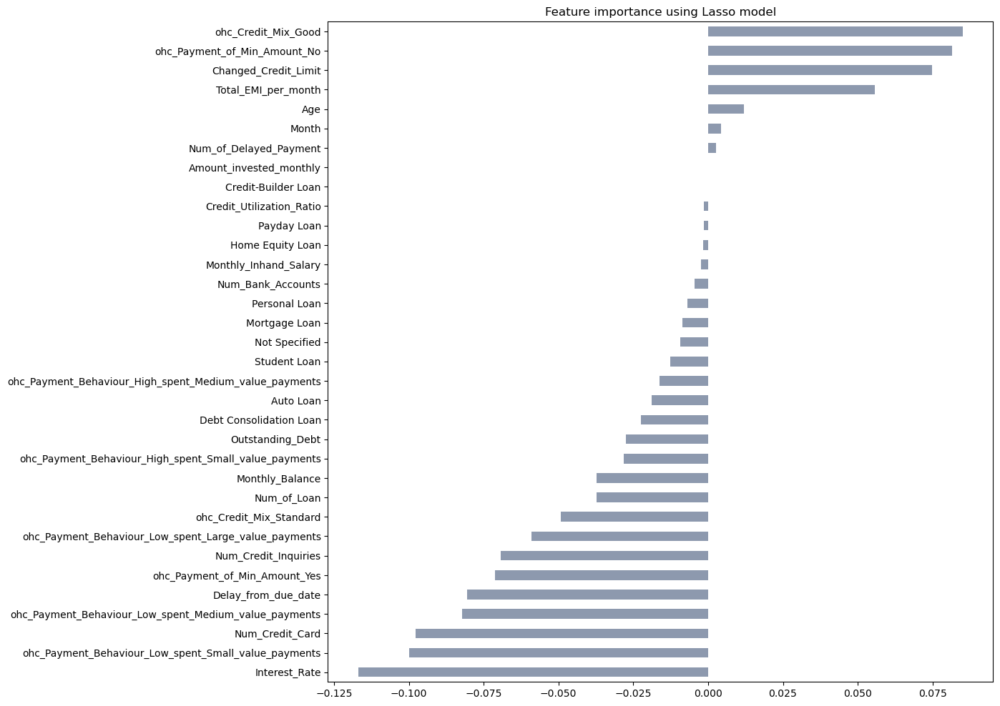

In [822]:
# calling the function to plot the importance of the features

plot_importance(lasso_coef, 'Lasso')

As one can see, Lasso Regression considered the variables Credit-Builder Loan and Amount Invested Monthly as unimportant and eliminated them in terms of predicting an individual's credit score. This decision could have been based on low correlation with the target data or even due to high levels of noise in the variables. More grounded explanations could include that while a Credit Builder Loan can be helpful for people who are new to credit or have a low credit score, it may not be as relevant for people who already have an established credit history, so, in other words, the impact of a Credit-Builder Loan on an individual's credit score may be relatively small compared to many other factors. Regarding the Amount Invested Monthly, the amount of money an individual invests each month may not be a good indicator of their creditworthiness. While investing money regularly can be a sign of responsible financial behavior, it doesn't necessarily mean that the person is managing their credit well as, for example, one who invests heavily in the stock market but consistently misses credit card payments may have a very low credit score, despite their investment activity.

<a id = "ridge"></a>

### 5.2. Ridge regression

Ridge regression is a method to estimate the coefficient of multiple regression models. Both Lasso and Ridge regression work by penalizing the magnitude of coefficients of features along with minimizing the error between predictions and actual values or records, the biggest difference is that Lasso can reduce the coefficient of a feature to zero (elliminating it), while Ridge cannot. So, we find that Ridge regression performs better when the data consists of features which are sure to be more relevant and useful.
https://analyticsindiamag.com/a-hands-on-guide-to-ridge-regression-for-feature-selection/

In [823]:
# creating a ridge regression instance
ridge_reg = Ridge(random_state = 5)

# fitting the data to reg
ridge_reg.fit(train_X, train_y)

# assigning the coefficients to the features in a pandas series
ridge_coef = pd.Series(ridge_reg.coef_, index = train_X.columns)
ridge_coef

Age                                                       0.012154
Monthly_Inhand_Salary                                    -0.002082
Num_Bank_Accounts                                        -0.004802
Num_Credit_Card                                          -0.097940
Interest_Rate                                            -0.116595
Num_of_Loan                                              -0.029852
Delay_from_due_date                                      -0.080809
Num_of_Delayed_Payment                                    0.004050
Changed_Credit_Limit                                      0.075736
Num_Credit_Inquiries                                     -0.069012
Outstanding_Debt                                         -0.028365
Credit_Utilization_Ratio                                 -0.001769
Total_EMI_per_month                                       0.056114
Amount_invested_monthly                                   0.000010
Monthly_Balance                                          -0.04

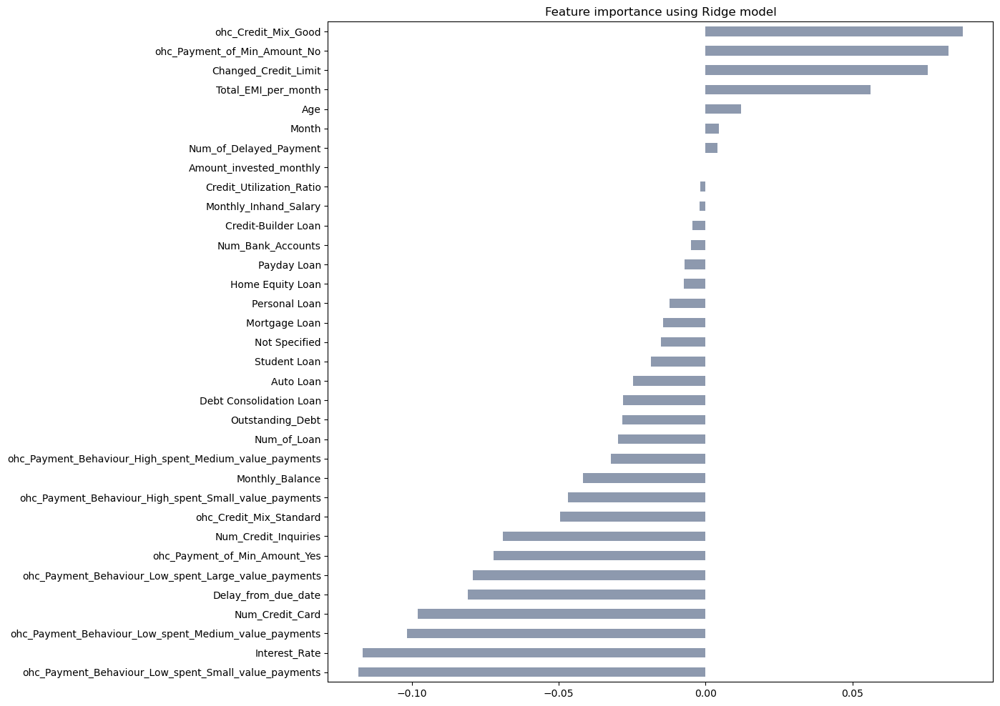

In [824]:
# calling the function to plot the importance of the features

plot_importance(ridge_coef, 'Ridge')

After applying both regression processes, we observed that the Loan variables and Amount_invested_monthly were considered among the least important features, meaning that these variables did not significantly contribute to the prediction of an individual's credit score, and their inclusion in the model may not improve its overall accuracy.Moreover, the variable Month was also considered to have low relevance in both models, indicating that the month in which an individual applies for a credit score does not significantly impact the final result. 

So, in light of these results, we decided to drop these variables from the model to simplify it and improve its interpretability.

In [825]:
drop_cols = ['Credit-Builder Loan', 'Debt Consolidation Loan', 'Home Equity Loan', 'Mortgage Loan', 'Not Specified', 'Payday Loan', 'Personal Loan', 'Month', 'Amount_invested_monthly']

train_X.drop(drop_cols, axis=1, inplace=True)

<a id = "modelling"></a>

## 6. Modelling

- 6.1. [Logistic Regression](#logistic-regression)
- 6.2. [Decision Tree](#decision-tree)

[Back to TOC](#toc)

<a id = "logistic-regression"></a>

### 6.1. Logistic Regression

In our classification problem, we are interested in predicting the quality of credit, which is represented by discrete values 0, 1, or 2. To achieve this, we have opted to test logistic regression, which is a popular and effective technique for binary classification problems. Logistic regression models the probability of a certain class, which is then converted into a binary outcome by applying a threshold.

The logistic regression model is built by fitting a 'S' shaped function, also known as a logistic function, to the data. This function maps the input variables to the output probabilities, which can range between 0 and 1. The decision boundary is set at 0.5, so any prediction above this threshold is classified as positive (1 or 2) and negative otherwise (0).

To obtain optimal performance from our model, we will use Grid Search to tune the hyperparameters. This technique involves searching over a range of possible parameter values to find the combination that yields the best performance. Additionally, we have decided to use the F1 weighted metric as our performance measure, given the multi-class nature of the data, as this metric takes into account both precision and recall for all classes, providing an overall measure of the model's accuracy. Further details on the evaluation metrics used can be found in the Evaluation section of our analysis.

In [826]:
param_grid = {'C': np.arange(0.002, 0.2, 0.01)}

grid_search = GridSearchCV(LogisticRegression(multi_class='multinomial', random_state=42, max_iter=1000), param_grid, scoring="f1_weighted", cv=3)

In [827]:
grid_search.fit(train_X, train_y)

GridSearchCV(cv=3,
             estimator=LogisticRegression(max_iter=1000,
                                          multi_class='multinomial',
                                          random_state=42),
             param_grid={'C': array([0.002, 0.012, 0.022, 0.032, 0.042, 0.052, 0.062, 0.072, 0.082,
       0.092, 0.102, 0.112, 0.122, 0.132, 0.142, 0.152, 0.162, 0.172,
       0.182, 0.192])},
             scoring='f1_weighted')

In [828]:
grid_search.best_params_

{'C': 0.14200000000000002}

In [829]:
# See results for each parameter in Grid Search
results = pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.662816,0.030298,0.013003,8.167295e-04,0.002,{'C': 0.002},0.633415,0.638370,0.643314,0.638366,0.004041,20
1,0.965020,0.052720,0.013338,1.245813e-03,0.012,{'C': 0.012},0.636292,0.643557,0.646407,0.642085,0.004258,19
2,0.986477,0.048118,0.014024,8.426595e-04,0.022,{'C': 0.022},0.636446,0.643825,0.646811,0.642361,0.004356,18
3,1.045525,0.077196,0.014004,8.168268e-04,0.032,{'C': 0.032},0.636978,0.643859,0.646739,0.642525,0.004095,17
4,1.169263,0.088485,0.014337,9.427407e-04,0.042,{'C': 0.042},0.637023,0.643889,0.646837,0.642583,0.004112,16
5,1.152954,0.034097,0.014670,1.247808e-03,0.052,{'C': 0.052000000000000005},0.637183,0.643971,0.646977,0.642710,0.004097,15
6,1.115090,0.042860,0.013677,4.765777e-04,0.062,{'C': 0.062},0.637219,0.644021,0.646968,0.642736,0.004082,14
7,1.064744,0.058506,0.014333,4.742644e-04,0.072,{'C': 0.07200000000000001},0.637339,0.644142,0.647017,0.642833,0.004058,12
8,1.140050,0.045708,0.014337,9.431341e-04,0.082,{'C': 0.082},0.637304,0.644225,0.647119,0.642883,0.004118,5
9,1.180599,0.041356,0.014003,8.104673e-07,0.092,{'C': 0.092},0.637212,0.644190,0.647164,0.642855,0.004171,10


In [830]:
# fit the model and observe: coefficients, intercept and training set score
log_reg = LogisticRegression(C=grid_search.best_params_['C'], penalty = 'l2', multi_class='multinomial')
log_reg.fit(train_X, train_y)
print("coeffecients: \n", log_reg.coef_)
print("intercept: \n", log_reg.intercept_)
print('Training set score:' , log_reg.score(train_X, train_y))

coeffecients: 
 [[-3.60964704e-02 -2.33854204e-02 -7.04631067e-03  2.96477792e-01
   4.36468535e-01  1.72679869e-01  3.24822140e-01 -6.17167566e-02
  -2.61917656e-01  2.69819949e-01  1.49314136e-01  5.34815317e-03
  -1.41736465e-01  1.27166773e-01  5.21716285e-02  3.62528799e-02
   7.15654853e-01  2.47633604e-01 -1.74611547e-01  3.21815699e-01
   1.02718377e-01  1.52312801e-01  2.67550610e-01  3.54100151e-01
   3.99943611e-01]
 [-5.26564233e-03  1.45586748e-02  1.65269704e-02  7.21165857e-02
  -6.59035021e-02  3.27860986e-02  6.26998417e-02  5.96010486e-02
   1.80212509e-01 -1.61721477e-01 -6.56497373e-02  4.98627794e-05
  -7.15295256e-02  2.64388835e-02 -1.96781100e-02 -3.75414083e-02
  -6.28843028e-01  1.86641435e-01  2.78636412e-02  2.72678241e-01
  -8.34498207e-03 -1.35185623e-03 -1.25918977e-02 -2.54883809e-02
  -3.21703505e-03]
 [ 4.13621128e-02  8.82674563e-03 -9.48065973e-03 -3.68594377e-01
  -3.70565033e-01 -2.05465967e-01 -3.87521982e-01  2.11570807e-03
   8.17051470e-02 -1.0

<a id = "decision-tree"></a>

### 6.2. Decision Tree

Decision trees use simple decision rules inferred from the data features to learn the patterns. Decision trees' main advantages are that they are easy to understand and interpret (as they can be visualized), and they accept all kinds of features (both numerical and categorical/ordinal data). The problem with this type of algorithm is that they do not generalize the data well, meaning that they tend to overfit to the training data, which is a disadvantage unless we cut the tree, and they are unstable since small variations in the data usually lead to completely different trees. As a scoring measure, we decided to use F1-weighted, for the same reason as before.

In [831]:
# defining an instance of a DecisionTreeClassifier, and overfitting the tree with maximum dept

dt_test = DecisionTreeClassifier(random_state = 5)
dt_test.fit(train_X, train_y)
print('Training set score:' , dt_test.score(train_X, train_y))


Training set score: 1.0


In [832]:
print('number of nodes is ', dt_test.tree_.node_count)
print('depth of the tree is ', dt_test.tree_.max_depth)

number of nodes is  28827
depth of the tree is  46


We will now look into which hyperparameters are better to cut the tree, and avoid overfitting.

In [833]:
distributions= dict(max_depth=randint(1, 20), min_samples_leaf=randint(1, 20), criterion= ["gini", "entropy"] )

In [834]:
tree = DecisionTreeClassifier()
random_search = RandomizedSearchCV(tree, distributions, n_iter=20, random_state=1, cv=10, scoring='f1_weighted')
random_search.fit(train_X, train_y)

RandomizedSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_iter=20,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000191CFED6790>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000191CA858D60>},
                   random_state=1, scoring='f1_weighted')

In [835]:
results = pd.DataFrame(random_search.cv_results_)
sorted(results.params, key=lambda x: (x['criterion'], x['max_depth'], x['min_samples_leaf']))

[{'criterion': 'entropy', 'max_depth': 1, 'min_samples_leaf': 14},
 {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 1},
 {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 5},
 {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 18},
 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 8},
 {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 19},
 {'criterion': 'entropy', 'max_depth': 12, 'min_samples_leaf': 13},
 {'criterion': 'entropy', 'max_depth': 14, 'min_samples_leaf': 7},
 {'criterion': 'entropy', 'max_depth': 16, 'min_samples_leaf': 1},
 {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 6},
 {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 13},
 {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 8},
 {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 12},
 {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 18},
 {'criterion': 'gini', 'max_depth': 12, 'min_samples_leaf': 11},
 {'crite

In [836]:
# see parameters that presented the best results
random_search.best_params_

{'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 18}

In [837]:
# apply previously seen parameters and observe performance on training data
dt = DecisionTreeClassifier(random_state = 5, criterion = 'entropy', max_depth = 7, min_samples_leaf = 18, splitter = 'best')
dt.fit(train_X, train_y)
print('Training set score:' , dt.score(train_X, train_y))

Training set score: 0.70716


It is observable that performance on training data is not spetacular for both trained models, delivering scores of about 70%.

<a id = "random-forest"></a>

### 6.3. Random Forest

Random Forest is an extension of decision trees that operates by constructing a multitude of decision trees and outputs the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. Random Forest's main advantage is that it has high accuracy and is robust to overfitting, as it uses an ensemble of decision trees that are constructed based on random subsets of features and data. This ensemble approach helps to smooth out individual decision trees' noise and reduce the variance of the model. In addition, Random Forest can handle both numerical and categorical/ordinal data, and it can be used for feature selection. 

However, the main disadvantage of Random Forest is that it is not as easily interpretable as decision trees, and it can be computationally expensive, especially for large datasets. 

As a scoring measure, we decided to use F1 for the same reasons above.

In [838]:
random_forest = RandomForestClassifier(random_state=42)

In [839]:
param_grid = { 
    'max_depth' : [4,6,8],
    'criterion' :['gini', 'entropy']
}

In [840]:
grid_rf = GridSearchCV(estimator=random_forest, param_grid=param_grid, cv=5)
grid_rf.fit(train_X, train_y)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 6, 8]})

In [841]:
# See results for each parameter in Grid Search
results = pd.DataFrame(grid_rf.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,4.308359,0.181019,0.091620,0.003262,gini,4,"{'criterion': 'gini', 'max_depth': 4}",0.655267,0.657867,0.655800,0.650733,0.668600,0.657653,0.005948,6
1,6.163913,0.129335,0.104423,0.006408,gini,6,"{'criterion': 'gini', 'max_depth': 6}",0.673533,0.684400,0.684200,0.672867,0.695200,0.682040,0.008245,3
2,7.711482,0.044342,0.119195,0.001762,gini,8,"{'criterion': 'gini', 'max_depth': 8}",0.685133,0.695800,0.695667,0.684067,0.705000,0.693133,0.007753,2
3,5.118364,0.055559,0.090019,0.002685,entropy,4,"{'criterion': 'entropy', 'max_depth': 4}",0.656267,0.657000,0.656000,0.650067,0.671733,0.658213,0.007202,5
4,7.386884,0.011069,0.102419,0.002248,entropy,6,"{'criterion': 'entropy', 'max_depth': 6}",0.673533,0.681133,0.684400,0.667733,0.696400,0.680640,0.009796,4
5,9.597858,0.055345,0.118623,0.001347,entropy,8,"{'criterion': 'entropy', 'max_depth': 8}",0.686133,0.694133,0.698000,0.681067,0.708467,0.693560,0.009524,1


In [842]:
rf = grid_rf.best_estimator_
rf.fit(train_X, train_y)
print('Training set score:' , rf.score(train_X, train_y))

Training set score: 0.71204


<a id = "gradient-boosting"></a>

### 6.4. Gradient Boosting (LightGBM)

LightGBM is a gradient boosting framework that uses decision trees as the base learner. Like decision trees, it can handle both numerical and categorical data, making it a versatile algorithm. The main advantages of LightGBM are that it is scalable, fast, and accurate. It is scalable in that it can handle large datasets and can be distributed across multiple machines. It is fast in that it uses a novel algorithm to find the split points for the decision trees, making it one of the fastest gradient boosting frameworks available. It is accurate in that it can achieve state-of-the-art performance on a variety of machine learning tasks.

However, like decision trees, LightGBM can overfit to the training data if not properly regularized. To avoid overfitting, we can use regularization techniques such as early stopping, bagging, and feature subsampling. In this case, we will utilize bagging, as it seems to be an approachable and efficient method. Additionally, LightGBM is also sensitive to the choice of hyperparameters, so it is important to use techniques such as randomized search to find the best hyperparameters for the model.

As a scoring measure, we used F1-weighted score, for the same reasons stated above.

In [843]:
# Define the parameters to search over
param_distributions = {
    'max_depth': randint(1, 20),
    'min_child_samples': randint(1, 20),
    'num_leaves': randint(10, 50),
    'learning_rate': [0.01, 0.05, 0.1],
    'bagging_fraction': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.9],
}

In [844]:
# Create a LightGBM model
lgb_model = lgb.LGBMClassifier(random_state=42, n_jobs=-1)

In [845]:
# Create a randomized search object to find the best hyperparameters
random_search = RandomizedSearchCV(
    lgb_model,
    param_distributions,
    n_iter=20,
    random_state=42,
    cv=10,
    scoring='f1_weighted'
)

In [ ]:
# Fit the randomized search object to the training data
random_search.fit(train_X, train_y, verbose=False)

In [847]:
# Print the best hyperparameters found by the search
print(random_search.best_params_)

{'bagging_fraction': 0.9, 'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 12, 'min_child_samples': 2, 'num_leaves': 19}


In [848]:
# Create a LightGBM model with the best hyperparameters
lgb_model = lgb.LGBMClassifier(
    random_state=42,
    **random_search.best_params_
)

In [849]:
# Fit the model to the scaled training data
lgb_model.fit(train_X, train_y)

LGBMClassifier(bagging_fraction=0.9, colsample_bytree=0.7, learning_rate=0.05,
               max_depth=12, min_child_samples=2, num_leaves=19,
               random_state=42)

In [850]:
# Evaluate the model on the training set
print('Training set score:', lgb_model.score(train_X, train_y))

Training set score: 0.7191866666666666


<a id = "stacking"></a>

### 6.5. Stacking

The stacking model is an ensemble learning technique that combines the predictions of multiple machine learning models to improve overall performance. In our case, we used three different models as base learners: logistic regression, decision tree, and LightGBM. These models were trained on the same training set, and their predictions were combined using a meta-classifier, which was an XGBoost model.

XGBoost is a powerful gradient boosting framework that can handle both numerical and categorical data, making it a versatile algorithm. It is known for its speed and scalability, and it can achieve state-of-the-art performance on a variety of machine learning tasks. As with LightGBM, XGBoost is sensitive to the choice of hyperparameters, so it is important to use techniques such as randomized search to find the best hyperparameters for the model.

As a scoring measure, we used F1-weighted score, for the same reasons stated above.

In [851]:
# Combine the predictions of the three models on the training set
log_reg_preds = log_reg.predict_proba(train_X)
dt_preds = dt.predict_proba(train_X)
lgb_preds = lgb_model.predict_proba(train_X)
# Combine the predictions horizontally (axis=1) using np.concatenate function
train_meta = np.concatenate([log_reg_preds, dt_preds, lgb_preds], axis=1)
# The resulting array will have shape (number of samples, 3 * number of classes), as we are stacking the class probabilities

In [852]:
# Define the parameters to search over (for XGBoost)
param_distributions = {
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200]
}

In [853]:
xgb_model = xgb.XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric='mlogloss')
random_search = RandomizedSearchCV(xgb_model, param_distributions, n_iter=10, cv=3, scoring='f1_weighted')
random_search.fit(train_meta, train_y)

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False,
                                           eval_metric='mlogloss', gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=n...
                                           n_estimators=100, n_jobs=-1,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=42,
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None,
                                           subsample=None, tree_method=None,
                                           use_label_encoder=False,
                                           validate_parameters=None,
                                           verbosity=None),
                   param_distributions={'learning_rate': [0.01, 0.1],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [50, 100, 200]},
                   scoring='f1_weighted')

In [854]:
# Print the best hyperparameters found by the search
print(random_search.best_params_)

{'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.1}


In [855]:
xgb_model = xgb.XGBClassifier(
    random_state=42,
    **random_search.best_params_,
    use_label_encoder=False, 
    eval_metric='mlogloss',
    n_jobs=-1
)

In [856]:
xgb_model.fit(train_meta, train_y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=5, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=50, n_jobs=-1,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=42, reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', use_label_encoder=False,
              validate_parameters=1, ...)

In [857]:
train_preds = xgb_model.predict(train_meta)
train_score = f1_score(train_y, train_preds, average='weighted')
print('Training set score:', train_score)

Training set score: 0.7475940729678453


<a id = "neural-network"></a>

### 6.6. Neural Network

The basic building block of a neural network is the layer. Layers extract representations from the data fed into them. Hopefully, these representations are meaningful for the problem at hand.

Most of deep learning consists of chaining together simple layers. Most layers, such as layers.Dense, have parameters that are learned during training.

In [858]:
# Define the model
initializer = initializers.HeNormal(seed=0)
model = Sequential([
    layers.Dense(128, activation='relu', kernel_initializer=initializer),
    layers.Dense(10,  activation='softmax', kernel_initializer=initializer)
])

##### **Compiling the model**

Before the model is ready for training, it needs a few more settings. These are added during the model's compile step:

- Loss function —This measures how accurate the model is during training. We want to minimize this function to "steer" the model in the right direction.
- Optimizer —This is the method how the model updates the weights based on the data and the loss function. For example, Adam optimization is a stochastic gradient descent method with adaptive learning rate.
- Metrics —Used to monitor the training and testing steps. The following example uses accuracy,but also other metrics can be used.

In [859]:
# Compile the model
model.build(input_shape=train_X.shape)
model.compile(optimizer='adam',
              loss=losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

An early stopping was implemented due to computational reasons as the goal is to implement a neural network, not necessarily to find the neural network that fits our dataset.

In [860]:
early_stopping = callbacks.EarlyStopping(patience=10, monitor='val_loss')

##### **Visualization of the model's architecture**

The model's summary() method displays all the model's layers, including each layer's name (which is automatically generated unless we set it when creating the layer), its output shape (None means the batch size can be anything), and its number of parameters. The summary ends with the total number of parameters, including trainable and non-trainable parameters. Here we only have trainable parameters:

In [861]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (75000, 128)              3328      
                                                                 
 dense_6 (Dense)             (75000, 10)               1290      
                                                                 
Total params: 4,618
Trainable params: 4,618
Non-trainable params: 0
_________________________________________________________________


In [862]:
hidden1 = model.layers[1]
hidden1.name

'dense_6'

In [863]:
weights, biases = hidden1.get_weights()
print(weights.shape)
print(biases.shape)

(128, 10)
(10,)


In [864]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model.png', show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


##### **Training the model**

Training the neural network model requires the following steps:

1. Feed the training data to the model. In this example, the training data is in the X_train and y_train arrays
2. The model learns how to associate the train data.
3. We ask the model to make predictions about a test set.

##### **Fitting the model**

In [865]:
# Fitting the model
tf.random.set_seed(42)
np.random.seed(42)
history=model.fit(train_X, train_y, validation_split=0.2, epochs=100, callbacks=[early_stopping])

Epoch 1/100
1875/1875 [==============================] - 3s 1ms/step - loss: 0.7725 - accuracy: 0.6550 - val_loss: 0.7110 - val_accuracy: 0.6771
Epoch 2/100
1875/1875 [==============================] - 2s 1ms/step - loss: 0.7173 - accuracy: 0.6797 - val_loss: 0.6973 - val_accuracy: 0.6870
Epoch 3/100
1875/1875 [==============================] - 2s 1ms/step - loss: 0.7043 - accuracy: 0.6885 - val_loss: 0.7060 - val_accuracy: 0.6925
Epoch 4/100
1875/1875 [==============================] - 2s 1ms/step - loss: 0.6980 - accuracy: 0.6905 - val_loss: 0.6876 - val_accuracy: 0.6929
Epoch 5/100
1875/1875 [==============================] - 2s 1ms/step - loss: 0.6915 - accuracy: 0.6952 - val_loss: 0.6917 - val_accuracy: 0.6934
Epoch 6/100
1875/1875 [==============================] - 2s 1ms/step - loss: 0.6873 - accuracy: 0.6973 - val_loss: 0.6895 - val_accuracy: 0.6870
Epoch 7/100
1875/1875 [==============================] - 2s 1ms/step - loss: 0.6841 - accuracy: 0.6990 - val_loss: 0.6860 - val_ac

In [866]:
history.params
print(history.epoch)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]


In [867]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

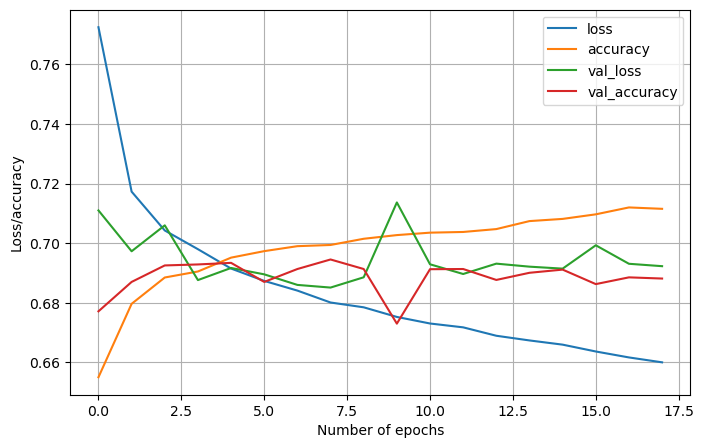

In [868]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.xlabel('Number of epochs')
plt.ylabel('Loss/accuracy')
plt.show()

##### **Results graph**

In the legend, loss and accuracy refer to the training loss and training accuracy. Loss is the value of the cost function which should be decreasing over time, and accuracy reflects the model performance, hence it should be increasing over time. Validation loss and validation accuracy refer to the parameters evaluated on the separate dataset.

We can see that both the training accuracy and the validation accuracy tend to increase during training, while the training loss and the validation loss decrease. Moreover, the validation curves are relatively close to the training curves, which means that there is not too much overfitting.

<a id = "pipeline"></a>

## 7. Pipeline

<a id = "evaluation-index"></a>

[Back to TOC](#toc)

In [869]:
# Function to drop Customer ID

def drop_id(df):

    df = df.drop('Customer_ID', axis=1)

    return df

drop_id = Pipeline(steps=[
    ('dropID', FunctionTransformer(drop_id))])

In [870]:
# Build processor pipeline with imputation, scaling and encoding

metric_features = ['Age', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt',
 'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly',
 'Monthly_Balance']

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_imputer = Pipeline([ 
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder())
])

categorical_oe = Pipeline([ 
    ('ordinal', OrdinalEncoder(categories = ordinal_categories)) 
])

ohc_feat = ['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour']
oe_feat = ['Month']

processor = ColumnTransformer([
    ('numerical_imputer', numerical_transformer, metric_features),
    ('categorical_imputer', categorical_imputer, ohc_feat),
    ('categorical_oe', categorical_oe, oe_feat),
], remainder='drop')

In [871]:
# Define train and test sets
train_X, train_y = train.drop('Credit_Score', axis=1), train['Credit_Score']
test_X, test_y = test.drop('Credit_Score', axis=1), test['Credit_Score']

In [872]:
# Apply initial transformations

pipe1 = Pipeline([('initialTransform', initial_transformer),
                 ('fix_customer_outlier_numeric', fix_CustOutlier_Num),
                 ('fix_customer_categorical', fix_CustCat),
                 ('dropID', drop_id),
                ])

train_X = pipe1.fit_transform(train_X, train_y)

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [873]:
# Encode target variable

train_y = train_y.to_frame()

pipe2 = Pipeline([ 
    ('ordinalTarget', OrdinalEncoder(categories = [['Poor', 'Standard', 'Good']])) 
])

train_y = pipe2.fit_transform(train_y)

In [874]:
# Build pipeline with steps to be optimized

pipe3 = imbPipeline([('processor', processor),
                  ('sampling', RandomUnderSampler(random_state=42)),
                  ('selection', SelectKBest()),
                  ('classifier', LogisticRegression(multi_class='multinomial', random_state=42))
                ])

# pipe3.fit(train_X, train_y)

Note: As the group wasn't able to incorporate the imbalance Pipeline with Column Transformers that were required, this build felt like the closest to optimal with the available capability. It maintains our capability to optimize parameters and avoids data leakage.

In [875]:
param_grid = [
    # Logistic Regression
    {   'processor__numerical_imputer__imputer': [SimpleImputer(strategy='mean')],
        'processor__numerical_imputer__scaler': [MinMaxScaler(), StandardScaler()],
        'sampling': [SMOTE(random_state=42),RandomOverSampler(random_state=42)],
        'selection__k': ['all', 10, 20], 
        'classifier': [LogisticRegression(penalty='l1', solver='liblinear', random_state=42)],
        'classifier__C': [0.01, 0.1],
    },
    {
        'processor__numerical_imputer__imputer': [SimpleImputer(strategy='mean')],
        'processor__numerical_imputer__scaler': [MinMaxScaler(), StandardScaler()],
        'sampling': [SMOTE(random_state=42),RandomOverSampler(random_state=42)],
        'selection__k': ['all', 10, 20], 
        'classifier': [LogisticRegression(penalty='l2', solver='lbfgs', random_state=42)],
        'classifier__C': [0.01, 0.1],
    },
    # Decision Tree
    {
        'processor__numerical_imputer__imputer': [SimpleImputer(strategy='mean')],
        'processor__numerical_imputer__scaler': [MinMaxScaler(), StandardScaler()],
        'sampling': [SMOTE(random_state=42),RandomOverSampler(random_state=42)],
        'selection__k': ['all', 10, 20], 
        'classifier': [DecisionTreeClassifier(random_state=42)],
        'classifier__max_depth': [5, 10],
    },
    # Random Forest
    {
        'processor__numerical_imputer__imputer': [SimpleImputer(strategy='mean')],
        'processor__numerical_imputer__scaler': [MinMaxScaler(), StandardScaler()],
        'sampling': [SMOTE(random_state=42),RandomOverSampler(random_state=42)],
        'selection__k': ['all', 10, 20], 
        'classifier': [RandomForestClassifier(random_state=42)],
        'classifier__n_estimators': [50, 100],
        'classifier__max_depth': [5, 10],
    },
    # LightGBM
    {
        'processor__numerical_imputer__imputer': [SimpleImputer(strategy='mean')],
        'processor__numerical_imputer__scaler': [MinMaxScaler(), StandardScaler()],
        'sampling': [SMOTE(random_state=42),RandomOverSampler(random_state=42)],
        'selection__k': ['all', 10, 20], 
        'classifier': [lgb.LGBMClassifier(random_state=42)],
        'classifier__max_depth': list(np.arange(5,11)),
        'classifier__n_estimators': [50, 100],
        'classifier__learning_rate': [0.001, 0.01],
    },
     # XGBoost
    {
        'processor__numerical_imputer__imputer': [SimpleImputer(strategy='mean')],
        'processor__numerical_imputer__scaler': [MinMaxScaler(), StandardScaler()],
        'sampling': [SMOTE(random_state=42),RandomOverSampler(random_state=42)],
        'selection__k': ['all', 10, 20], 
        'classifier': [xgb.XGBClassifier(random_state=42)],
        'classifier__n_estimators': [50, 100],
        'classifier__max_depth': [5, 10],
        'classifier__learning_rate': [0.01, 0.1],
        'classifier__colsample_bytree': [0.6, 0.8],
        'classifier__subsample': [0.6, 0.8]
}]

Optimization with KNN Imputer and UnderSampling wasn't conducted due to the lack of computational power. Please mind that the current Grid Search alone took over 6 hours to run completely on an octa-core CPU, and we estimated from previous attempts that incorporating KNN would multiply the running time by at least 4 times, totaling possible 24+ hours of runtime. This is also why we did not include some methods to reduce overfitting in this pipeline as well, as running it twice or more again to test performance would be too computationaly expensive. .

In [ ]:
grid = GridSearchCV(pipe3, param_grid, cv=5, scoring='f1_micro', verbose=1)
grid.fit(train_X, train_y)

In [169]:
grid.best_params_

{'classifier': XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
               colsample_bynode=None, colsample_bytree=0.8,
               enable_categorical=False, gamma=None, gpu_id=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_delta_step=None, max_depth=10,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               n_estimators=50, n_jobs=None, num_parallel_tree=None,
               predictor=None, random_state=42, reg_alpha=None, reg_lambda=None,
               scale_pos_weight=None, subsample=0.8, tree_method=None,
               validate_parameters=None, verbosity=None),
 'classifier__colsample_bytree': 0.8,
 'classifier__learning_rate': 0.1,
 'classifier__max_depth': 10,
 'classifier__n_estimators': 50,
 'classifier__subsample': 0.8,
 'processor__numerical_imputer__imputer': SimpleImputer(),
 'processor__numerical_imputer__scaler': StandardScaler(),
 'sampling':

As one can see, our predictions that StandardScaler would be used over MinMaxScaler due to the mostly close-to-normal distribution of our variables proved true. SMOTE was also chosen over other options, as discussed previously in this report.

In [171]:
grid.best_estimator_

Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('numerical_imputer',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Age',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries',
                                                   'O...
                               interaction_constraints='', learning_rate=0.1,
                               max_delta_step=0, max_depth=10,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=16, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, subsample=0.8,
                               tree_method='exact', validate_parameters=1,
                               verbosity=None))])

In [172]:
model1 = grid.best_estimator_

In [184]:
model1.fit(train_X, train_y)

D:\Anaconda\envs\mlcourse\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:14:09] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('numerical_imputer',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Age',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries',
                                                   'O...
                               interaction_constraints='', learning_rate=0.1,
                               max_delta_step=0, max_depth=10,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=16, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, subsample=0.8,
                               tree_method='exact', validate_parameters=1,
                               verbosity=None))])

In [191]:
print('Training set score:', model1.score(train_X, train_y))

Training set score: 0.8076666666666666


{'classifier': XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
               colsample_bynode=None, colsample_bytree=0.8,
               enable_categorical=False, gamma=None, gpu_id=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_delta_step=None, max_depth=10,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               n_estimators=50, n_jobs=None, num_parallel_tree=None,
               predictor=None, random_state=42, reg_alpha=None, reg_lambda=None,
               scale_pos_weight=None, subsample=0.8, tree_method=None,
               validate_parameters=None, verbosity=None),
 'classifier__colsample_bytree': 0.8,
 'classifier__learning_rate': 0.1,
 'classifier__max_depth': 10,
 'classifier__n_estimators': 50,
 'classifier__subsample': 0.8,
 'processor__numerical_imputer__imputer': SimpleImputer(),
 'processor__numerical_imputer__scaler': StandardScaler(),
 'sampling': SMOTE(random_state=42),
 'selection__k': 'all'}

In [876]:
# Build processor pipeline with imputation, scaling and encoding

model2 = imbPipeline([('processor', processor),
                  ('sampling', SMOTE(random_state=42)),
                  ('selection', SelectKBest(k = 'all')),
                  ('classifier', xgb.XGBClassifier(colsample_bytree=0.8, learning_rate=0.1, max_depth=10,
                                                n_estimators=50, random_state=42, subsample=0.8))
                ])

In [877]:
model2.fit(train_X, train_y)

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[01:53:06] WARNING: C:\Users\dev-admin\croot\xgboost-split_1675120659361\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('numerical_imputer',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Age',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries',
                                                   'O...
                               interaction_constraints='', learning_rate=0.1,
                               max_delta_step=0, max_depth=10,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=16, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, subsample=0.8,
                               tree_method='exact', validate_parameters=1,
                               verbosity=None))])

In [878]:
print('Training set score:', model2.score(train_X, train_y))

Training set score: 0.8076666666666666


<a id = "evaluation"></a>

## 8. Evaluation

<a id = "evaluation-index"></a>

[Back to TOC](#toc)

### Cleaning and Fitting

<a id = "apply-test"></a>

Apply cleaning to Test.

In [879]:
test_X = pipe1.fit_transform(test_X, test_y)

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


In [880]:
test_y = test_y.to_frame()
test_y = pipe2.fit_transform(test_y)

In [881]:
test_pred = model2.predict(test_X)

In [882]:
print('Test set score:', round(model2.score(test_X, test_y),3))

Test set score: 0.7


### Confusion Matrix

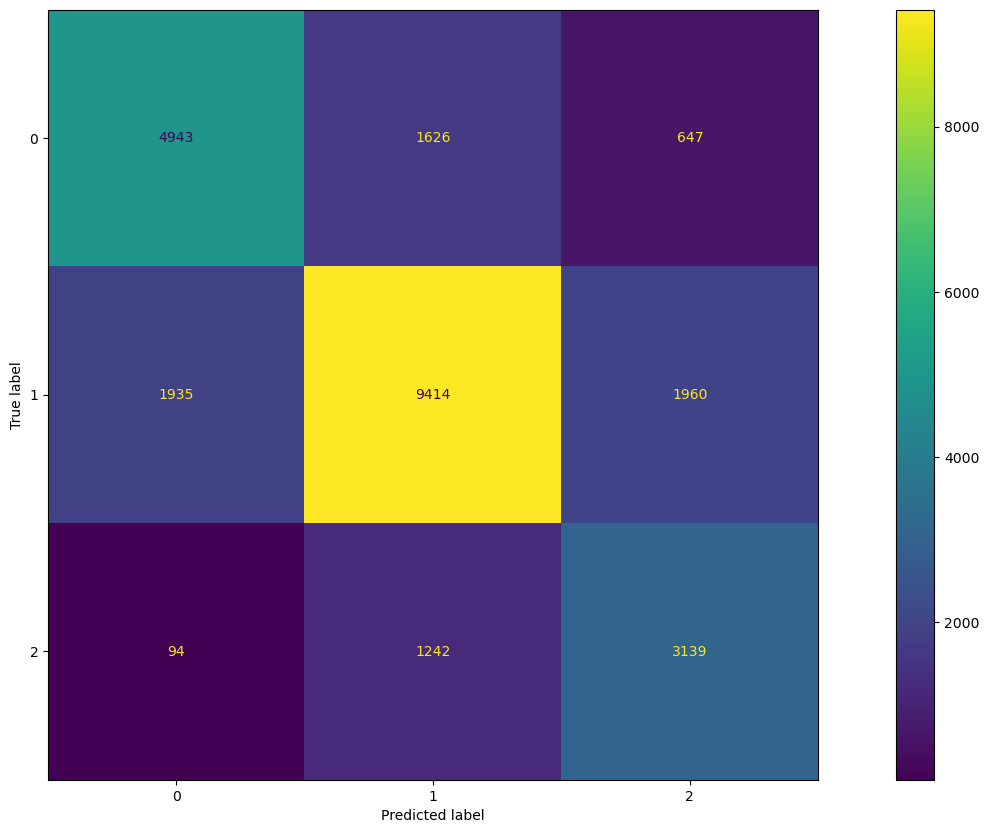

In [883]:
# build confusion matrix for model

from sklearn.metrics import confusion_matrix,  ConfusionMatrixDisplay
cm_model2 = confusion_matrix(test_y, test_pred)

ConfusionMatrixDisplay(cm_model2).plot()

One can observe that there is a big concentration of values in class 1, which represents the “Average” score for a given client. Indeed, one can conclude that the model’s performance in predicting this score is acceptable. However, this comes at the cost of not having the same performance for the other two classes, class 0 and class 2, “Poor” and “Good”, respectively. Looking at differences in terms of the estimations of the classes, one can see that the number of false negatives for class 1 with respect to class 0 is higher than the false positive for class 0 with respect to class 1, which can suggest that the model tends to underestimate more than overestimate the final credit score. This can be interpreted as a good indicator in the model’s performance, as for a bank it is better to underestimate the credit score of a customer rather than overestimate it.

### Classification Report

In [884]:
from sklearn.metrics import classification_report

print(classification_report(test_y, test_pred))

              precision    recall  f1-score   support

         0.0       0.71      0.69      0.70      7216
         1.0       0.77      0.71      0.74     13309
         2.0       0.55      0.70      0.61      4475

    accuracy                           0.70     25000
   macro avg       0.67      0.70      0.68     25000
weighted avg       0.71      0.70      0.70     25000



Looking at the evaluation metrics, one can see that class 1 registers the highest values for precision, recall and f1-score, suggesting the strong performance of the model in prediction the “Average” score. Due to the fact that this class has the best metrics compared with the other classes, it is also subjected to a higher probability of estimation errors, which is indirectly reflected in recall as it considers the false negatives that were estimated in the model. Looking at the other classes one can see that precision is higher for the “Bad” score when compared with the “Good” score, whereas the recall for the latter is higher. This reinforces the fact that the model tends to underestimate the final scores for the clients as it is more important for a bank to be able to distinguish “Bad” scores from the rest (from a risk management perspective)

### F1 Score

In [885]:
print("Micro average f1 score: ", f1_score(test_y, test_pred, average="micro"))
print("Weighted average f1 score: ", f1_score(test_y, test_pred, average="weighted"))
print("Macro average f1 score: ", f1_score(test_y, test_pred, average="macro"))

Micro average f1 score:  0.69984
Weighted average f1 score:  0.702738541535203
Macro average f1 score:  0.6822463448164914


The next evaluation metric that was calculated was the f1-score. This metric can be calculated using three different approaches, the micro approach, where evaluation metrics are calculated globally, considering the total positives, false negatives, and false positives., the macro approach, where an unweighted mean of all evaluation metrics is done and then the weighted approach where an average of all evaluation metrics is done that is then weighted by the support of each label). When looking at the micro f1-score, one can see that it is lower than the weighted one but higher than the macro one. Indeed, the fact that in the micro approach one calculates the final value globally and not individually , like it is made in the macro approach, can lead to a higher final estimation of the f1 score as one is doing a global analysis rather than an individual one. Looking at the weighted f1 score, one can see that it is the one that has the highest value, which can be explained by the fact that one uses the support of each metric as a weight. Therefore, if a support for a given class is very high, then the corresponding weight will be high, increasing the weighted f1-score. The macro approach is the one presenting the worst result which can be explained by the aforementioned reasons, i.e., it is a unweighted mean of the metrics for each metric and, thus, it is dependent to the results of the metrics for each label as if a given label has a worst metric, the macro f1-score will be severely impacted.

### ROC_Curve

In [886]:
def plot_roc_curve(X, y, n_classes, model):


    lb = LabelBinarizer()
    lb.fit(y)
    y_one_hot = lb.transform(y)

    # Get the predicted probabilities for each class
    y_pred_prob = model.predict_proba(X)

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_one_hot[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_one_hot.ravel(), y_pred_prob.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Compute macro-average ROC curve and ROC area
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Plot ROC curve for each class
    plt.figure()
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(i, roc_auc[i]))

    # Plot micro-average ROC curve
    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
             ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=4)

    # Plot macro-average ROC curve
    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
             ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=4)

    # Add labels and legend
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for multi-class')
    plt.legend(loc="lower right")
    plt.rcParams['figure.figsize'] = [20, 10]

    plt.show()

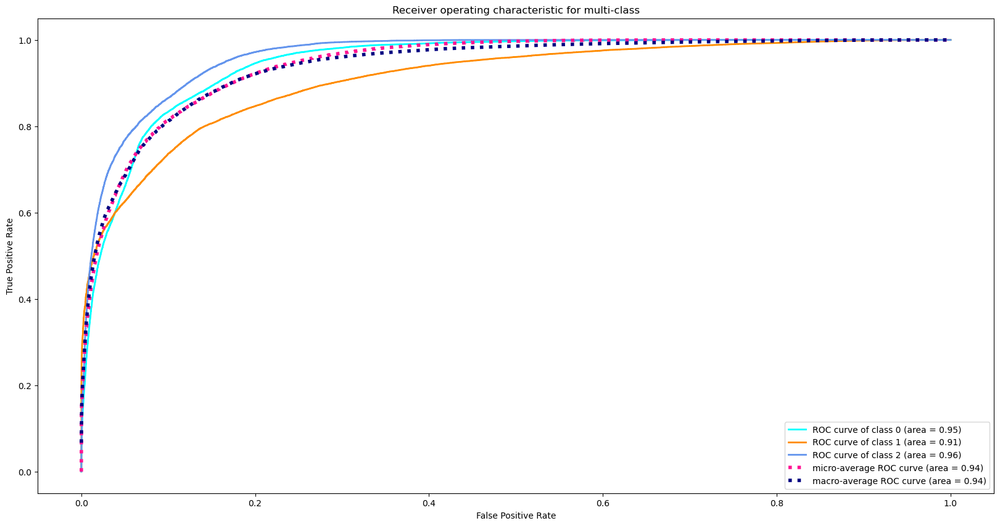

In [887]:
plot_roc_curve(train_X, train_y, 3, model2)

Looking at this graph one can see the ROC curve for the problem the group is working on. The ROC curve is a plot of the true positive rate with respect to the true false positive rate for different thresholds. One can see the different curves for each of the classes, with the area that is under each curve being the performance of that specific classifier in distinguishing a particular class from the others. The micro- average ROC is also visible, being the combination of the true and false positive rate across all the classes. Lastly, the macro-average ROC calculates the average of true positive and false positive rates for each class individually.

<a id = "interpretability"></a>

## 9. Interpretability



[Back to TOC](#toc)

Model interpretability refers to the ability to explain how a machine learning model works and why it makes certain predictions. It is becoming increasingly important as machine learning is being used more frequently in domains such as finance, healthcare, and criminal justice, where the consequences of incorrect predictions can be severe. (Or, in this case, credit risk assessment!)

One of the challenges of machine learning is that models can be quite complex, especially if they are so-called black box models. This complexity can make it difficult to understand why the model is making certain predictions and how it specifically gets to a result, leading to confusions and lack of appropriate measures upon analysis of model results. 

In this report we will aim to use 2 different model interpretability techniques: Feature Importance and SHAP. Below are our findings and considerations:

### Feature Importance

Feature importance is a powerful technique used in model interpretability that helps in understanding the relative importance of each feature in making predictions. It is calculated by examining the model's weights, coefficients, or other measures, and provides a score for each feature based on its contribution to the model's prediction. By using feature importance, we can identify the most important features that drive the model's predictions, which can help us to make informed decisions about which features to focus on for future model development.

Understanding a model's feature importance can also help to identify any potential biases or errors in the model because, by analysing the relative importance of each feature, we can detect if any features are being given too much or too little weight in the model's predictions, which can help us to adjust the model to improve its accuracy and fairness. General feature importance also can and should be analysed, in order to derive possible business conclusions and insights.

In [888]:
# Extract feature importances from the model
importances = model2.named_steps['classifier'].feature_importances_

In [889]:
# Extract original feature names from ColumnTransformer
preprocessor = model2.named_steps['processor']
num_feat_names = preprocessor.transformers_[0][2]
cat_feat_names = preprocessor.transformers_[1][1]['onehot'].get_feature_names_out(input_features=preprocessor.transformers_[1][2])
oe_feat_names = preprocessor.transformers_[2][1]['ordinal'].get_feature_names_out(input_features=preprocessor.transformers_[2][2])
feat_names = list(num_feat_names) + list(cat_feat_names) + list(oe_feat_names)

In [890]:
# Create a DataFrame with feature importances and names
feat_imp_df = pd.DataFrame({'feature': feat_names, 'importance': importances})
feat_imp_df.sort_values(by='importance', ascending=False, inplace=True)

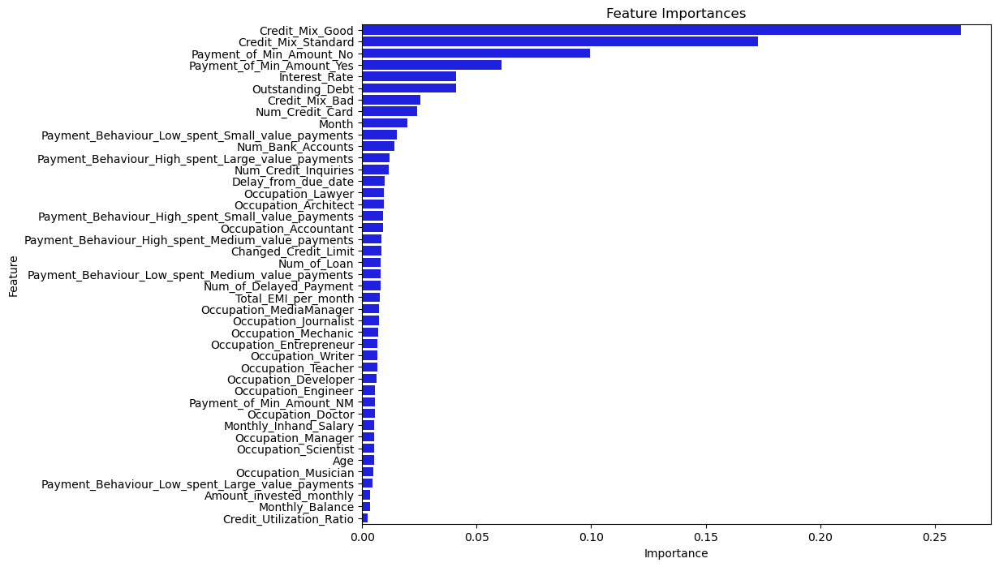

In [891]:
# Create barplot
plt.figure(figsize=(10, 8))
sns.barplot(x='importance', y='feature', data=feat_imp_df, color='blue')

# Set title and axis labels
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')

plt.show()

The feature importance analysis shows that the top two most important features for the Credit Score model are Credit Mix Good and Credit Mix Standard. This indicates that the types of credit that the individual has, such as mortgage, car loans, credit cards, and other forms of credit, are shown to be significant predictors of their credit score. This could be because we believe that individuals who have a diverse mix of credit types are generally considered more creditworthy and are more likely to have a higher credit score. This finding suggests that the Credit Score model is considering the individual's overall credit profile and not just one specific aspect of their credit history.

The third most important feature is Payment_of_Min_Amount_No, followed by Payment_of_Min_Amount_Yes, which indicates that an individual's payment behavior is an essential factor in predicting their credit score (as one could have predicted). While obvious, it is worth mentioning that individuals who pay their minimum balance due on time are more likely to have a higher credit score, while those who do not are at higher risk of defaulting on their loans, then leading, of course, to a lower credit score.

While factors such as Monthly_Inhand_Salary and Credit_Utilization_Ratio were thought by our group to be good indicators of creditworthiness, this model has ranked them relatively low in terms of feature importance. This could be due to several reasons such as, for instance, other variables in the model, such as payment behavior and credit mix, simply having a stronger impact on the model's prediction of creditworthiness. Nonetheless, it seems that an individual’s day-to-day salary does not influence their credit score as much, perhaps because its generally a more fixed value, and if the individual gets into heavier debt their salary or lack thereof is not going to be what caused them to get into such a situation, but other decisions in life.

### SHAP

SHAP (SHapley Additive exPlanations) is a framework for understanding the output of any model. It is a game-theoretic approach to explain the output of any machine learning model by assigning credit to each input feature, i.e., how much each feature contributed to the final prediction. Also, SHAP values are calculated by computing the Shapley value, a concept from cooperative game theory, for each feature, which represents the expected marginal contribution of the feature to the model's prediction when considering all possible combinations of features, enabling us to understand how the model is making predictions and to identify which features are most important in driving the predictions.

Below are our findings and considerations regarding this method:

### Test Set Shap_Values

In [892]:
# Extract the trained XGBoost model from the pipeline
xgb_model = model2.named_steps['classifier']

In [893]:
pipe4 = imbPipeline([('processor', processor),
                    ('sampling', SMOTE(random_state=42)),
                    ('selection', SelectKBest(k = 'all'))
                ])

In [894]:
train_X = pipe4.fit_transform(train_X, train_y)

In [895]:
train_X_shap = pd.DataFrame(train_X)
train_X_shap = train_X_shap.rename(columns=dict(zip(train_X_shap.columns, feat_names)))

In [898]:
# Initialize a TreeExplainer with the XGBoost model and the training data
explainer = shap.TreeExplainer(xgb_model, train_X_shap)

In [900]:
test_X = pipe4.fit_transform(test_X, test_y)

In [901]:
# Calculate SHAP values for the first 100 instances in the test set
test_X_subset = pd.DataFrame(test_X[:100])
test_X_subset = test_X_subset.rename(columns=dict(zip(test_X_subset.columns, feat_names)))
shap_values1 = explainer.shap_values(test_X_subset)

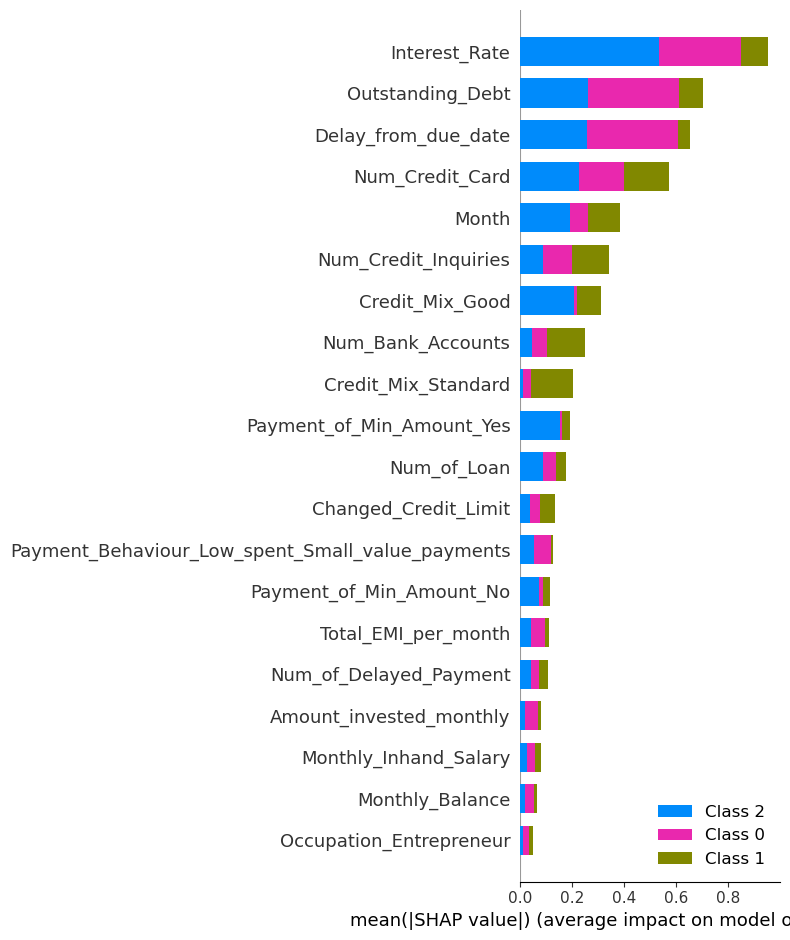

In [902]:
shap.summary_plot(shap_values1, test_X_subset, plot_type='bar')

Regarding interpretability one can see that the interest rate, outstanding debt, and month are the three most important variables when a SHAP is used. Looking with more detail, one can see that for instance, for interest rate both class 2 and class 0 have the highest impact in defining the weight of this variable in the model. This might happen, because it is easier to understand what a bad and good score are rather than an average one , which can be very subjective. 

Looking at outstanding debt, class 0 stands out a lot, which is also comprehensible as a bank would normally assume that a client with a Bad credit score would have more outstanding debt rather than a client with a Good or Average score.

Furthermore, the fact that Month comes up as the third most important variable is also interesting as one would assume that the timeframe which you might ask for a loan wouldn’t have an impact in your credit score. One possible explanation can be related with the macroeconomic environment in that timeframe. If in a given month, for instance, inflation and interest rates are high, that will probably have an impact in the loan capacity of a bank, therefore the institution might be more careful when understanding what the credit score of its customers is. 

Looking at the rest of the variables , one can see that there is a marginal decrease in the feature’s importance until the Credit Mix Standard. Another conclusion one can see from the graph is related with the big importance that class 1 has for the Credit Mix Standard importance. If one assumes that clients belonging to class 1 are “regular” people, it is normal for them to have a lot of loans, whether house mortgage or car mortgage, etc., therefore, one might expect that this class would be important in defining the importance of Credit Mix Standard.

### Training Set Shap_Values

In [903]:
train_X_subset = pd.DataFrame(train_X[:100])
train_X_subset = train_X_subset.rename(columns=dict(zip(train_X_subset.columns, feat_names)))
shap_values2 = explainer.shap_values(train_X_subset)

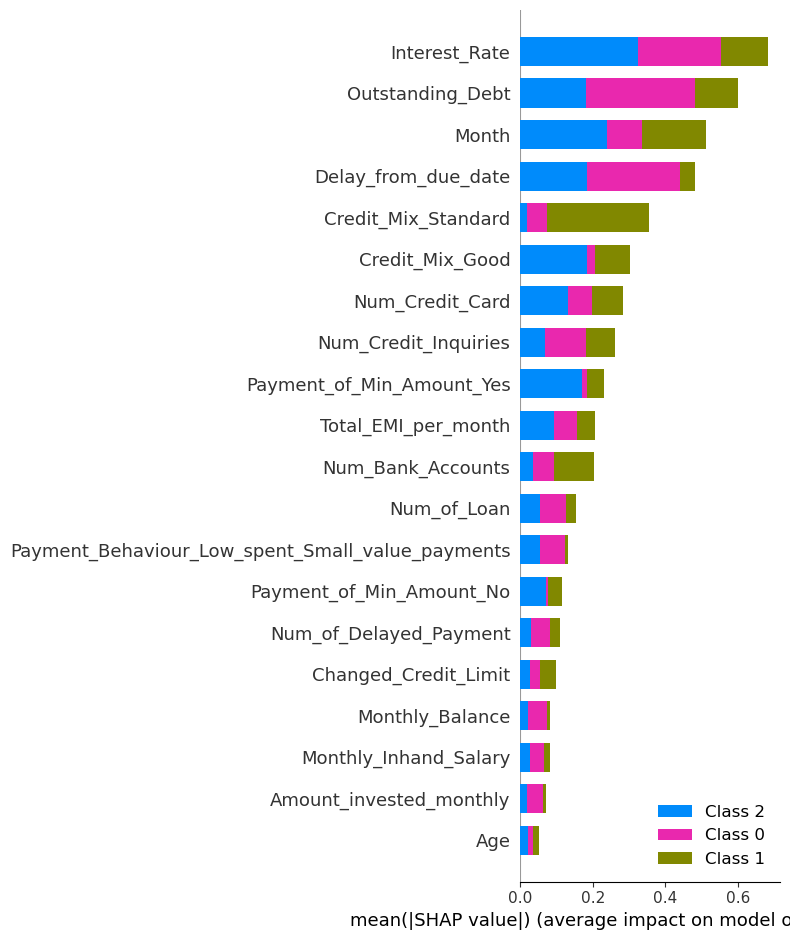

In [904]:
shap.summary_plot(shap_values2, train_X_subset, plot_type='bar')

### Training Set Beeswarm Plot

In [905]:
# convert shap_values2 list to 2D numpy array
shap_values2 = np.array(shap_values2)

In [906]:
# create a pandas DataFrame from train_X_subset and shap_values2
df = pd.concat([train_X_subset.reset_index(drop=True), pd.DataFrame(shap_values2[0])], axis=1)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


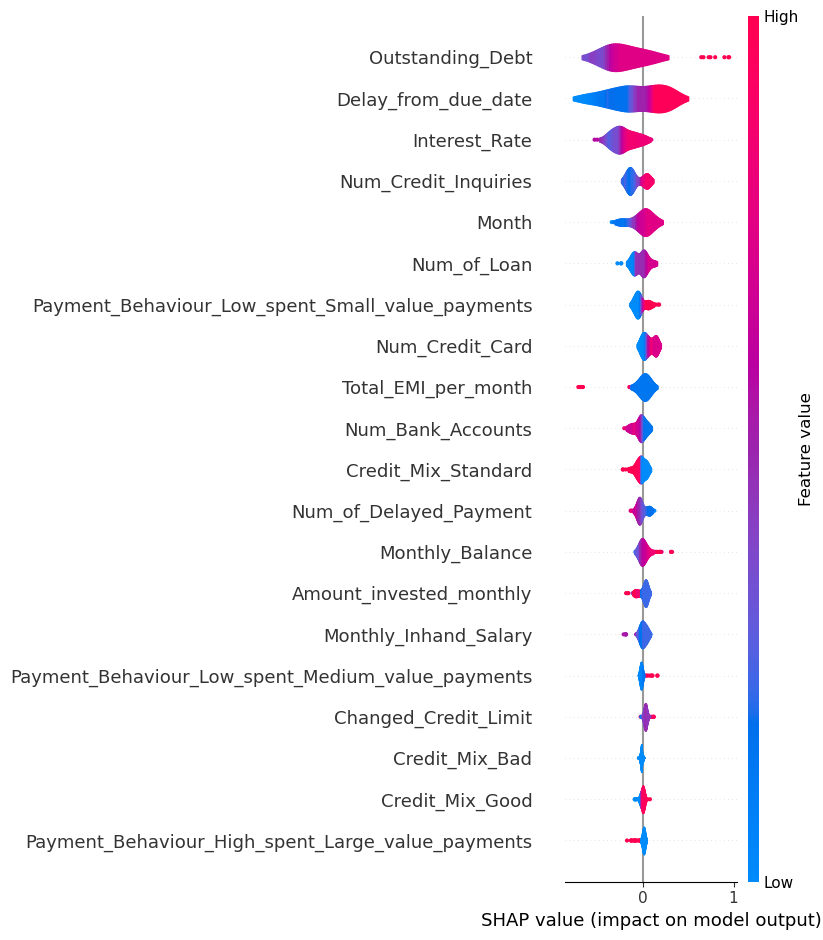

In [907]:
# plot the beeswarm plot
shap.summary_plot(shap_values2[0], train_X_subset, plot_type="violin")

Regarding training data, looking at this graph and the one above, one can see that Outstanding Debt and Delay from Due Date seem to be the variables with the highest impact in the model output regarding the training data, given the values of each of the variables. 

For the outstanding debt, it is understandable that for a negative SHAP value, the feature importance decreases, because banks are more worried if outstanding debt is very high not necessarily very the other way around. Therefore, as the outstanding debt values increase, the more important they are in estimating the Credit Scores of a given client. 

The same reasoning can be applied to the Delay from Due Date, as for a positive SHAP value of this variable, its importance increases a lot as once again, banks expect its customers to pay the whole loan amount at the right date. 

Regarding the remaining variables, one can see that the range of SHAP values is small, therefore being difficult to understand in detail why a given feature impacts the model’s output or not.